In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import os
from time import time
from pathlib import Path
import copy


from umap import UMAP
import leidenalg as la

import anndata as ad
import scanpy as sc


from tysserand import tysserand as ty
from mosna import mosna






In [75]:
net_dir = Path("./OUTPUT_arcsinh/states/leiden_states/nodes_et_edges")
nodes = pd.read_parquet(net_dir/"nodes_patient-1_sample-1.parquet")

In [78]:
nodes["Phenotype"].unique()

array(['Mesenchymal tumour', 'CAF', 'Tumour cells (KRT17+)', 'Monocyte',
       'Tumour cells (KRT17-)', 'Macrophage_state_0', 'Unknown',
       'CD8 T Cell', 'CD4 T Cell', 'Epithelial Cell', 'Endothelial Cell',
       'DC', 'Macrophage_state_2', 'Treg cell', 'Macrophage_state_1'],
      dtype=object)

In [76]:
(nodes["Phenotype"] == "Macrophage").sum()

np.int64(0)

# Assorativity 

## Calculs stats assortativité

In [110]:
#c'est les paramètres pour calculer asortativity avec mosna.groups_assort_mixmat
save_dir = Path("./OUTPUT_arcsinh/assortativity")
net_dir = Path("./OUTPUT_arcsinh/nodes_et_edges")
#net_dir doit contenir nodes et edges dans au même endroit
attributes_col = 'Phenotype'
id_level_1 = 'patient'
id_level_2 = 'sample'
memory_limit = '100GB'
n_shuffle = 1000
extension = 'parquet'
parallel_groups= 45

stats_data = mosna.groups_assort_mixmat(net_dir= net_dir, attributes_col= attributes_col, make_onehot = True, id_level_1=id_level_1, id_level_2=id_level_2,extension=extension,parallel_groups=parallel_groups, n_shuffle=n_shuffle, memory_limit=memory_limit)
                                      
#je save stats d'assort

save_dir = save_dir
save_dir.mkdir(parents = True, exist_ok=True)
stats_data.to_parquet(save_dir / "group_stats_data_assortativity.parquet")

2026-07-27 18:38:20,987 - distributed.nanny - WARNING - Worker process still alive after 4.0 seconds, killing
2026-07-27 18:38:20,990 - distributed.nanny - WARNING - Worker process still alive after 4.0 seconds, killing
2026-07-27 18:38:20,992 - distributed.nanny - WARNING - Worker process still alive after 4.0 seconds, killing
2026-07-27 18:38:20,993 - distributed.nanny - WARNING - Worker process still alive after 4.0 seconds, killing
2026-07-27 18:38:20,993 - distributed.nanny - WARNING - Worker process still alive after 4.0 seconds, killing
2026-07-27 18:38:20,994 - distributed.nanny - WARNING - Worker process still alive after 4.0 seconds, killing
2026-07-27 18:38:20,994 - distributed.nanny - WARNING - Worker process still alive after 4.0 seconds, killing
2026-07-27 18:38:20,995 - distributed.nanny - WARNING - Worker process still alive after 4.0 seconds, killing
2026-07-27 18:38:20,995 - distributed.nanny - WARNING - Worker process still alive after 4.0 seconds, killing
2026-07-27

In [5]:
stats_data.columns

Index(['id', '# total', '% B Cell', '% CAF', '% CD4 T Cell', '% CD8 T Cell',
       '% DC', '% Endothelial Cell', '% Epithelial Cell',
       '% Macrophage_state_1',
       ...
       'Macrophage_state_2 - Macrophage_state_2 Z',
       'Macrophage_state_3 - Macrophage_state_2 Z',
       'Mesenchymal tumour - Macrophage_state_2 Z',
       'Monocyte - Macrophage_state_2 Z', 'Treg cell - Macrophage_state_2 Z',
       'Tumour cells (KRT17+ S100A2+) - Macrophage_state_2 Z',
       'Tumour cells (KRT17+ S100A2-) - Macrophage_state_2 Z',
       'Tumour cells (KRT17- S100A2+) - Macrophage_state_2 Z',
       'Tumour cells (KRT17- S100A2-) - Macrophage_state_2 Z',
       'Unknown - Macrophage_state_2 Z'],
      dtype='object', length=708)

## Plots (heatmaps assortativity, barplot abundance, PCA)

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import os
from time import time
from pathlib import Path
import copy


from umap import UMAP
import leidenalg as la

import anndata as ad
import scanpy as sc

### Paramètres et données

In [139]:


# récup stats data sans le générer
save_dir = Path("./OUTPUT_arcsinh/states/corrected_double_status_tumour_and_macrostates_labeled/leiden_states/assortativity/500_shuffles")
stats_data = pd.read_parquet(save_dir / "group_stats_data_assortativity.parquet")

#je récup métainfos
info_metadata_path = Path('./images_metadatainfo.csv')
metadata = pd.read_csv(info_metadata_path)

In [140]:
#Je recupère patient et sample en pour chaque ligne de metainfo data et je mets ça dans colonne image sachant que de la forme 4 derniers chiffre = 2 premiers patient, deux derniere sample

import re
metadata = metadata.copy()

metadata["patient"] = metadata["image"].str[6:8]
metadata["sample"] = metadata["image"].str[8:10]

metadata["id"] = "patient-" + metadata["patient"] + "_sample-" + metadata["sample"]


metadata = metadata.set_index('id')

metadata.index = (
    metadata.index
    .astype(str)
    .map(
        lambda x: re.sub(r'(\D)0+(\d+)', r'\1\2', x)
    )
)

metadata.head()

,image,width_px,height_px,num_channels,source_file,recovery_file,recovered,original image ID,Notes,Patient ID,For tumour only analysis,Pathology,Stage,Grade,Location in pancrea,Treatment before tissue collection,Diabetes,Pancreatitis,patient,sample
id,,,,,,,,,,,,,,,,,,,,
patient-1_sample-3,hPDAC_0103,1968,1089,38,S0868_M Chihara-Slide_01_Dysplasia_x32670_y119...,NaN,False,S0868_M Chihara-Slide_01_Dysplasia_x32670_y119...,dysplasia,A22TLYZ04-01,No,Moderately differentiated ductal carcinoma,III,2,Head,No,No,No,01,03
patient-1_sample-4,hPDAC_0104,1395,1578,38,S0868_M Chihara-Slide_01_adjacent normal_x1679...,NaN,False,S0868_M Chihara-Slide_01_adjacent normal_x1679...,adjacent normal,A22TLYZ04-01,No,Moderately differentiated ductal carcinoma,III,2,Head,No,No,No,01,04
patient-1_sample-2,hPDAC_0102,1395,1578,38,S0868_M Chihara-Slide_01_adjacent stroma_x2139...,NaN,False,S0868_M Chihara-Slide_01_adjacent stroma_x2139...,tumour stroma,A22TLYZ04-01,Yes,Moderately differentiated ductal carcinoma,III,2,Head,No,No,No,01,02
patient-1_sample-1,hPDAC_0101,1439,1534,38,S0868_M Chihara-Slide_01_tumour centre_x20222_...,NaN,False,S0868_M Chihara-Slide_01_tumour centre_x20222_...,tumour centre,A22TLYZ04-01,Yes,Moderately differentiated ductal carcinoma,III,2,Head,No,No,No,01,01
patient-2_sample-3,hPDAC_0203,1432,1472,38,S0869_M Chihara-Slide_02_adjacent stroma_1_x31...,NaN,False,S0869_M Chihara-Slide_02_adjacent stroma_1_x31...,tumour stroma,A22TLYZ04-02,Yes,Moderately differentiated ductal carcinoma,III,2,Head,"Yes, chemotherapy",No,No,02,03


In [141]:
#je récupère net_stat = stats_data (données stats assort) mais avec localisation précisée (region_grouped)

net_stat = stats_data.copy()

net_stat = net_stat.set_index('id')
net_stat = net_stat.join(metadata, how='inner')
#on standarise les noms de pathologie pour éviter les problèmes de mapping, parfois poorly est écrit avec un p minuscule et parfois avec un P majuscule.
net_stat['Pathology'] = net_stat['Pathology'].map({
    'Moderately differentiated ductal carcinoma':'Moderately differentiated ductal carcinoma',
    'Poorly differentiated ductal carcinoma':'Poorly differentiated ductal carcinoma',
    'poorly differentiated ductal carcinoma':'Poorly differentiated ductal carcinoma'})
mapping = {
    'tumour': 'Tumour',
    'tumour centre': 'Tumour',
    'tumour_invasive area': 'Tumour',
    'tumour + islets': 'Tumour',
    'tumour incl. stroma and islets': 'Tumour',
    'tumor intraductal spread': 'Tumour',

    'tumour stroma': 'Tumour_stroma',
    'adjacent stroma': 'Tumour_stroma',

    'dysplasia': 'Dysplasia',
    'dysplasia + islets': 'Dysplasia',

    'adjacent normal': 'Adjacent_normal'
}
net_stat['region_grouped'] = net_stat['Notes'].map(mapping)
net_stat = net_stat.reset_index()

net_stat.head()


,id,# total,% B Cell,% CAF,% CD4 T Cell,% CD8 T Cell,% DC,% Endothelial Cell,% Epithelial Cell,% Macrophage_state_0,...,Pathology,Stage,Grade,Location in pancrea,Treatment before tissue collection,Diabetes,Pancreatitis,patient,sample,region_grouped
0,patient-4_sample-1,14836,0.002090,0.419790,0.057900,0.023659,0.017525,0.047250,0.003235,0.028647,...,Poorly differentiated ductal carcinoma,IIB,3,Neck,No,Yes,No,04,01,Tumour
1,patient-9_sample-4,10252,0.001171,0.112173,0.010827,0.065938,0.014534,0.000488,0.107979,0.009559,...,Moderately differentiated ductal carcinoma,IIB,2,Head/Neck,No,Yes,No,09,04,Dysplasia
2,patient-4_sample-5,17576,0.000341,0.182920,0.012745,0.027139,0.008307,0.001195,0.555473,0.025148,...,Poorly differentiated ductal carcinoma,IIB,3,Neck,No,Yes,No,04,05,Adjacent_normal
3,patient-1_sample-4,17213,0.003079,0.272759,0.064777,0.065358,0.014756,0.006971,0.375356,0.037936,...,Moderately differentiated ductal carcinoma,III,2,Head,No,No,No,01,04,Adjacent_normal
4,patient-8_sample-2,13913,0.001509,0.422051,0.046360,0.039675,0.012578,0.008553,0.001509,0.067060,...,Poorly differentiated ductal carcinoma,IIB,3,Neck/Body,No,Yes,Not confirmed,08,02,Tumour


### Fonctions

In [142]:
def pourcentage_only(index_col,data):
    #je choisis que les colonnes z score et je retire la colonne "assort Z"
    databar = []
    colonnes_pourcentage = [col for col in stats_data.columns if col.startswith("%")]
    data_bar = data[[index_col, "region_grouped"] + colonnes_pourcentage]
    return data_bar



In [143]:
# colonne id = colonne patient_sample

def Z_scores_only(stats_data):
    #je choisis que les colonnes z score et je retire la colonne "assort Z"
    heatmap = []
    colonnes_Z = [col for col in stats_data.columns if col.endswith("Z")]
    data_heatmap = stats_data[["id"] + colonnes_Z]
    data_heatmap = data_heatmap.drop(columns ="assort Z")
    return data_heatmap

def Z_scores_only_index(stats_data):
    #je choisis que les colonnes z score et je retire la colonne "assort Z"
    
    heatmap = []
    id_col = "id" if "id" in stats_data.columns else stats_data.columns[0]

    colonnes_Z = [col for col in stats_data.columns if col.endswith("Z")]

    data_heatmap = stats_data[[id_col] + colonnes_Z].copy()

    data_heatmap = data_heatmap.drop(columns=["assort Z"], errors="ignore")
    
    return data_heatmap


def données_ligne_en_matrice(data):
#Je prend les données de mosna.groups_assort_mixmat avec seulement les z scores et la colonne id et j'en fais une matrice 
    cols = data.columns
    vals = data.iloc[0]

    df = pd.DataFrame({
        "interaction": cols,
        "Z": vals.values
    })
    
    df["interaction"] = df["interaction"].str.replace(" Z", "", regex=False)
    df[["source", "target"]] = df["interaction"].str.split(" - ", expand=True)
    
    mat = df.pivot(index="source", columns="target", values="Z")
    mat = mat.apply(pd.to_numeric, errors="coerce")

    return mat


def heatmap(data_heatmap,chemin, diag= True):
##fonction pour enregistrer toutes les heatmaps dans un dossier path = chemin
# data_heatmap c'est les données de mosna.groups_assort_mixmat avec seulement les z scores et la colonne id je vais en faire une matrice et une heat map 
# diag = bool, par défaut = True, si =false, ça va retirer la diagonale dans la heat map
    for i in range(len(data_heatmap)):
        temp = data_heatmap.iloc[[i]]
        sample = temp["id"].iloc[0]
        temp = temp.drop(columns="id")
        
        
        matrice = données_ligne_en_matrice(temp)
        matrice = matrice.combine_first(matrice.T)
        if diag == False :
            np.fill_diagonal(matrice.values, np.nan)
            matrice = matrice.combine_first(matrice.T)

        matrice = matrice.replace([np.inf, -np.inf], 0)
        fig = plt.figure(figsize=(12, 10))
        ax = sns.heatmap(matrice, cmap="coolwarm", center=0)
        ax.set_title(f"Heatmap {sample}")
        
        enregistrement = os.path.join(chemin,f'heatmap {sample}')

        plt.savefig(enregistrement,bbox_inches="tight")
        plt.close(fig)

def heatmap_index(data_heatmap,chemin, diag= True):
##fonction pour enregistrer toutes les heatmaps dans un dossier path = chemin
# data_heatmap c'est les données de mosna.groups_assort_mixmat avec seulement les z scores et la colonne id je vais en faire une matrice et une heat map 
# diag = bool, par défaut = True, si =false, ça va retirer la diagonale dans la heat map
    for i in range(len(data_heatmap)):
        temp = data_heatmap.iloc[[i]]
        sample = temp["index"].iloc[0]
        temp = temp.drop(columns="index")
        
        
        matrice = données_ligne_en_matrice(temp)
        matrice = matrice.combine_first(matrice.T)
        if diag == False :
            np.fill_diagonal(matrice.values, np.nan)
            matrice = matrice.combine_first(matrice.T)

        matrice = matrice.replace([np.inf, -np.inf], 0)
        fig = plt.figure(figsize=(12, 10))
        ax = sns.heatmap(matrice, cmap="coolwarm", center=0)
        ax.set_title(f"Heatmap {sample}")
        
        enregistrement = os.path.join(chemin,f'heatmap {sample}')

        plt.savefig(enregistrement)
        plt.close(fig)

#def tableau_heatmap(data_heatmap,chemin):
    



### Heatmaps assortativité par image (une heatmap par image = patient_sample)

In [117]:
#heat map par fichier nodes

data_heatmap = Z_scores_only(stats_data)
chemin = Path(save_dir / "assort_heatmaps")
chemin.mkdir(exist_ok= True)
heatmap(data_heatmap,chemin,)

In [118]:
#heat map par fichier nodes sans la diag

data_heatmap = Z_scores_only(stats_data)
chemin = Path(save_dir / "assort_heatmaps_sans_diag")
chemin.mkdir(exist_ok= True)
heatmap(data_heatmap,chemin, diag = False)

### Heatmap unique assort et bar plot abundance cell pour tous les patients avec metainfos (ROIs des images) 

In [119]:
#création de la palette pour la heatmap/dendrogramme par label (tumeur, normal, dysplasia, stroma)

location_series = net_stat.loc[:, "region_grouped"]

unique_locations = location_series.dropna().unique()
palette = sns.color_palette("Set3", n_colors=len(unique_locations))
location_to_color = dict(zip(unique_locations, palette))




In [120]:
#palette prédéfinie manuellement
location_to_color = {
'Tumour_stroma': (1.0, 1.0, 0.7019607843137254) ,
'Tumour': (0.984313725490196, 0.5019607843137255, 0.4470588235294118),
'Dysplasia':(0.5529411764705883, 0.8274509803921568, 0.7803921568627451) ,
'Adjacent_normal':(0.7450980392156863, 0.7294117647058823, 0.8549019607843137)}

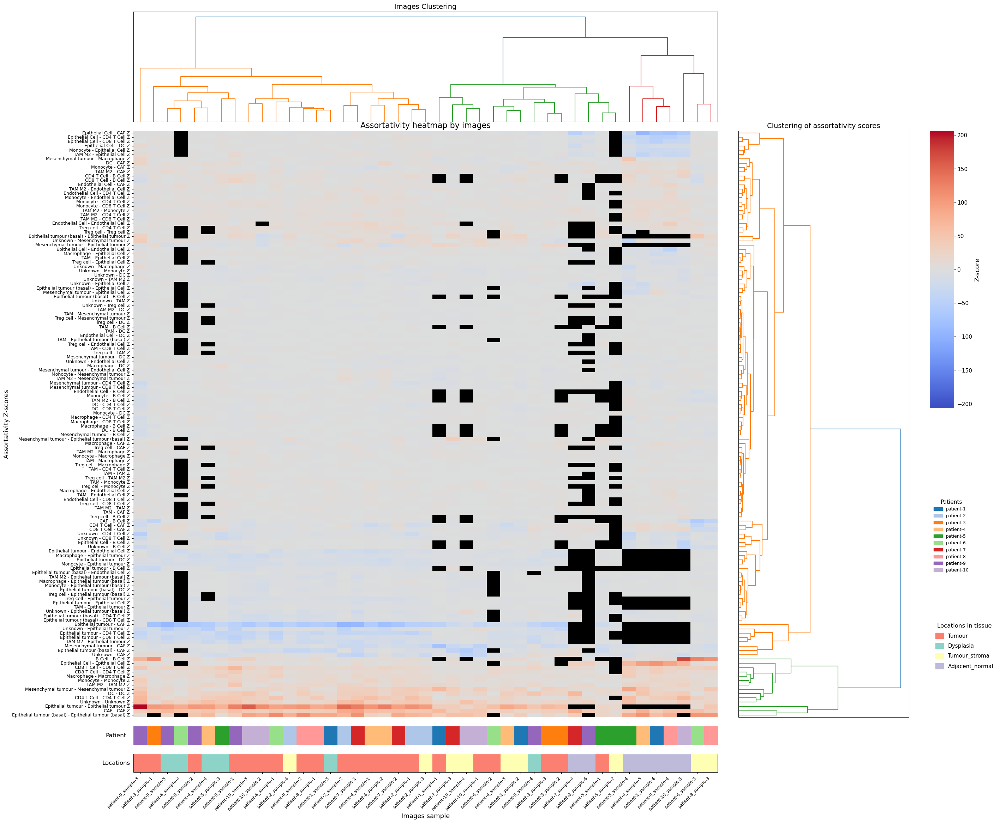

In [121]:
#dengrogramme avec label de location et heatmap avec les z scores de mosna.groups_assort_mixmat
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches

from matplotlib.colors import ListedColormap, TwoSlopeNorm
from matplotlib.gridspec import GridSpec
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist



# ------------------------------------------------------------------
# 1. Préparation des données
# ------------------------------------------------------------------

net_stat_indexed = net_stat.set_index("id").copy()

assort_cols = net_stat_indexed.columns[net_stat_indexed.columns.str.endswith(" Z")]
assort_cols = [col for col in assort_cols if col != "assort Z"]

heatmap_data = net_stat_indexed[assort_cols].T.astype(float)
heatmap_data = heatmap_data.replace([np.inf, -np.inf], np.nan)
heatmap_data = heatmap_data.dropna(axis=0, how="all")
heatmap_data = heatmap_data.dropna(axis=1, how="all")

# ------------------------------------------------------------------
# 2. Clustering des colonnes et des lignes
# ------------------------------------------------------------------

cluster_matrix_cols = heatmap_data.T.fillna(0)
col_linkage = linkage(pdist(cluster_matrix_cols, metric="euclidean"), method="ward")

cluster_matrix_rows = heatmap_data.fillna(0)
row_linkage = linkage(pdist(cluster_matrix_rows, metric="euclidean"), method="ward")

# ------------------------------------------------------------------
# 3. Ordre des feuilles
# ------------------------------------------------------------------

col_dendro_preview = dendrogram(col_linkage, no_plot=True)
col_leaf_order = col_dendro_preview["leaves"]

row_dendro_preview = dendrogram(row_linkage, no_plot=True)
row_leaf_order = row_dendro_preview["leaves"]

heatmap_data = heatmap_data.iloc[row_leaf_order, col_leaf_order]

# ------------------------------------------------------------------
# 4. Bande de couleur pour la location
# ------------------------------------------------------------------

location_series = net_stat_indexed.loc[heatmap_data.columns, "region_grouped"]


unique_locations = location_series.dropna().unique()
if location_to_color == None:
    palette = sns.color_palette("Set3", n_colors=len(unique_locations))
    location_to_color = dict(zip(unique_locations, palette))

location_to_int = {loc: i for i, loc in enumerate(unique_locations)}
location_ints = np.array([location_to_int.get(loc, -1) for loc in location_series])

annotation_colors = [
    location_to_color[loc]
    for loc in unique_locations
]
if (location_ints == -1).any():
    annotation_colors.append((0.0, 0.0, 0.0))
    missing_index = len(annotation_colors) - 1
    location_ints = np.where(location_ints == -1, missing_index, location_ints)

location_cmap = ListedColormap(annotation_colors)

# ------------------------------------------------------------------
# Annotation patient
# ------------------------------------------------------------------

patient_series = pd.Series(
    heatmap_data.columns.str.split("_").str[0],
    index=heatmap_data.columns
)

unique_patients = sorted(
    patient_series.unique(),
    key=lambda x: int(x.split("-")[-1])
)


patient_palette = sns.color_palette(
    "tab20",
    n_colors=len(unique_patients)
)

patient_to_color = dict(
    zip(unique_patients, patient_palette)
)

patient_to_int = {
    pat: i
    for i, pat in enumerate(unique_patients)
}

patient_ints = np.array(
    [patient_to_int[p] for p in patient_series]
)

patient_cmap = ListedColormap(
    [patient_to_color[p] for p in unique_patients]
)

# ------------------------------------------------------------------
# 5. Normalisation de la heatmap
# ------------------------------------------------------------------

vals = heatmap_data.to_numpy()
valid_vals = vals[~np.isnan(vals)]

if valid_vals.size == 0:
    raise ValueError("La matrice ne contient aucune valeur exploitable.")

zlim = np.nanmax(np.abs(valid_vals))
norm = TwoSlopeNorm(vmin=-zlim, vcenter=0, vmax=zlim)

cmap = plt.cm.coolwarm.copy()
cmap.set_bad(color="black")

# ------------------------------------------------------------------
# 6. Mise en page
# ------------------------------------------------------------------

fig = plt.figure(figsize=(30, 28))

gs = GridSpec(
    nrows=4,
    ncols=3,
    width_ratios=[24, 7, 1],
    height_ratios=[3, 16, 0.5, 0.5],
    wspace=0.08,
    hspace=0.05
)



ax_dendro_col = fig.add_subplot(gs[0, 0])
ax_heat = fig.add_subplot(gs[1, 0])

ax_patient = fig.add_subplot(gs[2, 0], sharex=ax_heat)
ax_loc     = fig.add_subplot(gs[3, 0], sharex=ax_heat)



ax_dendro_row = fig.add_subplot(gs[1, 1])

right_gs = gs[1, 2].subgridspec(
    nrows=2,
    ncols=1,
    height_ratios=[5, 4],
    hspace=0.35
)

cbar_ax = fig.add_subplot(right_gs[0, 0])
legend_ax = fig.add_subplot(right_gs[1, 0])

ax_top_unused_1 = fig.add_subplot(gs[0, 1])
ax_top_unused_2 = fig.add_subplot(gs[0, 2])
#ax_bottom_unused_1 = fig.add_subplot(gs[2, 1])
#ax_bottom_unused_2 = fig.add_subplot(gs[2, 2])

ax_bottom_unused_1 = fig.add_subplot(gs[3, 1])
ax_bottom_unused_2 = fig.add_subplot(gs[3, 2])

ax_top_unused_1.axis("off")
ax_top_unused_2.axis("off")
ax_bottom_unused_1.axis("off")
ax_bottom_unused_2.axis("off")

# ------------------------------------------------------------------
# 7. Dendrogramme des colonnes
# ------------------------------------------------------------------

dendrogram(
    col_linkage,
    ax=ax_dendro_col,
    no_labels=True,
    color_threshold=None
)

ax_dendro_col.set_xticks([])
ax_dendro_col.set_yticks([])
ax_dendro_col.set_xlabel("")
ax_dendro_col.set_ylabel("")
ax_dendro_col.set_title("Images Clustering", fontsize=14)

# ------------------------------------------------------------------
# 8. Heatmap principale
# ------------------------------------------------------------------

sns.heatmap(
    heatmap_data,
    cmap=cmap,
    center=0,
    vmin=-zlim,
    vmax=zlim,
    ax=ax_heat,
    cbar_ax=cbar_ax,
    cbar_kws={"label": "Z-score"},
    yticklabels=heatmap_data.index,
    xticklabels=False
)

ax_heat.set_ylabel("Assortativity Z-scores", fontsize=13)
ax_heat.set_xlabel("")
ax_heat.set_title("Assortativity heatmap by images", fontsize=16)
ax_heat.tick_params(axis="x", bottom=False, labelbottom=False)
ax_heat.tick_params(axis="y", labelsize=9)

# On garde les labels de lignes à gauche de la heatmap.
ax_heat.yaxis.tick_left()
ax_heat.yaxis.set_label_position("left")

# ------------------------------------------------------------------
# 9. Dendrogramme des lignes
# ------------------------------------------------------------------

dendrogram(
    row_linkage,
    ax=ax_dendro_row,
    orientation="right",
    no_labels=True,
    color_threshold=None
)

ax_dendro_row.set_xticks([])
ax_dendro_row.set_yticks([])
ax_dendro_row.set_xlabel("")
ax_dendro_row.set_ylabel("")
ax_dendro_row.set_title("Clustering of assortativity scores", fontsize=14)

n_rows = heatmap_data.shape[0]
ax_dendro_row.set_ylim(10 * n_rows, 0)

# ------------------------------------------------------------------
# 10. Bande patient
# ------------------------------------------------------------------

ax_patient.imshow(
    patient_ints[np.newaxis, :],
    aspect="auto",
    cmap=patient_cmap,
    interpolation="nearest",
    extent=[0, len(patient_ints), 0, 1]
)

# Titre de la bande
ax_patient.set_ylabel(
    "Patient",
    rotation=0,
    labelpad=35,
    va="center",
    fontsize=12
)

# Supprime tout axe visible
ax_patient.set_yticks([])
ax_patient.set_xticks([])
ax_patient.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

# Optionnel : enlever les bordures
for spine in ax_patient.spines.values():
    spine.set_visible(False)



# ------------------------------------------------------------------
# 10. Bande de location
# ------------------------------------------------------------------

ax_loc.imshow(
    location_ints[np.newaxis, :],
    aspect="auto",
    cmap=location_cmap,
    interpolation="nearest",
    extent=[0, len(location_ints), 0, 1]
)

ax_loc.set_yticks([])
ax_loc.set_ylabel("Locations", rotation=0, labelpad=35, va="center", fontsize=12)

x_centers = np.arange(len(heatmap_data.columns)) + 0.5
ax_loc.set_xticks(x_centers)
ax_loc.set_xticklabels(heatmap_data.columns, rotation=45, ha="right", fontsize=9)
ax_loc.set_xlim(0, len(location_ints))
ax_loc.set_xlabel("Images sample", fontsize=13)

# ------------------------------------------------------------------
# 11. Colorbar et légende
# ------------------------------------------------------------------

cbar_ax.tick_params(labelsize=11)
cbar_ax.set_ylabel("Z-score", fontsize=13)

legend_ax.axis("off")

# --------------------------
# Patient legend
# --------------------------

patient_handles = [
    mpatches.Patch(
        color=patient_to_color[p],
        label=p
    )
    for p in unique_patients
]

legend_patient = legend_ax.legend(
    handles=patient_handles,
    title="Patients",
    loc="upper left",
    bbox_to_anchor=(0, 1),
    frameon=False,
    fontsize=9,
    title_fontsize=11,
    ncol=1
)

legend_ax.add_artist(legend_patient)

# --------------------------
# Location legend
# --------------------------

location_handles = [
    mpatches.Patch(
        color=location_to_color[loc],
        label=loc
    )
    for loc in unique_locations
]

legend_ax.legend(
    handles=location_handles,
    title="Locations in tissue",
    loc="upper left",
    bbox_to_anchor=(0, 0.45),
    frameon=False,
    fontsize=11,
    title_fontsize=12,
    handlelength=1.5,
    handleheight=1.2,
    labelspacing=0.8,
    borderpad=0.6
)
plt.savefig(save_dir / "labeled_assort_group_heatmap_dendro.png", bbox_inches="tight")
plt.show()


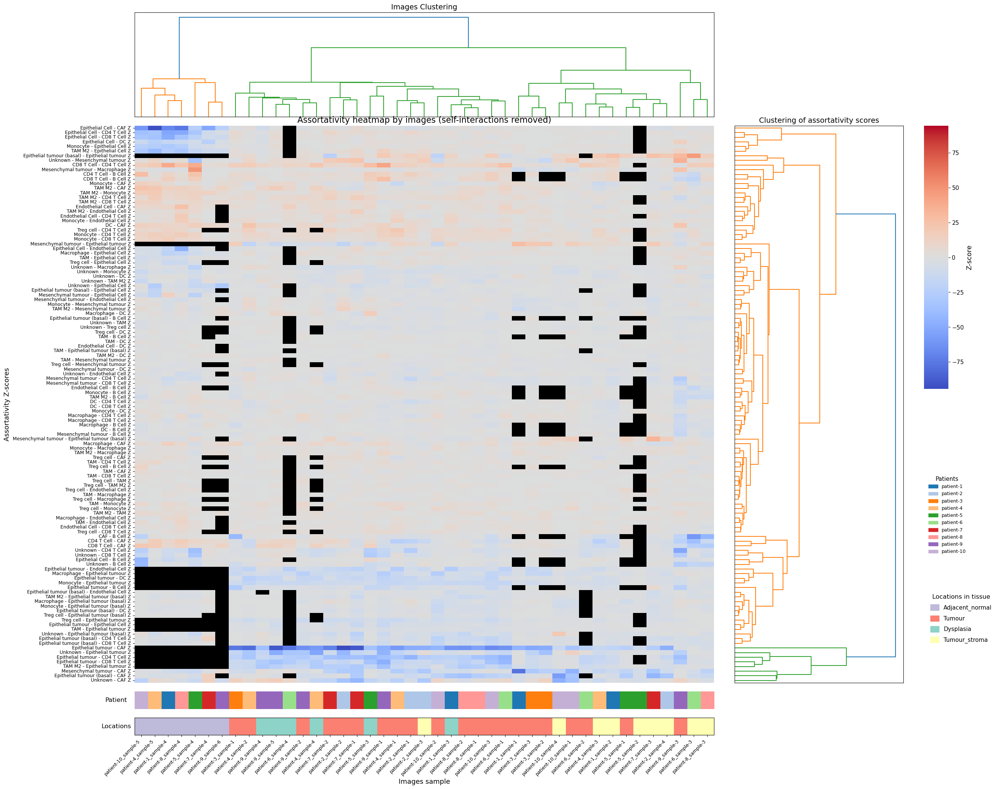

In [122]:
#dengrogramme sans diag avec label de location et heatmap avec les z scores de mosna.groups_assort_mixmat
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches

from matplotlib.colors import ListedColormap, TwoSlopeNorm
from matplotlib.gridspec import GridSpec
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist



# ------------------------------------------------------------------
# 1. Préparation des données
# ------------------------------------------------------------------

net_stat_indexed = net_stat.set_index("id").copy()

assort_cols = net_stat_indexed.columns[net_stat_indexed.columns.str.endswith(" Z")]
assort_cols = [col for col in assort_cols if col != "assort Z"]

heatmap_data = net_stat_indexed[assort_cols].T.astype(float)

# Masquer les interactions cellule-cellule identiques
same_cell_rows = []

for row_name in heatmap_data.index:

    # enlève le suffixe " Z"
    pair = row_name.replace(" Z", "")

    # sépare "A - B"
    if " - " in pair:
        cell_a, cell_b = pair.split(" - ", 1)

        if cell_a.strip() == cell_b.strip():
            same_cell_rows.append(row_name)

# Remplace toutes les valeurs de ces lignes par NaN
heatmap_data.loc[same_cell_rows] = np.nan

heatmap_data = heatmap_data.replace([np.inf, -np.inf], np.nan)
heatmap_data = heatmap_data.dropna(axis=0, how="all")
heatmap_data = heatmap_data.dropna(axis=1, how="all")

# ------------------------------------------------------------------
# 2. Clustering des colonnes et des lignes
# ------------------------------------------------------------------

cluster_matrix_cols = heatmap_data.T.fillna(0)
col_linkage = linkage(pdist(cluster_matrix_cols, metric="euclidean"), method="ward")

cluster_matrix_rows = heatmap_data.fillna(0)
row_linkage = linkage(pdist(cluster_matrix_rows, metric="euclidean"), method="ward")

# ------------------------------------------------------------------
# 3. Ordre des feuilles
# ------------------------------------------------------------------

col_dendro_preview = dendrogram(col_linkage, no_plot=True)
col_leaf_order = col_dendro_preview["leaves"]

row_dendro_preview = dendrogram(row_linkage, no_plot=True)
row_leaf_order = row_dendro_preview["leaves"]

heatmap_data = heatmap_data.iloc[row_leaf_order, col_leaf_order]



# ------------------------------------------------------------------
# 4. Bande de couleur pour la location
# ------------------------------------------------------------------

location_series = net_stat_indexed.loc[heatmap_data.columns, "region_grouped"]


unique_locations = location_series.dropna().unique()
if location_to_color == None:
    palette = sns.color_palette("Set3", n_colors=len(unique_locations))
    location_to_color = dict(zip(unique_locations, palette))

location_to_int = {loc: i for i, loc in enumerate(unique_locations)}
location_ints = np.array([location_to_int.get(loc, -1) for loc in location_series])

annotation_colors = [
    location_to_color[loc]
    for loc in unique_locations
]
if (location_ints == -1).any():
    annotation_colors.append((0.0, 0.0, 0.0))
    missing_index = len(annotation_colors) - 1
    location_ints = np.where(location_ints == -1, missing_index, location_ints)

location_cmap = ListedColormap(annotation_colors)

# ------------------------------------------------------------------
# Annotation patient
# ------------------------------------------------------------------

patient_series = pd.Series(
    heatmap_data.columns.str.split("_").str[0],
    index=heatmap_data.columns
)

unique_patients = sorted(
    patient_series.unique(),
    key=lambda x: int(x.split("-")[-1])
)


patient_palette = sns.color_palette(
    "tab20",
    n_colors=len(unique_patients)
)

patient_to_color = dict(
    zip(unique_patients, patient_palette)
)

patient_to_int = {
    pat: i
    for i, pat in enumerate(unique_patients)
}

patient_ints = np.array(
    [patient_to_int[p] for p in patient_series]
)

patient_cmap = ListedColormap(
    [patient_to_color[p] for p in unique_patients]
)

# ------------------------------------------------------------------
# 5. Normalisation de la heatmap
# ------------------------------------------------------------------

vals = heatmap_data.to_numpy()
valid_vals = vals[~np.isnan(vals)]

if valid_vals.size == 0:
    raise ValueError("La matrice ne contient aucune valeur exploitable.")

zlim = np.nanmax(np.abs(valid_vals))
norm = TwoSlopeNorm(vmin=-zlim, vcenter=0, vmax=zlim)

cmap = plt.cm.coolwarm.copy()
cmap.set_bad(color="black")

# ------------------------------------------------------------------
# 5. Normalisation de la heatmap
# ------------------------------------------------------------------

vals = heatmap_data.to_numpy()
valid_vals = vals[~np.isnan(vals)]

if valid_vals.size == 0:
    raise ValueError("La matrice ne contient aucune valeur exploitable.")

zlim = np.nanmax(np.abs(valid_vals))
norm = TwoSlopeNorm(vmin=-zlim, vcenter=0, vmax=zlim)

cmap = plt.cm.coolwarm.copy()
cmap.set_bad(color="black")

# ------------------------------------------------------------------
# 6. Mise en page
# ------------------------------------------------------------------

fig = plt.figure(figsize=(28, 25))

gs = GridSpec(
    nrows=4,
    ncols=3,
    width_ratios=[24, 7, 1],
    height_ratios=[3, 16, 0.5, 0.5],
    wspace=0.08,
    hspace=0.05
)



ax_dendro_col = fig.add_subplot(gs[0, 0])
ax_heat = fig.add_subplot(gs[1, 0])

ax_patient = fig.add_subplot(gs[2, 0], sharex=ax_heat)
ax_loc     = fig.add_subplot(gs[3, 0], sharex=ax_heat)

ax_dendro_row = fig.add_subplot(gs[1, 1])

right_gs = gs[1, 2].subgridspec(
    nrows=2,
    ncols=1,
    height_ratios=[5, 4],
    hspace=0.35
)

cbar_ax = fig.add_subplot(right_gs[0, 0])
legend_ax = fig.add_subplot(right_gs[1, 0])

ax_top_unused_1 = fig.add_subplot(gs[0, 1])
ax_top_unused_2 = fig.add_subplot(gs[0, 2])
ax_bottom_unused_1 = fig.add_subplot(gs[3, 1])
ax_bottom_unused_2 = fig.add_subplot(gs[3, 2])

ax_top_unused_1.axis("off")
ax_top_unused_2.axis("off")
ax_bottom_unused_1.axis("off")
ax_bottom_unused_2.axis("off")

# ------------------------------------------------------------------
# 7. Dendrogramme des colonnes
# ------------------------------------------------------------------

dendrogram(
    col_linkage,
    ax=ax_dendro_col,
    no_labels=True,
    color_threshold=None
)

ax_dendro_col.set_xticks([])
ax_dendro_col.set_yticks([])
ax_dendro_col.set_xlabel("")
ax_dendro_col.set_ylabel("")
ax_dendro_col.set_title("Images Clustering", fontsize=14)

# ------------------------------------------------------------------
# 8. Heatmap principale
# ------------------------------------------------------------------

sns.heatmap(
    heatmap_data,
    cmap=cmap,
    center=0,
    vmin=-zlim,
    vmax=zlim,
    ax=ax_heat,
    cbar_ax=cbar_ax,
    cbar_kws={"label": "Z-score"},
    yticklabels=heatmap_data.index,
    xticklabels=False
)

ax_heat.set_ylabel("Assortativity Z-scores", fontsize=13)
ax_heat.set_xlabel("")
ax_heat.set_title("Assortativity heatmap by images (self-interactions removed)", fontsize=16)
ax_heat.tick_params(axis="x", bottom=False, labelbottom=False)
ax_heat.tick_params(axis="y", labelsize=9)

# On garde les labels de lignes à gauche de la heatmap.
ax_heat.yaxis.tick_left()
ax_heat.yaxis.set_label_position("left")

# ------------------------------------------------------------------
# 9. Dendrogramme des lignes
# ------------------------------------------------------------------

dendrogram(
    row_linkage,
    ax=ax_dendro_row,
    orientation="right",
    no_labels=True,
    color_threshold=None
)

ax_dendro_row.set_xticks([])
ax_dendro_row.set_yticks([])
ax_dendro_row.set_xlabel("")
ax_dendro_row.set_ylabel("")
ax_dendro_row.set_title("Clustering of assortativity scores", fontsize=14)

n_rows = heatmap_data.shape[0]
ax_dendro_row.set_ylim(10 * n_rows, 0)


# ------------------------------------------------------------------
# 10. Bande patient
# ------------------------------------------------------------------

ax_patient.imshow(
    patient_ints[np.newaxis, :],
    aspect="auto",
    cmap=patient_cmap,
    interpolation="nearest",
    extent=[0, len(patient_ints), 0, 1]
)

# Titre de la bande
ax_patient.set_ylabel(
    "Patient",
    rotation=0,
    labelpad=35,
    va="center",
    fontsize=12
)

# Supprime tout axe visible
ax_patient.set_yticks([])
ax_patient.set_xticks([])
ax_patient.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

# Optionnel : enlever les bordures
for spine in ax_patient.spines.values():
    spine.set_visible(False)




# ------------------------------------------------------------------
# 10. Bande de location
# ------------------------------------------------------------------

ax_loc.imshow(
    location_ints[np.newaxis, :],
    aspect="auto",
    cmap=location_cmap,
    interpolation="nearest",
    extent=[0, len(location_ints), 0, 1]
)

ax_loc.set_yticks([])
ax_loc.set_ylabel("Locations", rotation=0, labelpad=35, va="center", fontsize=12)

x_centers = np.arange(len(heatmap_data.columns)) + 0.5
ax_loc.set_xticks(x_centers)
ax_loc.set_xticklabels(heatmap_data.columns, rotation=45, ha="right", fontsize=9)
ax_loc.set_xlim(0, len(location_ints))
ax_loc.set_xlabel("Images sample", fontsize=13)

# ------------------------------------------------------------------
# 11. Colorbar et légende
# ------------------------------------------------------------------

cbar_ax.tick_params(labelsize=11)
cbar_ax.set_ylabel("Z-score", fontsize=13)

legend_ax.axis("off")
# --------------------------
# Patient legend
# --------------------------

patient_handles = [
    mpatches.Patch(
        color=patient_to_color[p],
        label=p
    )
    for p in unique_patients
]

legend_patient = legend_ax.legend(
    handles=patient_handles,
    title="Patients",
    loc="upper left",
    bbox_to_anchor=(0, 1),
    frameon=False,
    fontsize=9,
    title_fontsize=11,
    ncol=1
)

legend_ax.add_artist(legend_patient)

# --------------------------
# Location legend
# --------------------------

location_handles = [
    mpatches.Patch(
        color=location_to_color[loc],
        label=loc
    )
    for loc in unique_locations
]

legend_ax.legend(
    handles=location_handles,
    title="Locations in tissue",
    loc="upper left",
    bbox_to_anchor=(0, 0.45),
    frameon=False,
    fontsize=11,
    title_fontsize=12,
    handlelength=1.5,
    handleheight=1.2,
    labelspacing=0.8,
    borderpad=0.6
)
plt.savefig(save_dir / "labeled_assort_group_heatmap_dendro_sang_diag.png", bbox_inches="tight")
plt.show()


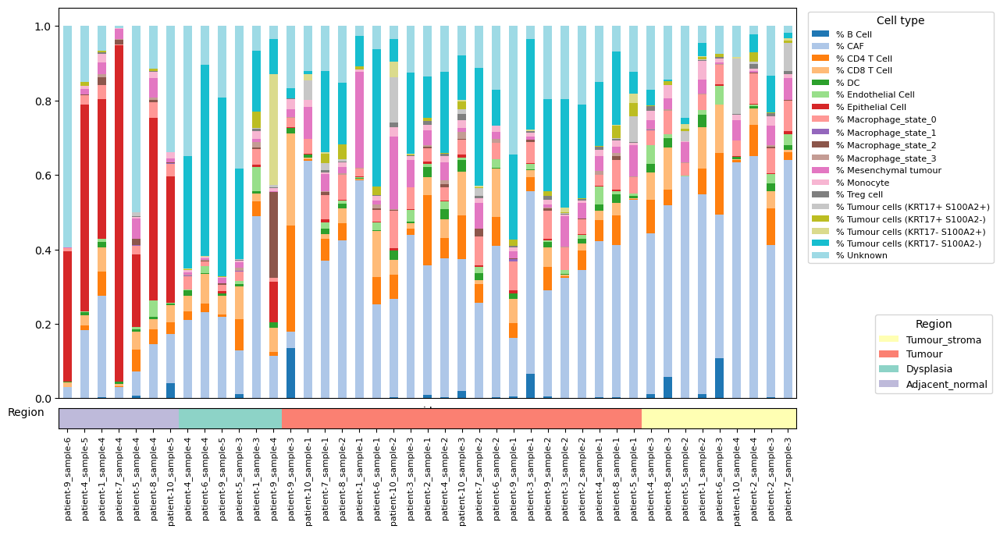

In [156]:
#abundance plot
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns
import numpy as np
from matplotlib.patches import Patch

data_bar = pourcentage_only("id", net_stat)


# --------- figure avec 2 axes ---------
fig = plt.figure(figsize=(18,7))
gs = fig.add_gridspec(
    nrows=2,
    ncols=1,
    height_ratios=[20, 1],
    hspace=0.05
)

ax = fig.add_subplot(gs[0])
ax_loc = fig.add_subplot(gs[1])

# --------- stacked barplot ---------

# alignement selon region

data_bar = data_bar.sort_values("region_grouped")

(
    data_bar
    .set_index("id")
    .drop(columns=["region_grouped"])
    .plot(
        kind="bar",
        stacked=True,
        cmap="tab20",
        ax=ax
    )
)

# --------- localisation ---------
location_series = (
    net_stat
    .set_index("id")
    .loc[data_bar["id"], "region_grouped"]
)

unique_locations = location_series.dropna().unique()

'''
palette = sns.color_palette(
    "Set3",
    n_colors=len(unique_locations)
)

location_to_color = dict(
    zip(unique_locations, palette)
)
'''

if location_to_color == None:
    palette = sns.color_palette("Set3", n_colors=len(unique_locations))
    location_to_color = dict(zip(unique_locations, palette))

    
location_to_int = {
    loc: i
    for i, loc in enumerate(unique_locations)
}

location_ints = np.array([
    location_to_int.get(loc, -1)
    for loc in location_series
])

location_cmap = ListedColormap(
    [location_to_color[loc] for loc in unique_locations]
)

ax_loc.imshow(
    location_ints[np.newaxis, :],
    aspect="auto",
    cmap=location_cmap,
    interpolation="nearest"
)

ax_loc.set_yticks([])
ax_loc.set_ylabel(
    "Region",
    rotation=0,
    labelpad=30
)



# enlever labels du barplot
ax.set_xticklabels([])
ax.tick_params(axis="x", length=0)

# labels uniquement sur ax_loc
ax_loc.set_xticks(np.arange(len(location_ints)))
ax_loc.set_xticklabels(
    data_bar["id"],
    rotation=90,
    fontsize=8
)



# synchronisation (très important)
ax_loc.set_xlim(ax.get_xlim())

# -----------------------------
# LÉGENDE CELL TYPES (coin supérieur droit)
# -----------------------------
cell_legend = ax.legend(
    title="Cell type",
    loc="upper left",
    bbox_to_anchor=(1.01, 1.0),
    frameon=True,
    fontsize=8
)

ax.add_artist(cell_legend)

# -----------------------------
# LÉGENDE REGIONS (coin inférieur droit)
# -----------------------------
region_handles = [
    Patch(facecolor=color, label=region)
    for region, color in location_to_color.items()
]

ax.legend(
    handles=region_handles,
    title="Region",
    loc="lower left",
    bbox_to_anchor=(1.1, 0.0),
    frameon=True,
    fontsize=9
)



# laisser de la place à droite
plt.subplots_adjust(right=0.65)

plt.savefig(save_dir / "abondance.png", bbox_inches="tight")
plt.show()

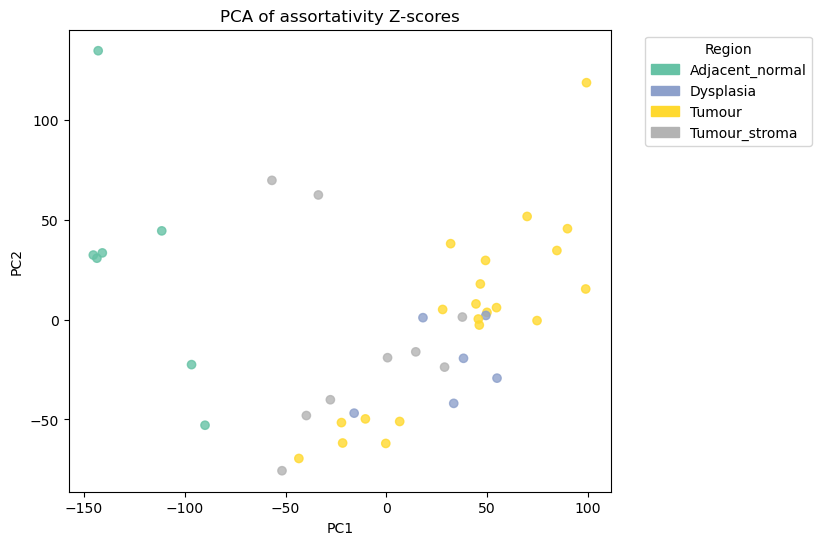

In [124]:
#PCA des z scores en fonction loca des samples

net_stat_indexed = net_stat.set_index("id").copy()

assort_cols = net_stat_indexed.columns[
    net_stat_indexed.columns.str.endswith(" Z")
]
assort_cols = [col for col in assort_cols if col != "assort Z"]
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


X = net_stat_indexed[assort_cols].fillna(0)
X = X.replace([np.inf, -np.inf], np.nan)
X = X.fillna(0)

scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=10)
coords = pca.fit_transform(X)
import matplotlib.patches as mpatches

labels = net_stat_indexed["region_grouped"].astype("category")
cats = labels.cat.categories

plt.figure(figsize=(7,6))

scatter = plt.scatter(
    coords[:,0],
    coords[:,1],
    c=labels.cat.codes,
    cmap="Set2",
    alpha=0.8
)

# --------------------------
# LÉGENDE PROPRE
# --------------------------
handles = [
    mpatches.Patch(color=scatter.cmap(scatter.norm(i)), label=cat)
    for i, cat in enumerate(cats)
]

plt.legend(
    handles=handles,
    title="Region",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA of assortativity Z-scores")
plt.savefig(save_dir / "assort_group_pca.png", bbox_inches="tight")

plt.show()

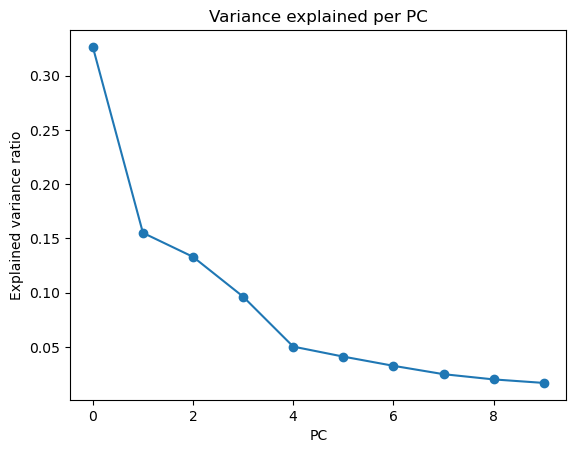

In [125]:
explained_variance = pca.explained_variance_ratio_
plt.plot(explained_variance, marker="o")
plt.xlabel("PC")
plt.ylabel("Explained variance ratio")
plt.title("Variance explained per PC")
plt.show()

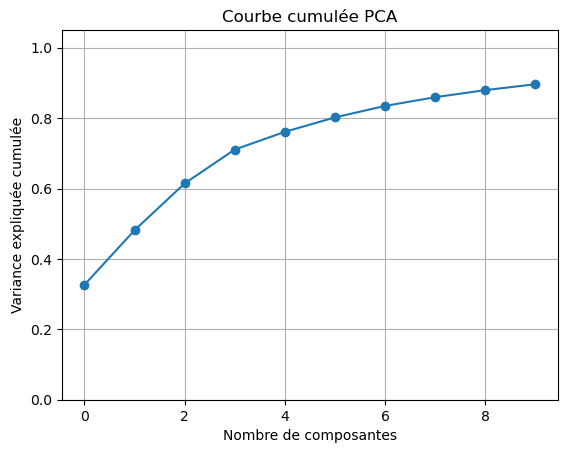

In [126]:
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

plt.plot(cumulative_variance, marker='o')
plt.xlabel("Nombre de composantes")
plt.ylabel("Variance expliquée cumulée")
plt.title("Courbe cumulée PCA")
plt.ylim(0, 1.05)
plt.grid()
plt.show()

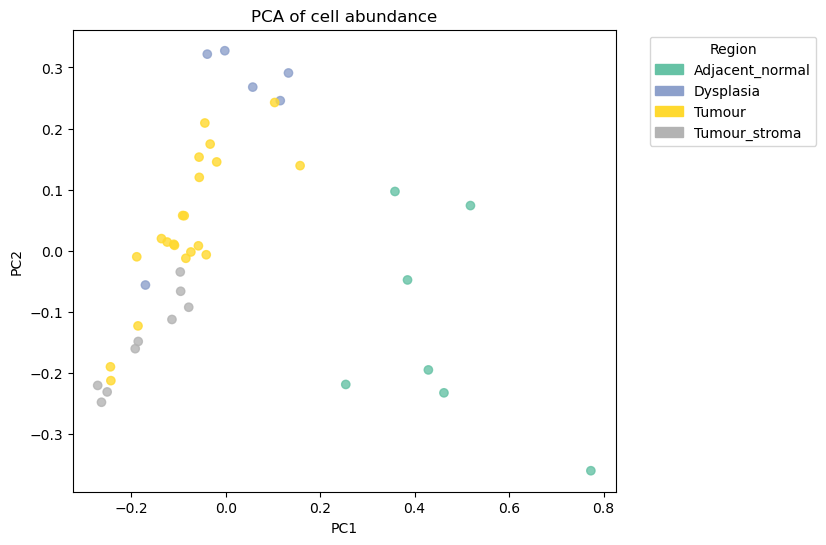

In [127]:
#PCA des % cell en fonction loca des samples

net_stat_indexed = net_stat.set_index("id").copy()

assort_cols = net_stat_indexed.columns[
    net_stat_indexed.columns.str.startswith("%")
]


from sklearn.decomposition import PCA


X = net_stat_indexed[assort_cols].fillna(0)
X = X.replace([np.inf, -np.inf], np.nan)
X = X.fillna(0)

pca = PCA(n_components=2)
coords = pca.fit_transform(X)
import matplotlib.patches as mpatches

labels = net_stat_indexed["region_grouped"].astype("category")
cats = labels.cat.categories

plt.figure(figsize=(7,6))

scatter = plt.scatter(
    coords[:,0],
    coords[:,1],
    c=labels.cat.codes,
    cmap="Set2",
    alpha=0.8
)

# --------------------------
# LÉGENDE PROPRE
# --------------------------
handles = [
    mpatches.Patch(color=scatter.cmap(scatter.norm(i)), label=cat)
    for i, cat in enumerate(cats)
]

plt.legend(
    handles=handles,
    title="Region",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA of cell abundance")
plt.savefig(save_dir / "assort_group_abundance_pca.png", bbox_inches="tight")

plt.show()

In [128]:

phenotypes = [
    "Tumour cells (KRT17-)",
    "Tumour cells (KRT17+)",


]

## heatmap assort pour cell type d'intéret

In [136]:
# =====================================================
# Cell types d'intérêt
# =====================================================

celltypes_interest = [
    "Tumour cells (KRT17- S100A2-)",   # Double negative
    "Tumour cells (KRT17+ S100A2-)",
    "Tumour cells (KRT17- S100A2+)",
    "Tumour cells (KRT17+ S100A2+)",   # Double positive
    "Macrophage_state_0",
    "Macrophage_state_1",
    "Macrophage_state_2",
    "Macrophage_state_3",
    "CAF",
    "CD8 T Cell"
]

without_adjacent_normal = True

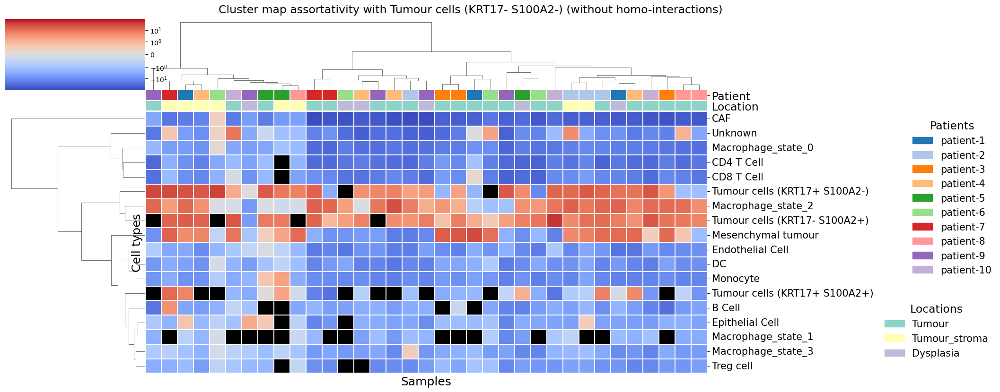

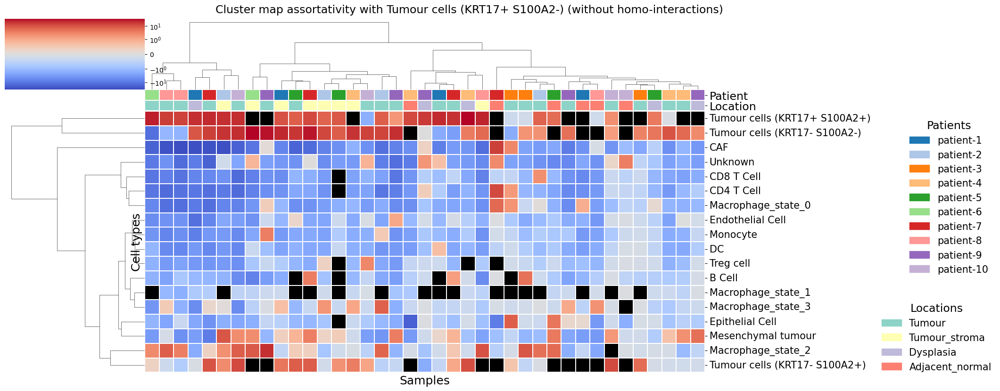

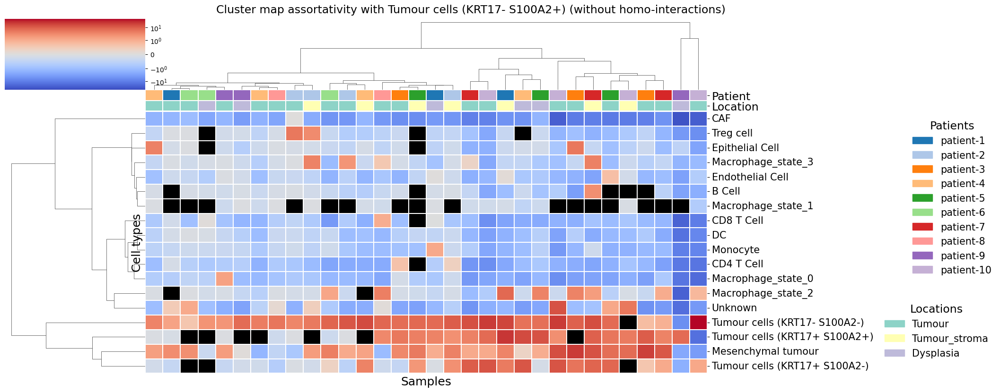

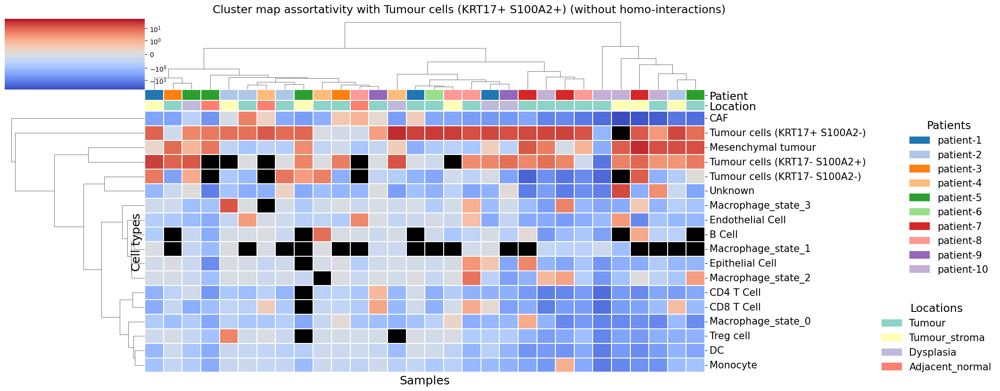

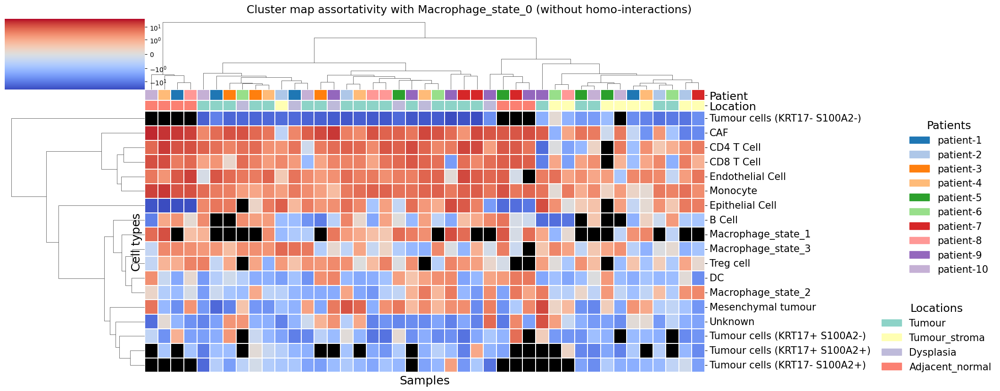

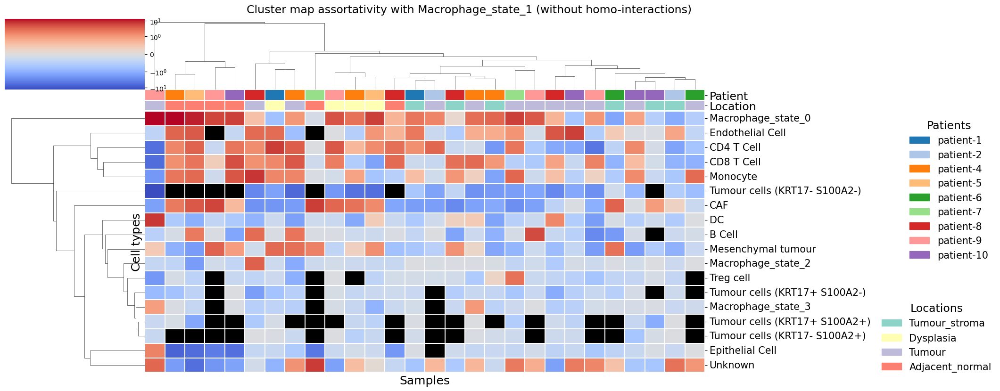

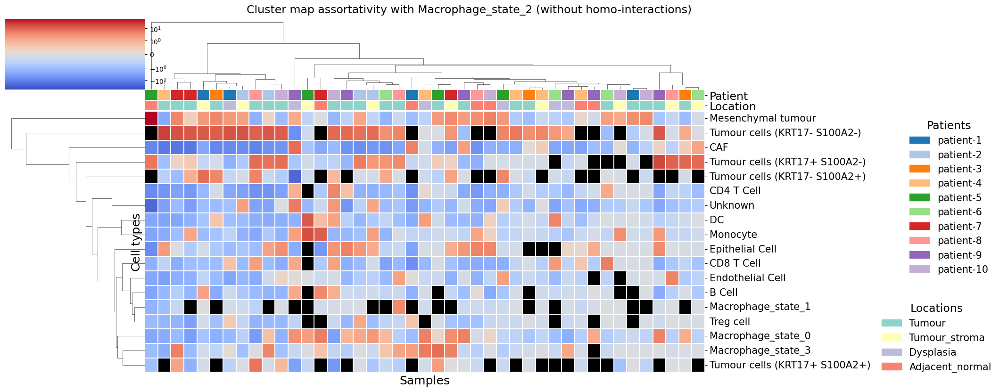

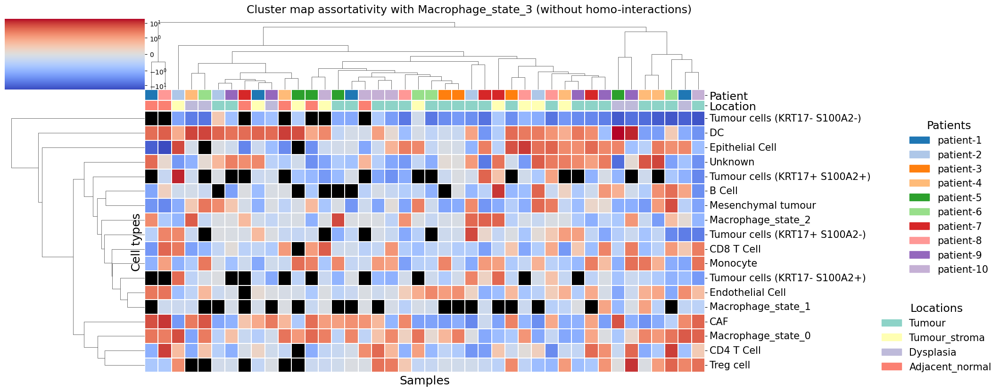

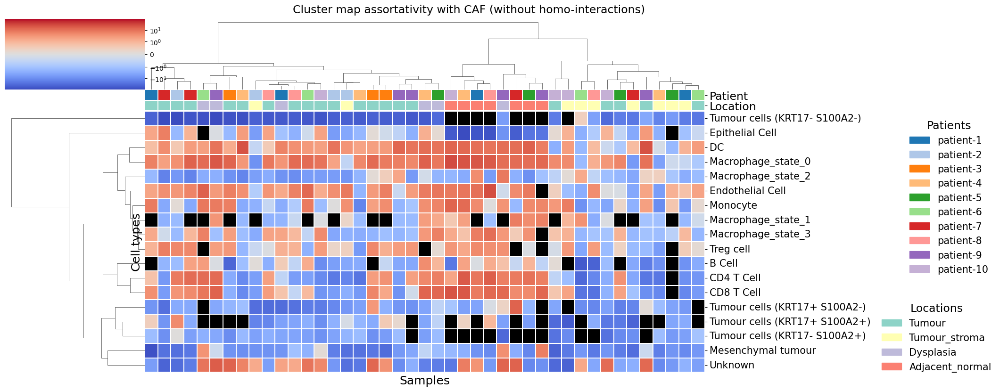

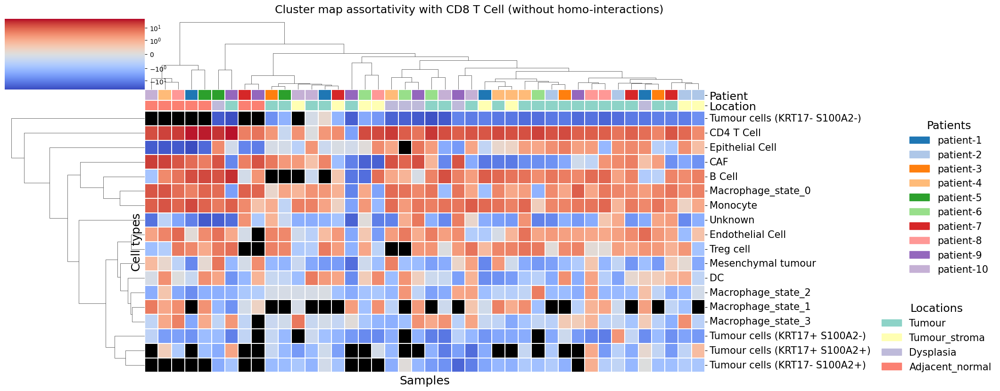

In [107]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib.patches as mpatches

from matplotlib.colors import SymLogNorm, ListedColormap
from matplotlib.gridspec import GridSpec


# =====================================================
# Préparer les données
# =====================================================

net_stat_indexed = net_stat.set_index("id").copy()

if without_adjacent_normal:
    
    net_stat_indexed = net_stat_indexed[
        net_stat_indexed["region_grouped"] != "Adjacent_normal"
    ]
    

assort_cols = [
    col for col in net_stat_indexed.columns
    if col.endswith(" Z") and col != "assort Z"
]



# =====================================================
# Trier les samples
# =====================================================

def sort_samples(columns):

    def extract_order(x):

        parts = x.split("_")

        patient = int(
            parts[0].replace("patient-", "")
        )

        sample = int(
            parts[1].replace("sample-", "")
        )

        return patient, sample


    return sorted(
        columns,
        key=extract_order
    )



# =====================================================
# Extraction assortativité
# =====================================================

def get_assort_for_celltype_interest(celltype_interest):

    result = pd.DataFrame()


    for sample in net_stat_indexed.index:


        assort_values = (
            net_stat_indexed
            .loc[sample, assort_cols]
            .astype(float)
        )


        values = {}


        for pair, score in assort_values.items():


            pair_clean = pair.replace(" Z", "")


            if celltype_interest not in pair_clean:
                continue



            other = (
                pair_clean
                .replace(celltype_interest, "")
                .replace(" - ", "")
                .strip()
            )


            if other == "":
                continue


            values[other] = score



        result = pd.concat(
            [
                result,
                pd.Series(
                    values,
                    name=sample
                )
            ],
            axis=1
        )


    result.index.name = "Cell type"
    result.columns.name = "Patient"


    return result



# =====================================================
# Couleurs patients
# =====================================================

def patient_annotation(samples):


    patient_series = pd.Series(
        samples.str.split("_").str[0],
        index=samples
    )


    unique_patients = sorted(
        patient_series.unique(),
        key=lambda x: int(x.split("-")[-1])
    )


    palette = sns.color_palette(
        "tab20",
        len(unique_patients)
    )


    patient_to_color = dict(
        zip(unique_patients, palette)
    )


    patient_int = np.array(
        [
            unique_patients.index(p)
            for p in patient_series
        ]
    )


    cmap = ListedColormap(
        [
            patient_to_color[p]
            for p in unique_patients
        ]
    )


    return (
        patient_int,
        cmap,
        patient_to_color,
        unique_patients
    )



# =====================================================
# Couleurs localisation
# =====================================================

def location_annotation(samples):


    location_series = (
        net_stat_indexed
        .loc[samples, "region_grouped"]
    )


    unique_locations = (
        location_series
        .dropna()
        .unique()
    )


    palette = sns.color_palette(
        "Set3",
        len(unique_locations)
    )


    location_to_color = dict(
        zip(unique_locations, palette)
    )


    location_int = np.array(
        [
            list(unique_locations).index(x)
            for x in location_series
        ]
    )


    cmap = ListedColormap(
        [
            location_to_color[x]
            for x in unique_locations
        ]
    )


    return (
        location_int,
        cmap,
        location_to_color,
        unique_locations
    )





    # =================================================
    # Normalisation SymLog
    # =================================================

    vals = heatmap_df.values

    valid_vals = vals[
        ~np.isnan(vals)
    ]


    zlim = np.max(
        np.abs(valid_vals)
    )


    norm = SymLogNorm(
        linthresh=1,
        linscale=1,
        vmin=-zlim,
        vmax=zlim
    )



    # =================================================
    # Annotations
    # =================================================

    patient_int, patient_cmap, patient_colors, patients = (
        patient_annotation(
            heatmap_df.columns
        )
    )


    location_int, location_cmap, location_colors, locations = (
        location_annotation(
            heatmap_df.columns
        )
    )



    # =================================================
    # Figure
    # =================================================

from matplotlib.colors import TwoSlopeNorm


# =====================================================
# ClusterMap
# =====================================================


for ct_interest in celltypes_interest:


    heatmap_df = get_assort_for_celltype_interest(
        ct_interest
    )


    heatmap_df = heatmap_df.replace(
        [np.inf, -np.inf],
        np.nan
    )


    heatmap_df = heatmap_df.dropna(
        axis=0,
        how="all"
    )


    heatmap_df = heatmap_df.dropna(
        axis=1,
        how="all"
    )


    # ordre initial patient/sample
    heatmap_df = heatmap_df[
        sort_samples(
            heatmap_df.columns
        )
    ]


    # =================================================
    # Normalisation couleur
    # =================================================

    vals = heatmap_df.values

    valid_vals = vals[
        ~np.isnan(vals)
    ]


    # =================================================
    # Normalisation SymLog
    # =================================================

    zlim = np.nanmax(
        np.abs(valid_vals)
    )

    import numpy as np

    

    linthresh = np.percentile(np.abs(valid_vals), 30)
    norm = SymLogNorm(
        linthresh=1,
        linscale=1,
        vmin=-zlim,
        vmax=zlim
    )

    cmap = plt.cm.coolwarm.copy()
    cmap.set_bad("black")



    # =================================================
    # Annotation patient
    # =================================================

    patient_series = pd.Series(
        heatmap_df.columns.str.split("_").str[0],
        index=heatmap_df.columns
    )


    patient_palette = sns.color_palette(
        "tab20",
        patient_series.nunique()
    )


    patient_colors_dict = dict(
        zip(
            patient_series.unique(),
            patient_palette
        )
    )


    patient_colors = pd.DataFrame(
        {
            "Patient":
            patient_series.map(
                patient_colors_dict
            )
        }
    )



    # =================================================
    # Annotation location
    # =================================================

    location_series = (
        net_stat_indexed
        .loc[
            heatmap_df.columns,
            "region_grouped"
        ]
    )


    location_palette = sns.color_palette(
        "Set3",
        location_series.nunique()
    )


    location_colors_dict = dict(
        zip(
            location_series.unique(),
            location_palette
        )
    )


    location_colors = pd.DataFrame(
        {
            "Location":
            location_series.map(
                location_colors_dict
            )
        }
    )



    col_colors = pd.concat(
        [
            patient_colors,
            location_colors
        ],
        axis=1
    )



    # =================================================
    # ClusterMap
    # =================================================

     # =================================================
    # Matrice pour clustering uniquement
    # =================================================

    heatmap_cluster = heatmap_df.fillna(0)


    # =================================================
    # ClusterMap
    # =================================================

    g = sns.clustermap(

        heatmap_cluster,

        cmap=cmap,

        norm=norm,

        row_cluster=True,
        col_cluster=True,

        method="ward",
        metric="euclidean",

        linewidths=0.3,
        linecolor="white",

        figsize=(
            20,
            max(8, len(heatmap_cluster)*0.4)
        ),

        col_colors=col_colors,

        xticklabels=False,
        yticklabels=True,

        cbar_kws={
            "label":"Assortativité Z"
        }
    )


    # =================================================
    # Remettre les NaN en noir après clustering
    # =================================================

    row_order = g.dendrogram_row.reordered_ind
    col_order = g.dendrogram_col.reordered_ind


    heatmap_display = heatmap_df.iloc[
        row_order,
        col_order
    ]


    # remplacer l'image affichée par une version avec NaN
    g.ax_heatmap.clear()


    sns.heatmap(
        heatmap_display,

        cmap=cmap,

        norm=norm,

        ax=g.ax_heatmap,

        cbar_ax=g.cax,

        linewidths=0.3,

        linecolor="white",

        xticklabels=False,

        yticklabels=True
    )
    # Taille des labels des bandes col_colors (Patient / Location)
    g.ax_col_colors.tick_params(
        axis="y",
        labelsize=17
    )
    # Taille des labels des ticks Y
    g.ax_heatmap.tick_params(
        axis="y",
        labelsize=15
    )

    # Taille des titres des axes
    g.ax_heatmap.set_xlabel(
        "Samples",
        fontsize=18
    )

    g.ax_heatmap.set_ylabel(
        "Cell types",
        fontsize=18
    )
    # =================================================
    # Titre
    # =================================================

    g.fig.suptitle(
        f"Cluster map assortativity with {ct_interest} (without homo-interactions)",
        y=1.02,
        fontsize=17
    )


    # =================================================
    # Labels des bandes couleurs
    # =================================================

    
    # =================================================
    # Légendes Patient + Location
    # =================================================

    patient_handles = [
        mpatches.Patch(
            color=patient_colors_dict[p],
            label=p
        )
        for p in patient_colors_dict.keys()
    ]


    location_handles = [
        mpatches.Patch(
            color=location_colors_dict[l],
            label=l
        )
        for l in location_colors_dict.keys()
    ]


    # espace à droite pour les légendes
    g.fig.subplots_adjust(
        right=0.75
    )


   
    # légende patients
    leg1 = g.ax_heatmap.legend(
        handles=patient_handles,
        title="Patients",
        bbox_to_anchor=(1.35,1),
        loc="upper left",
        frameon=False,
        fontsize=15,
        title_fontsize=17
    )


    # légende locations
    leg2 = g.ax_heatmap.legend(
        handles=location_handles,
        title="Locations",
        bbox_to_anchor=(1.30,0.30),
        loc="upper left",
        frameon=False,
        fontsize=15,
        title_fontsize=17
    )


    g.ax_heatmap.add_artist(leg1)

    # =====================================================
# Export figure
# =====================================================
    if without_adjacent_normal :
        output_name = (
            f"ClusterMap_assortativity_{ct_interest.replace(' ','_')}_without_homo_interactions_nor_adjacent_normal.png"
        )
    if without_adjacent_normal == False :
        output_name = (
            f"ClusterMap_assortativity_{ct_interest.replace(' ','_')}_without_homo_interactions.png"
        )
    
    g.savefig(
        save_dir/output_name,
        dpi=300,
        bbox_inches="tight"
    )



    plt.show()

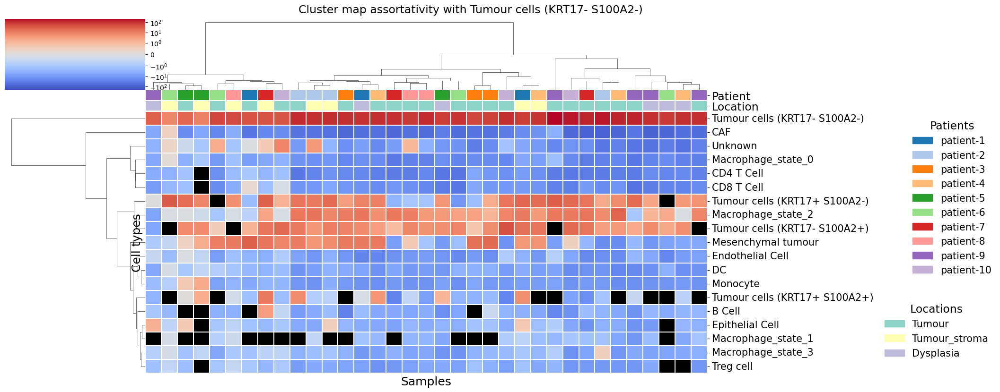

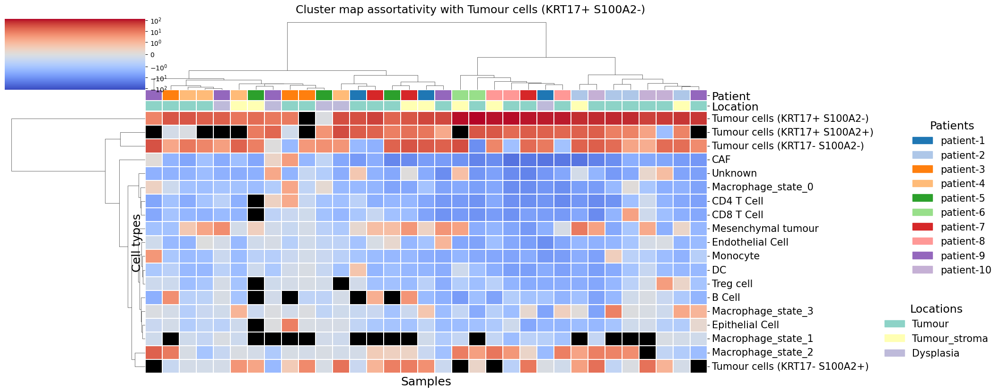

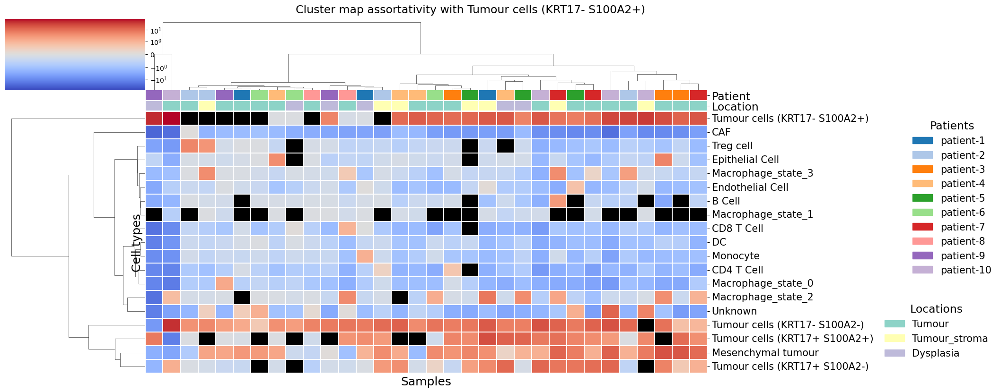

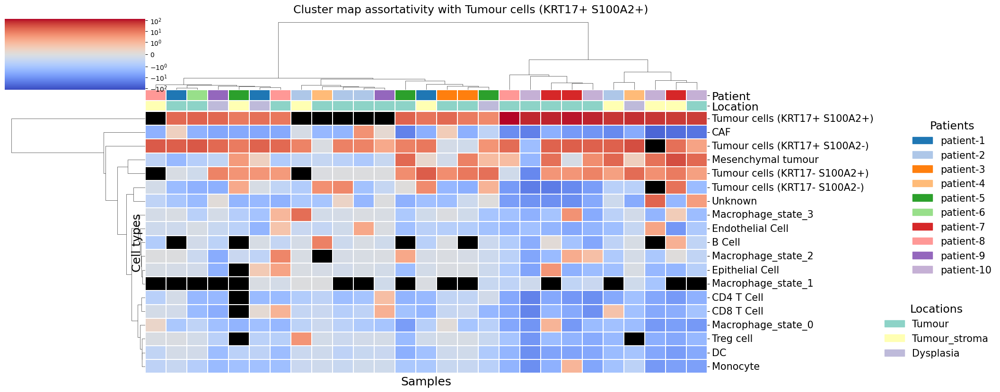

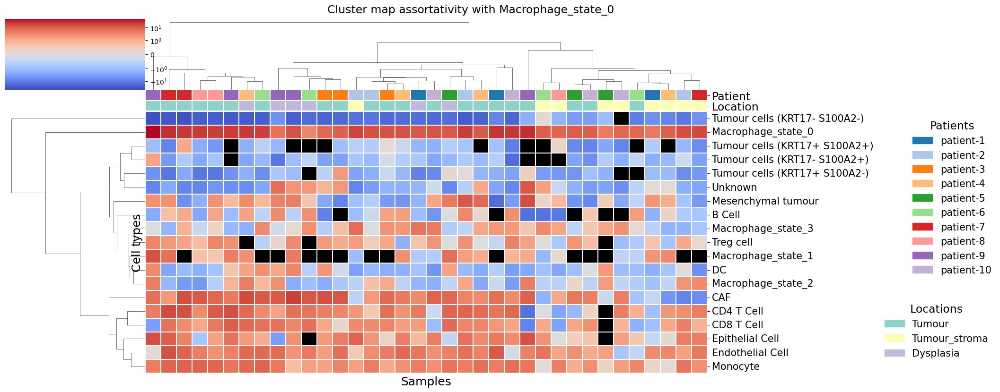

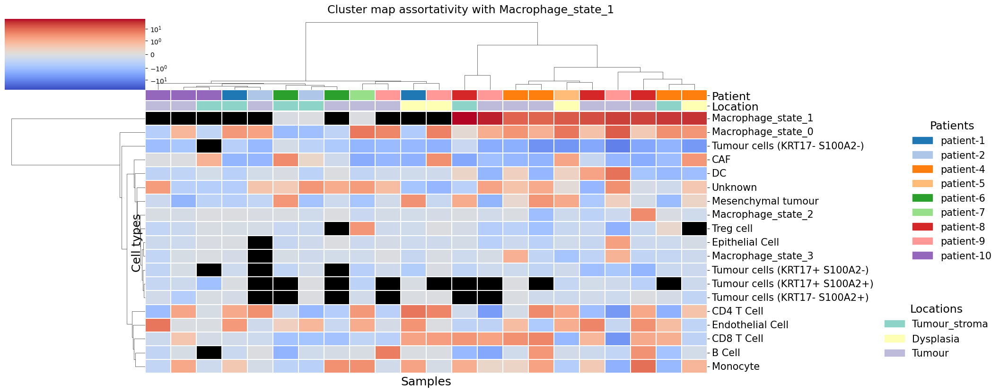

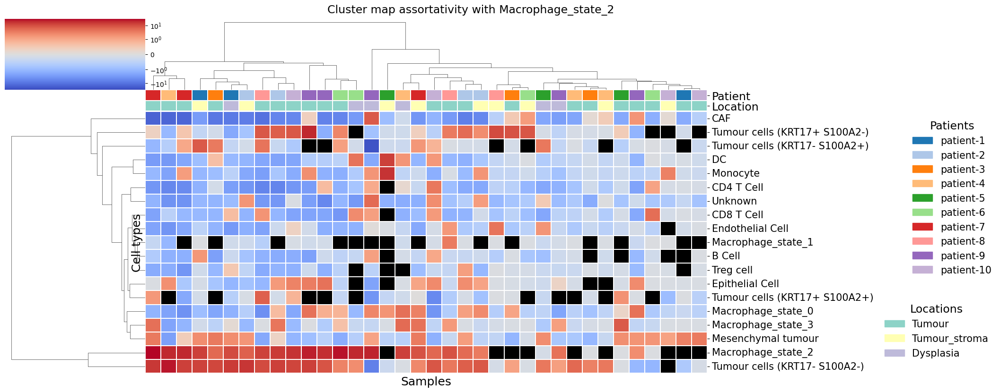

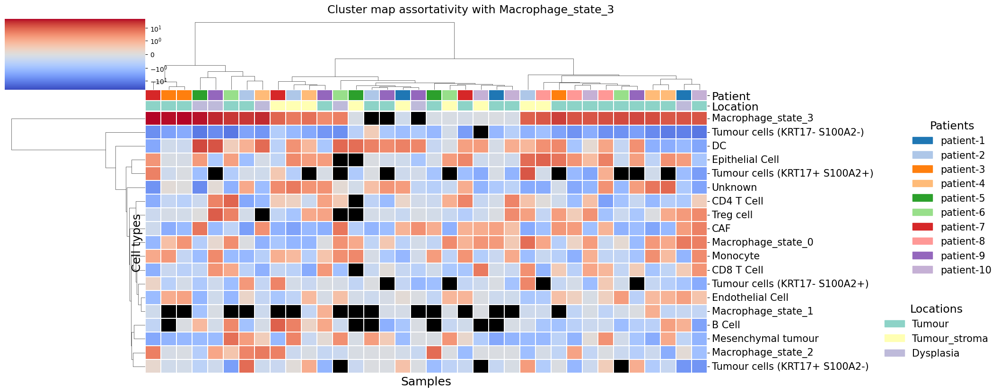

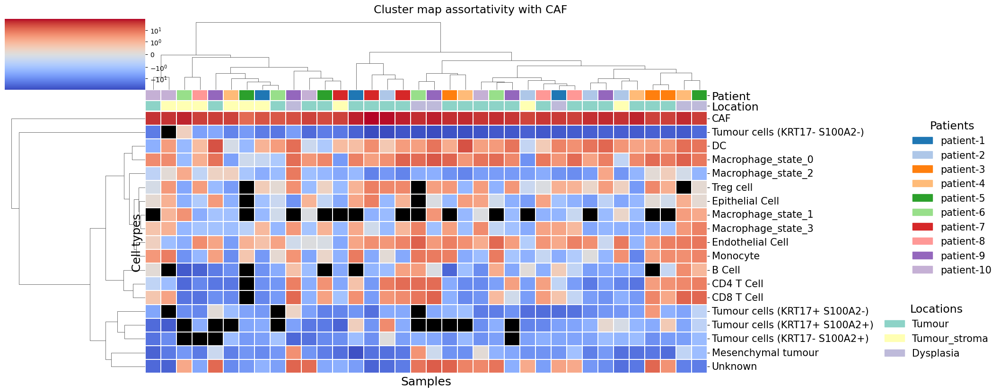

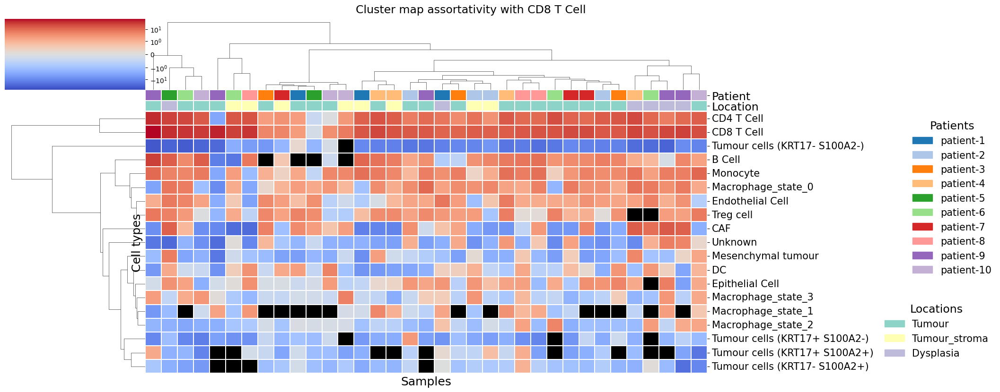

In [137]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib.patches as mpatches

from matplotlib.colors import SymLogNorm, ListedColormap
from matplotlib.gridspec import GridSpec




# =====================================================
# Préparer les données
# =====================================================

net_stat_indexed = net_stat.set_index("id").copy()

if without_adjacent_normal:
    
    net_stat_indexed = net_stat_indexed[
        net_stat_indexed["region_grouped"] != "Adjacent_normal"
    ]
    
assort_cols = [
    col for col in net_stat_indexed.columns
    if col.endswith(" Z") and col != "assort Z"
]



# =====================================================
# Trier les samples
# =====================================================

def sort_samples(columns):

    def extract_order(x):

        parts = x.split("_")

        patient = int(
            parts[0].replace("patient-", "")
        )

        sample = int(
            parts[1].replace("sample-", "")
        )

        return patient, sample


    return sorted(
        columns,
        key=extract_order
    )



# =====================================================
# Extraction assortativité
# =====================================================

def get_assort_for_celltype_interest(celltype_interest):

    result = pd.DataFrame()


    for sample in net_stat_indexed.index:


        assort_values = (
            net_stat_indexed
            .loc[sample, assort_cols]
            .astype(float)
        )


        values = {}


        for pair, score in assort_values.items():


            pair_clean = pair.replace(" Z", "")


            if celltype_interest not in pair_clean:
                continue



            parts = pair_clean.split(" - ")

            # identifier le partenaire
            if parts[0] == celltype_interest:
                other = parts[1]
            else:
                other = parts[0]

            values[other] = score



        result = pd.concat(
            [
                result,
                pd.Series(
                    values,
                    name=sample
                )
            ],
            axis=1
        )


    result.index.name = "Cell type"
    result.columns.name = "Patient"


    return result



# =====================================================
# Couleurs patients
# =====================================================

def patient_annotation(samples):


    patient_series = pd.Series(
        samples.str.split("_").str[0],
        index=samples
    )


    unique_patients = sorted(
        patient_series.unique(),
        key=lambda x: int(x.split("-")[-1])
    )


    palette = sns.color_palette(
        "tab20",
        len(unique_patients)
    )


    patient_to_color = dict(
        zip(unique_patients, palette)
    )


    patient_int = np.array(
        [
            unique_patients.index(p)
            for p in patient_series
        ]
    )


    cmap = ListedColormap(
        [
            patient_to_color[p]
            for p in unique_patients
        ]
    )


    return (
        patient_int,
        cmap,
        patient_to_color,
        unique_patients
    )



# =====================================================
# Couleurs localisation
# =====================================================

def location_annotation(samples):


    location_series = (
        net_stat_indexed
        .loc[samples, "region_grouped"]
    )


    unique_locations = (
        location_series
        .dropna()
        .unique()
    )


    palette = sns.color_palette(
        "Set3",
        len(unique_locations)
    )


    location_to_color = dict(
        zip(unique_locations, palette)
    )


    location_int = np.array(
        [
            list(unique_locations).index(x)
            for x in location_series
        ]
    )


    cmap = ListedColormap(
        [
            location_to_color[x]
            for x in unique_locations
        ]
    )


    return (
        location_int,
        cmap,
        location_to_color,
        unique_locations
    )





    # =================================================
    # Normalisation SymLog
    # =================================================

    vals = heatmap_df.values

    valid_vals = vals[
        ~np.isnan(vals)
    ]


    zlim = np.max(
        np.abs(valid_vals)
    )


    norm = SymLogNorm(
        linthresh=1,
        linscale=1,
        vmin=-zlim,
        vmax=zlim
    )



    # =================================================
    # Annotations
    # =================================================

    patient_int, patient_cmap, patient_colors, patients = (
        patient_annotation(
            heatmap_df.columns
        )
    )


    location_int, location_cmap, location_colors, locations = (
        location_annotation(
            heatmap_df.columns
        )
    )



    # =================================================
    # Figure
    # =================================================

from matplotlib.colors import TwoSlopeNorm


# =====================================================
# ClusterMap
# =====================================================


for ct_interest in celltypes_interest:


    heatmap_df = get_assort_for_celltype_interest(
        ct_interest
    )


    heatmap_df = heatmap_df.replace(
        [np.inf, -np.inf],
        np.nan
    )


    heatmap_df = heatmap_df.dropna(
        axis=0,
        how="all"
    )


    heatmap_df = heatmap_df.dropna(
        axis=1,
        how="all"
    )


    # ordre initial patient/sample
    heatmap_df = heatmap_df[
        sort_samples(
            heatmap_df.columns
        )
    ]


    # =================================================
    # Normalisation couleur
    # =================================================

    vals = heatmap_df.values

    valid_vals = vals[
        ~np.isnan(vals)
    ]


    # =================================================
    # Normalisation SymLog
    # =================================================

    zlim = np.nanmax(
        np.abs(valid_vals)
    )


    norm = SymLogNorm(
        linthresh=1,
        linscale=1,
        vmin=-zlim,
        vmax=zlim
    )

    cmap = plt.cm.coolwarm.copy()
    cmap.set_bad("black")



    # =================================================
    # Annotation patient
    # =================================================

    patient_series = pd.Series(
        heatmap_df.columns.str.split("_").str[0],
        index=heatmap_df.columns
    )


    patient_palette = sns.color_palette(
        "tab20",
        patient_series.nunique()
    )


    patient_colors_dict = dict(
        zip(
            patient_series.unique(),
            patient_palette
        )
    )


    patient_colors = pd.DataFrame(
        {
            "Patient":
            patient_series.map(
                patient_colors_dict
            )
        }
    )



    # =================================================
    # Annotation location
    # =================================================

    location_series = (
        net_stat_indexed
        .loc[
            heatmap_df.columns,
            "region_grouped"
        ]
    )


    location_palette = sns.color_palette(
        "Set3",
        location_series.nunique()
    )


    location_colors_dict = dict(
        zip(
            location_series.unique(),
            location_palette
        )
    )


    location_colors = pd.DataFrame(
        {
            "Location":
            location_series.map(
                location_colors_dict
            )
        }
    )



    col_colors = pd.concat(
        [
            patient_colors,
            location_colors
        ],
        axis=1
    )



    # =================================================
    # ClusterMap
    # =================================================

     # =================================================
    # Matrice pour clustering uniquement
    # =================================================

    heatmap_cluster = heatmap_df.fillna(0)


    # =================================================
    # ClusterMap
    # =================================================

    g = sns.clustermap(

        heatmap_cluster,

        cmap=cmap,

        norm=norm,

        row_cluster=True,
        col_cluster=True,

        method="ward",
        metric="euclidean",

        linewidths=0.3,
        linecolor="white",

        figsize=(
            20,
            max(8, len(heatmap_cluster)*0.4)
        ),

        col_colors=col_colors,

        xticklabels=False,
        yticklabels=True,

        cbar_kws={
            "label":"Assortativité Z"
        }
    )


    # =================================================
    # Remettre les NaN en noir après clustering
    # =================================================

    row_order = g.dendrogram_row.reordered_ind
    col_order = g.dendrogram_col.reordered_ind


    heatmap_display = heatmap_df.iloc[
        row_order,
        col_order
    ]


    # remplacer l'image affichée par une version avec NaN
    g.ax_heatmap.clear()


    sns.heatmap(
        heatmap_display,

        cmap=cmap,

        norm=norm,

        ax=g.ax_heatmap,

        cbar_ax=g.cax,

        linewidths=0.3,

        linecolor="white",

        xticklabels=False,

        yticklabels=True
    )
    # Taille des labels des bandes col_colors (Patient / Location)
    g.ax_col_colors.tick_params(
        axis="y",
        labelsize=17
    )
    # Taille des labels des ticks Y
    g.ax_heatmap.tick_params(
        axis="y",
        labelsize=15
    )

    # Taille des titres des axes
    g.ax_heatmap.set_xlabel(
        "Samples",
        fontsize=18
    )

    g.ax_heatmap.set_ylabel(
        "Cell types",
        fontsize=18
    )
    # =================================================
    # Titre
    # =================================================

    g.fig.suptitle(
        f"Cluster map assortativity with {ct_interest}",
        y=1.02,
        fontsize=17
    )


    # =================================================
    # Labels des bandes couleurs
    # =================================================

    
    # =================================================
    # Légendes Patient + Location
    # =================================================

    patient_handles = [
        mpatches.Patch(
            color=patient_colors_dict[p],
            label=p
        )
        for p in patient_colors_dict.keys()
    ]


    location_handles = [
        mpatches.Patch(
            color=location_colors_dict[l],
            label=l
        )
        for l in location_colors_dict.keys()
    ]


    # espace à droite pour les légendes
    g.fig.subplots_adjust(
        right=0.75
    )


   
    # légende patients
    leg1 = g.ax_heatmap.legend(
        handles=patient_handles,
        title="Patients",
        bbox_to_anchor=(1.35,1),
        loc="upper left",
        frameon=False,
        fontsize=15,
        title_fontsize=17
    )


    # légende locations
    leg2 = g.ax_heatmap.legend(
        handles=location_handles,
        title="Locations",
        bbox_to_anchor=(1.30,0.30),
        loc="upper left",
        frameon=False,
        fontsize=15,
        title_fontsize=17
    )


    g.ax_heatmap.add_artist(leg1)

    # =====================================================
# Export figure
# =====================================================

    if without_adjacent_normal :
        output_name = (
            f"ClusterMap_assortativity_{ct_interest.replace(' ','_')}_avec_homo_without_adjacent_normal.png"
        )
    if without_adjacent_normal == False :
        output_name = (
            f"ClusterMap_assortativity_{ct_interest.replace(' ','_')}_avec_homo.png"
        )
        
    
    g.savefig(
        save_dir/output_name,
        dpi=300,
        bbox_inches="tight"
    )



    plt.show()

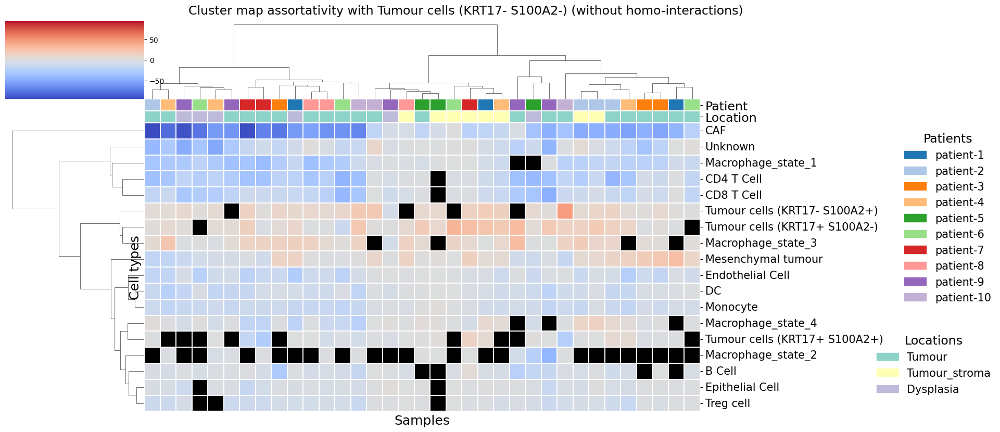

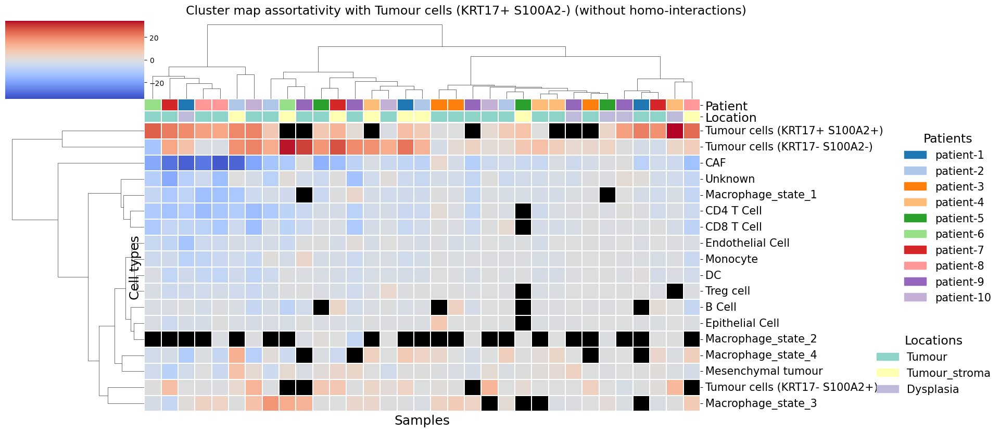

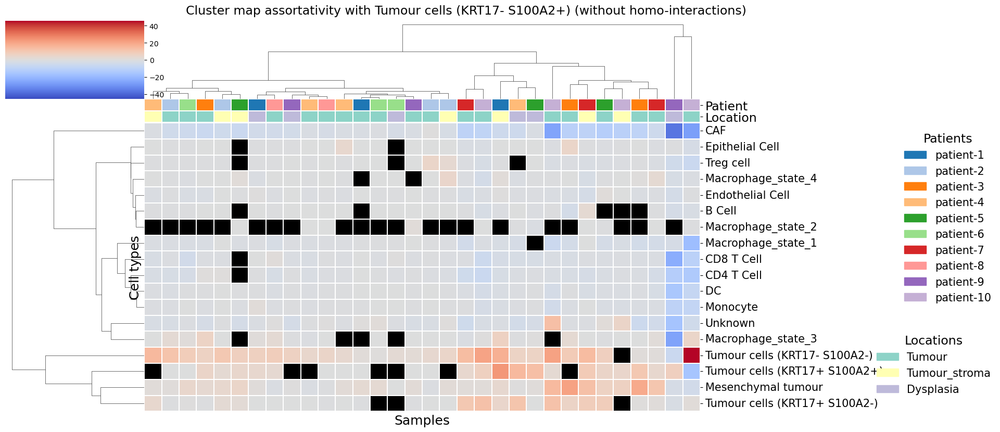

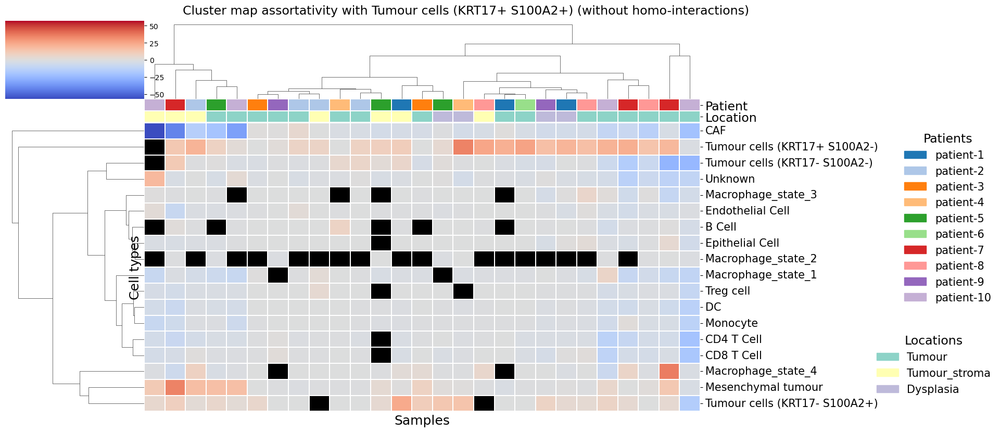

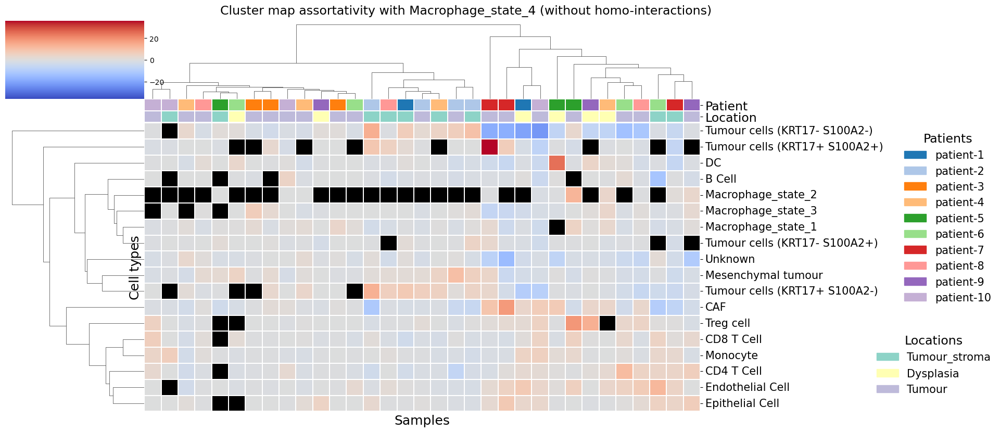

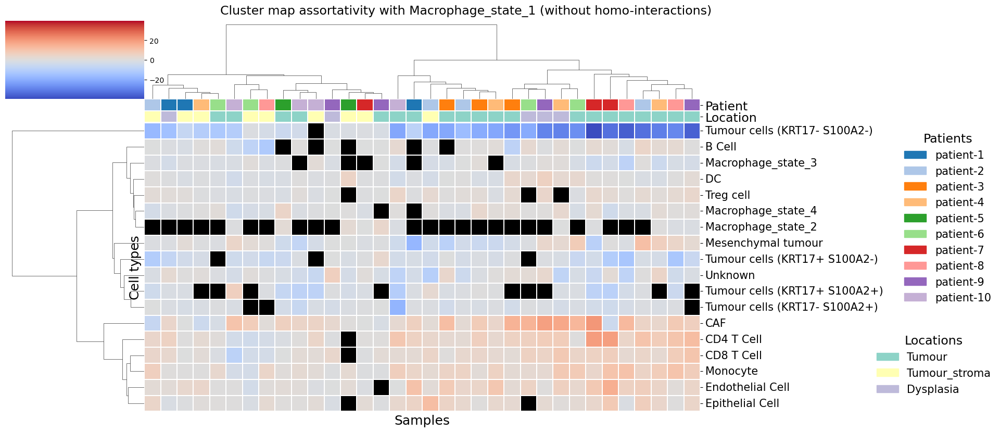

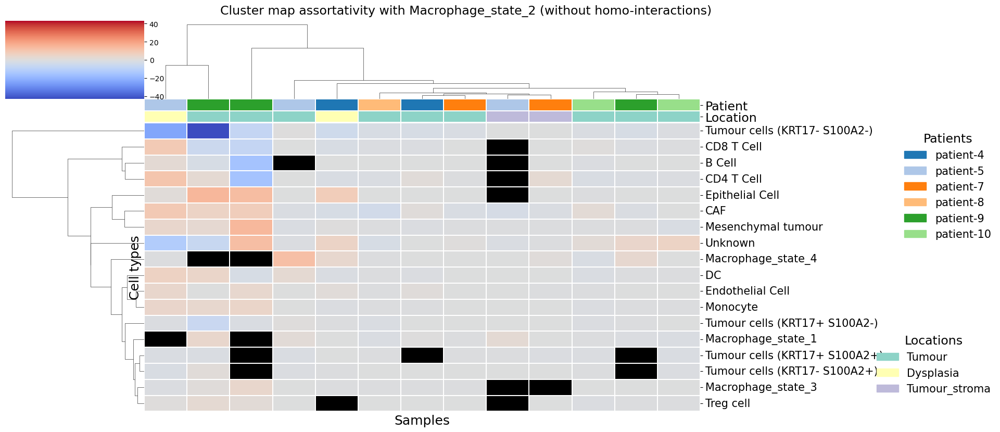

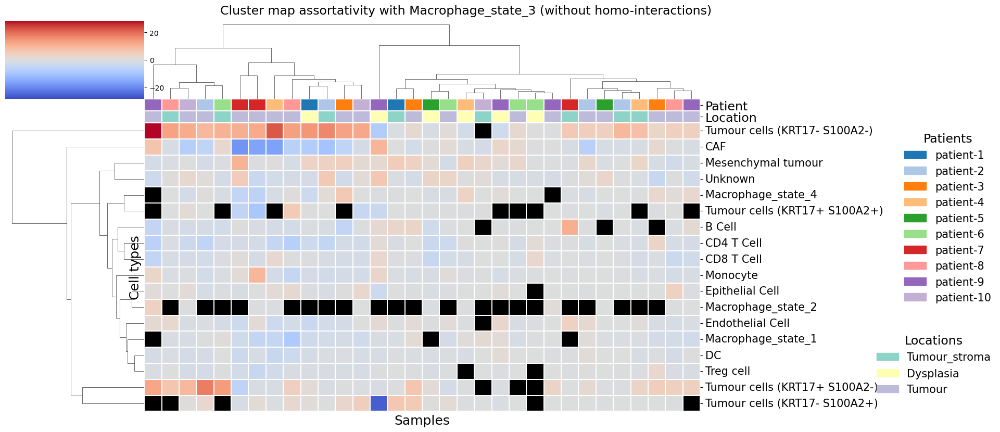

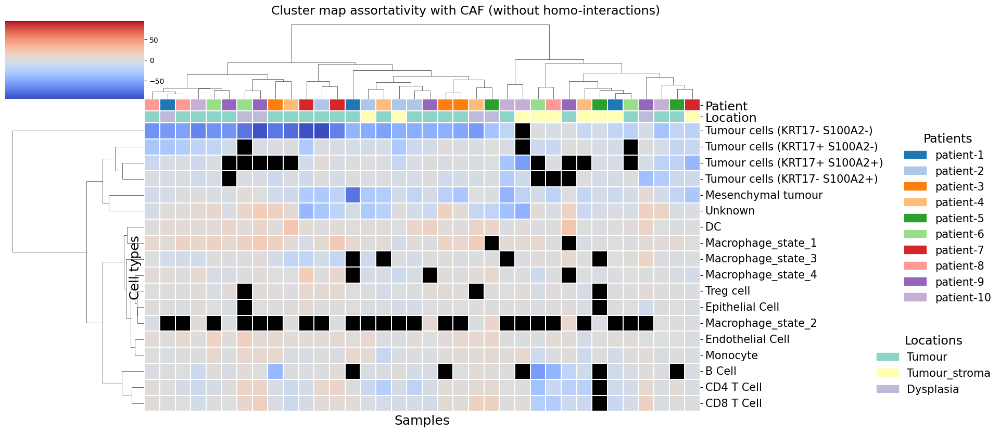

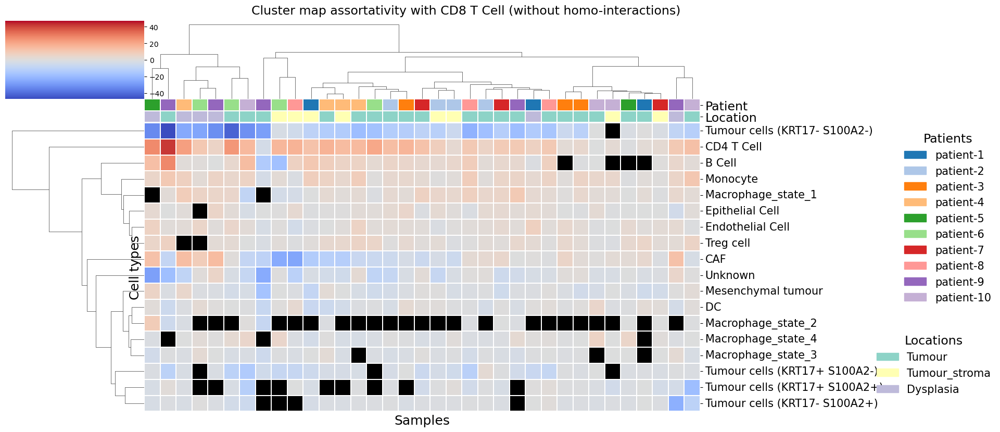

In [96]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib.patches as mpatches

from matplotlib.colors import SymLogNorm, ListedColormap
from matplotlib.gridspec import GridSpec
from matplotlib.colors import Normalize, ListedColormap

# =====================================================
# Préparer les données
# =====================================================

net_stat_indexed = net_stat.set_index("id").copy()
if without_adjacent_normal:
    
    net_stat_indexed = net_stat_indexed[
        net_stat_indexed["region_grouped"] != "Adjacent_normal"
    ]
    

assort_cols = [
    col for col in net_stat_indexed.columns
    if col.endswith(" Z") and col != "assort Z"
]



# =====================================================
# Trier les samples
# =====================================================

def sort_samples(columns):

    def extract_order(x):

        parts = x.split("_")

        patient = int(
            parts[0].replace("patient-", "")
        )

        sample = int(
            parts[1].replace("sample-", "")
        )

        return patient, sample


    return sorted(
        columns,
        key=extract_order
    )



# =====================================================
# Extraction assortativité
# =====================================================

def get_assort_for_celltype_interest(celltype_interest):

    result = pd.DataFrame()


    for sample in net_stat_indexed.index:


        assort_values = (
            net_stat_indexed
            .loc[sample, assort_cols]
            .astype(float)
        )


        values = {}


        for pair, score in assort_values.items():


            pair_clean = pair.replace(" Z", "")


            if celltype_interest not in pair_clean:
                continue



            other = (
                pair_clean
                .replace(celltype_interest, "")
                .replace(" - ", "")
                .strip()
            )


            if other == "":
                continue


            values[other] = score



        result = pd.concat(
            [
                result,
                pd.Series(
                    values,
                    name=sample
                )
            ],
            axis=1
        )


    result.index.name = "Cell type"
    result.columns.name = "Patient"


    return result



# =====================================================
# Couleurs patients
# =====================================================

def patient_annotation(samples):


    patient_series = pd.Series(
        samples.str.split("_").str[0],
        index=samples
    )


    unique_patients = sorted(
        patient_series.unique(),
        key=lambda x: int(x.split("-")[-1])
    )


    palette = sns.color_palette(
        "tab20",
        len(unique_patients)
    )


    patient_to_color = dict(
        zip(unique_patients, palette)
    )


    patient_int = np.array(
        [
            unique_patients.index(p)
            for p in patient_series
        ]
    )


    cmap = ListedColormap(
        [
            patient_to_color[p]
            for p in unique_patients
        ]
    )


    return (
        patient_int,
        cmap,
        patient_to_color,
        unique_patients
    )



# =====================================================
# Couleurs localisation
# =====================================================

def location_annotation(samples):


    location_series = (
        net_stat_indexed
        .loc[samples, "region_grouped"]
    )


    unique_locations = (
        location_series
        .dropna()
        .unique()
    )


    palette = sns.color_palette(
        "Set3",
        len(unique_locations)
    )


    location_to_color = dict(
        zip(unique_locations, palette)
    )


    location_int = np.array(
        [
            list(unique_locations).index(x)
            for x in location_series
        ]
    )


    cmap = ListedColormap(
        [
            location_to_color[x]
            for x in unique_locations
        ]
    )


    return (
        location_int,
        cmap,
        location_to_color,
        unique_locations
    )





    # =================================================
    # Normalisation SymLog
    # =================================================

    vals = heatmap_df.values

    valid_vals = vals[
        ~np.isnan(vals)
    ]


    zlim = np.max(
        np.abs(valid_vals)
    )


    norm = SymLogNorm(
        linthresh=1,
        linscale=1,
        vmin=-zlim,
        vmax=zlim
    )



    # =================================================
    # Annotations
    # =================================================

    patient_int, patient_cmap, patient_colors, patients = (
        patient_annotation(
            heatmap_df.columns
        )
    )


    location_int, location_cmap, location_colors, locations = (
        location_annotation(
            heatmap_df.columns
        )
    )



    # =================================================
    # Figure
    # =================================================

from matplotlib.colors import TwoSlopeNorm


# =====================================================
# ClusterMap
# =====================================================


for ct_interest in celltypes_interest:


    heatmap_df = get_assort_for_celltype_interest(
        ct_interest
    )


    heatmap_df = heatmap_df.replace(
        [np.inf, -np.inf],
        np.nan
    )


    heatmap_df = heatmap_df.dropna(
        axis=0,
        how="all"
    )


    heatmap_df = heatmap_df.dropna(
        axis=1,
        how="all"
    )


    # ordre initial patient/sample
    heatmap_df = heatmap_df[
        sort_samples(
            heatmap_df.columns
        )
    ]


    # =================================================
    # Normalisation couleur
    # =================================================

    vals = heatmap_df.values

    valid_vals = vals[
        ~np.isnan(vals)
    ]


    # =================================================
    # Normalisation linéaire
    # =================================================

    zlim = np.nanmax(np.abs(valid_vals))

    norm = Normalize(
        vmin=-zlim,
        vmax=zlim
    )
    cmap = plt.cm.coolwarm.copy()
    cmap.set_bad("black")



    # =================================================
    # Annotation patient
    # =================================================

    patient_series = pd.Series(
        heatmap_df.columns.str.split("_").str[0],
        index=heatmap_df.columns
    )


    patient_palette = sns.color_palette(
        "tab20",
        patient_series.nunique()
    )


    patient_colors_dict = dict(
        zip(
            patient_series.unique(),
            patient_palette
        )
    )


    patient_colors = pd.DataFrame(
        {
            "Patient":
            patient_series.map(
                patient_colors_dict
            )
        }
    )



    # =================================================
    # Annotation location
    # =================================================

    location_series = (
        net_stat_indexed
        .loc[
            heatmap_df.columns,
            "region_grouped"
        ]
    )


    location_palette = sns.color_palette(
        "Set3",
        location_series.nunique()
    )


    location_colors_dict = dict(
        zip(
            location_series.unique(),
            location_palette
        )
    )


    location_colors = pd.DataFrame(
        {
            "Location":
            location_series.map(
                location_colors_dict
            )
        }
    )



    col_colors = pd.concat(
        [
            patient_colors,
            location_colors
        ],
        axis=1
    )



    # =================================================
    # ClusterMap
    # =================================================

     # =================================================
    # Matrice pour clustering uniquement
    # =================================================

    heatmap_cluster = heatmap_df.fillna(0)


    # =================================================
    # ClusterMap
    # =================================================

    g = sns.clustermap(

        heatmap_cluster,

        cmap=cmap,

        norm=norm,

        row_cluster=True,
        col_cluster=True,

        method="ward",
        metric="euclidean",

        linewidths=0.3,
        linecolor="white",

        figsize=(
            18,
            max(8, len(heatmap_cluster)*0.4)
        ),

        col_colors=col_colors,

        xticklabels=False,
        yticklabels=True,

        cbar_kws={
            "label":"Assortativité Z"
        }
    )


    # =================================================
    # Remettre les NaN en noir après clustering
    # =================================================

    row_order = g.dendrogram_row.reordered_ind
    col_order = g.dendrogram_col.reordered_ind


    heatmap_display = heatmap_df.iloc[
        row_order,
        col_order
    ]


    # remplacer l'image affichée par une version avec NaN
    g.ax_heatmap.clear()


    sns.heatmap(
        heatmap_display,

        cmap=cmap,

        norm=norm,

        ax=g.ax_heatmap,

        cbar_ax=g.cax,

        linewidths=0.3,

        linecolor="white",

        xticklabels=False,

        yticklabels=True
    )
    # Taille des labels des bandes col_colors (Patient / Location)
    g.ax_col_colors.tick_params(
        axis="y",
        labelsize=17
    )
    # Taille des labels des ticks Y
    g.ax_heatmap.tick_params(
        axis="y",
        labelsize=15
    )

    # Taille des titres des axes
    g.ax_heatmap.set_xlabel(
        "Samples",
        fontsize=18
    )

    g.ax_heatmap.set_ylabel(
        "Cell types",
        fontsize=18
    )
    # =================================================
    # Titre
    # =================================================

    g.fig.suptitle(
        f"Cluster map assortativity with {ct_interest} (without homo-interactions)",
        y=1.02,
        fontsize=17
    )


    # =================================================
    # Labels des bandes couleurs
    # =================================================

    
    # =================================================
    # Légendes Patient + Location
    # =================================================

    patient_handles = [
        mpatches.Patch(
            color=patient_colors_dict[p],
            label=p
        )
        for p in patient_colors_dict.keys()
    ]


    location_handles = [
        mpatches.Patch(
            color=location_colors_dict[l],
            label=l
        )
        for l in location_colors_dict.keys()
    ]


    # espace à droite pour les légendes
    g.fig.subplots_adjust(
        right=0.75
    )


   
    # légende patients
    leg1 = g.ax_heatmap.legend(
        handles=patient_handles,
        title="Patients",
        bbox_to_anchor=(1.35,1),
        loc="upper left",
        frameon=False,
        fontsize=15,
        title_fontsize=17
    )


    # légende locations
    leg2 = g.ax_heatmap.legend(
        handles=location_handles,
        title="Locations",
        bbox_to_anchor=(1.30,0.30),
        loc="upper left",
        frameon=False,
        fontsize=15,
        title_fontsize=17
    )


    g.ax_heatmap.add_artist(leg1)
    # =====================================================
# Export figure
# =====================================================

    output_name = (
        f"ClusterMap_assortativity_{ct_interest.replace(' ','_')}_without_homo_interactions_sans_symlog.png"
    )
    if without_adjacent_normal :
        output_name = (
            f"ClusterMap_assortativity_{ct_interest.replace(' ','_')}_without_homo_interactions_sans_symlog_nor_adjacent_normal.png"
        )
    if without_adjacent_normal == False :
        output_name = (
            f"ClusterMap_assortativity_{ct_interest.replace(' ','_')}_without_homo_interactions_sans_symlog.png"
        )
    
    
    g.savefig(
        save_dir/output_name,
        dpi=300,
        bbox_inches="tight"
    )



    plt.show()

## Heat map globale séléction les asssorts qui intéressent

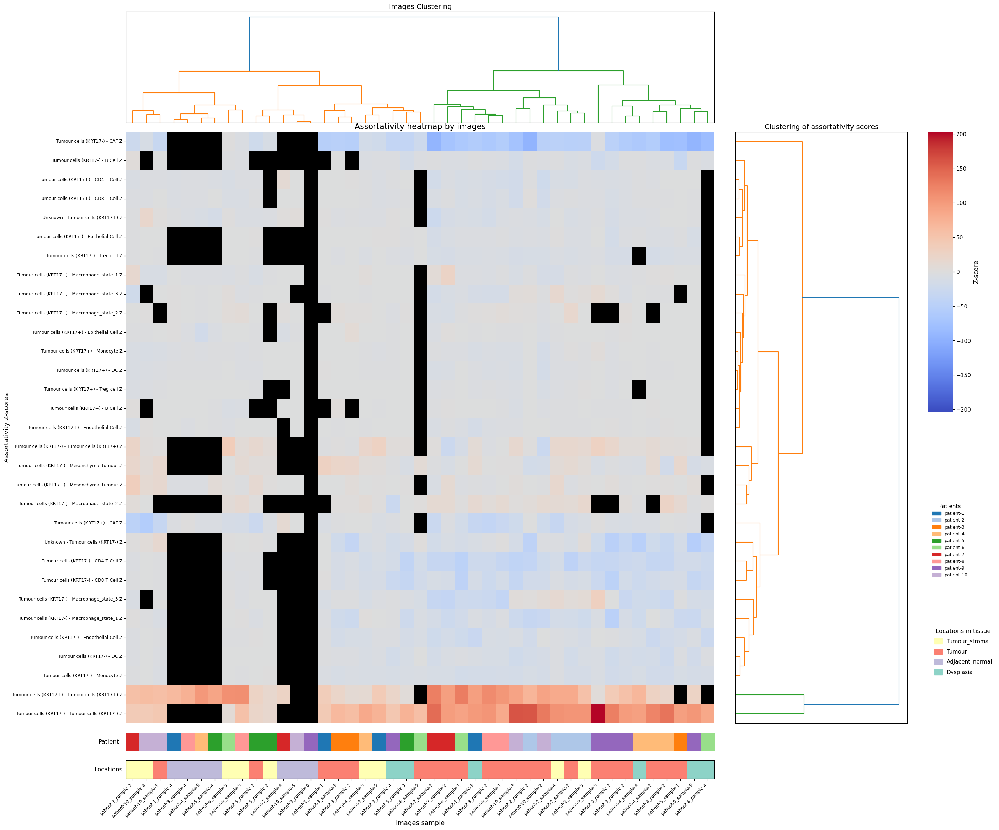

In [159]:
#dengrogramme avec label de location et heatmap avec les z scores de mosna.groups_assort_mixmat
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches

from matplotlib.colors import ListedColormap, TwoSlopeNorm
from matplotlib.gridspec import GridSpec
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist


# Enlever le " Z" à la fin

import re

# ------------------------------------------------------------------
# 1. Préparation des données
# ------------------------------------------------------------------

net_stat_indexed = net_stat.set_index("id").copy()

assort_cols = net_stat_indexed.columns[net_stat_indexed.columns.str.endswith(" Z")]
assort_cols = [col for col in assort_cols if col != "assort Z"]

heatmap_data = net_stat_indexed[assort_cols].T.astype(float)
heatmap_data = heatmap_data.replace([np.inf, -np.inf], np.nan)
heatmap_data = heatmap_data.dropna(axis=0, how="all")
heatmap_data = heatmap_data.dropna(axis=1, how="all")

selected_rows = [
    col for col in heatmap_data.index
    if (
        len((parts := re.sub(r"\s+Z$", "", col).split(" - "))) == 2
        and parts[0] in phenotypes
        or parts[1] in phenotypes
    )
]

heatmap_data = heatmap_data.loc[selected_rows]


# ------------------------------------------------------------------
# 2. Clustering des colonnes et des lignes
# ------------------------------------------------------------------

cluster_matrix_cols = heatmap_data.T.fillna(0)
col_linkage = linkage(pdist(cluster_matrix_cols, metric="euclidean"), method="ward")

cluster_matrix_rows = heatmap_data.fillna(0)
row_linkage = linkage(pdist(cluster_matrix_rows, metric="euclidean"), method="ward")

# ------------------------------------------------------------------
# 3. Ordre des feuilles
# ------------------------------------------------------------------

col_dendro_preview = dendrogram(col_linkage, no_plot=True)
col_leaf_order = col_dendro_preview["leaves"]

row_dendro_preview = dendrogram(row_linkage, no_plot=True)
row_leaf_order = row_dendro_preview["leaves"]

heatmap_data = heatmap_data.iloc[row_leaf_order, col_leaf_order]

# ------------------------------------------------------------------
# 4. Bande de couleur pour la location
# ------------------------------------------------------------------

location_series = net_stat_indexed.loc[heatmap_data.columns, "region_grouped"]


unique_locations = location_series.dropna().unique()
if location_to_color == None:
    palette = sns.color_palette("Set3", n_colors=len(unique_locations))
    location_to_color = dict(zip(unique_locations, palette))

location_to_int = {loc: i for i, loc in enumerate(unique_locations)}
location_ints = np.array([location_to_int.get(loc, -1) for loc in location_series])

annotation_colors = [
    location_to_color[loc]
    for loc in unique_locations
]
if (location_ints == -1).any():
    annotation_colors.append((0.0, 0.0, 0.0))
    missing_index = len(annotation_colors) - 1
    location_ints = np.where(location_ints == -1, missing_index, location_ints)

location_cmap = ListedColormap(annotation_colors)

# ------------------------------------------------------------------
# Annotation patient
# ------------------------------------------------------------------

patient_series = pd.Series(
    heatmap_data.columns.str.split("_").str[0],
    index=heatmap_data.columns
)

unique_patients = sorted(
    patient_series.unique(),
    key=lambda x: int(x.split("-")[-1])
)


patient_palette = sns.color_palette(
    "tab20",
    n_colors=len(unique_patients)
)

patient_to_color = dict(
    zip(unique_patients, patient_palette)
)

patient_to_int = {
    pat: i
    for i, pat in enumerate(unique_patients)
}

patient_ints = np.array(
    [patient_to_int[p] for p in patient_series]
)

patient_cmap = ListedColormap(
    [patient_to_color[p] for p in unique_patients]
)

# ------------------------------------------------------------------
# 5. Normalisation de la heatmap
# ------------------------------------------------------------------

vals = heatmap_data.to_numpy()
valid_vals = vals[~np.isnan(vals)]

if valid_vals.size == 0:
    raise ValueError("La matrice ne contient aucune valeur exploitable.")

zlim = np.nanmax(np.abs(valid_vals))
norm = TwoSlopeNorm(vmin=-zlim, vcenter=0, vmax=zlim)

cmap = plt.cm.coolwarm.copy()
cmap.set_bad(color="black")

# ------------------------------------------------------------------
# 6. Mise en page
# ------------------------------------------------------------------

fig = plt.figure(figsize=(30, 28))

gs = GridSpec(
    nrows=4,
    ncols=3,
    width_ratios=[24, 7, 1],
    height_ratios=[3, 16, 0.5, 0.5],
    wspace=0.08,
    hspace=0.05
)



ax_dendro_col = fig.add_subplot(gs[0, 0])
ax_heat = fig.add_subplot(gs[1, 0])

ax_patient = fig.add_subplot(gs[2, 0], sharex=ax_heat)
ax_loc     = fig.add_subplot(gs[3, 0], sharex=ax_heat)



ax_dendro_row = fig.add_subplot(gs[1, 1])

right_gs = gs[1, 2].subgridspec(
    nrows=2,
    ncols=1,
    height_ratios=[5, 4],
    hspace=0.35
)

cbar_ax = fig.add_subplot(right_gs[0, 0])
legend_ax = fig.add_subplot(right_gs[1, 0])

ax_top_unused_1 = fig.add_subplot(gs[0, 1])
ax_top_unused_2 = fig.add_subplot(gs[0, 2])
#ax_bottom_unused_1 = fig.add_subplot(gs[2, 1])
#ax_bottom_unused_2 = fig.add_subplot(gs[2, 2])

ax_bottom_unused_1 = fig.add_subplot(gs[3, 1])
ax_bottom_unused_2 = fig.add_subplot(gs[3, 2])

ax_top_unused_1.axis("off")
ax_top_unused_2.axis("off")
ax_bottom_unused_1.axis("off")
ax_bottom_unused_2.axis("off")

# ------------------------------------------------------------------
# 7. Dendrogramme des colonnes
# ------------------------------------------------------------------

dendrogram(
    col_linkage,
    ax=ax_dendro_col,
    no_labels=True,
    color_threshold=None
)

ax_dendro_col.set_xticks([])
ax_dendro_col.set_yticks([])
ax_dendro_col.set_xlabel("")
ax_dendro_col.set_ylabel("")
ax_dendro_col.set_title("Images Clustering", fontsize=14)

# ------------------------------------------------------------------
# 8. Heatmap principale
# ------------------------------------------------------------------

sns.heatmap(
    heatmap_data,
    cmap=cmap,
    center=0,
    vmin=-zlim,
    vmax=zlim,
    ax=ax_heat,
    cbar_ax=cbar_ax,
    cbar_kws={"label": "Z-score"},
    yticklabels=heatmap_data.index,
    xticklabels=False
)

ax_heat.set_ylabel("Assortativity Z-scores", fontsize=13)
ax_heat.set_xlabel("")
ax_heat.set_title("Assortativity heatmap by images", fontsize=16)
ax_heat.tick_params(axis="x", bottom=False, labelbottom=False)
ax_heat.tick_params(axis="y", labelsize=9)

# On garde les labels de lignes à gauche de la heatmap.
ax_heat.yaxis.tick_left()
ax_heat.yaxis.set_label_position("left")

# ------------------------------------------------------------------
# 9. Dendrogramme des lignes
# ------------------------------------------------------------------

dendrogram(
    row_linkage,
    ax=ax_dendro_row,
    orientation="right",
    no_labels=True,
    color_threshold=None
)

ax_dendro_row.set_xticks([])
ax_dendro_row.set_yticks([])
ax_dendro_row.set_xlabel("")
ax_dendro_row.set_ylabel("")
ax_dendro_row.set_title("Clustering of assortativity scores", fontsize=14)

n_rows = heatmap_data.shape[0]
ax_dendro_row.set_ylim(10 * n_rows, 0)

# ------------------------------------------------------------------
# 10. Bande patient
# ------------------------------------------------------------------

ax_patient.imshow(
    patient_ints[np.newaxis, :],
    aspect="auto",
    cmap=patient_cmap,
    interpolation="nearest",
    extent=[0, len(patient_ints), 0, 1]
)

# Titre de la bande
ax_patient.set_ylabel(
    "Patient",
    rotation=0,
    labelpad=35,
    va="center",
    fontsize=12
)

# Supprime tout axe visible
ax_patient.set_yticks([])
ax_patient.set_xticks([])
ax_patient.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

# Optionnel : enlever les bordures
for spine in ax_patient.spines.values():
    spine.set_visible(False)



# ------------------------------------------------------------------
# 10. Bande de location
# ------------------------------------------------------------------

ax_loc.imshow(
    location_ints[np.newaxis, :],
    aspect="auto",
    cmap=location_cmap,
    interpolation="nearest",
    extent=[0, len(location_ints), 0, 1]
)

ax_loc.set_yticks([])
ax_loc.set_ylabel("Locations", rotation=0, labelpad=35, va="center", fontsize=12)

x_centers = np.arange(len(heatmap_data.columns)) + 0.5
ax_loc.set_xticks(x_centers)
ax_loc.set_xticklabels(heatmap_data.columns, rotation=45, ha="right", fontsize=9)
ax_loc.set_xlim(0, len(location_ints))
ax_loc.set_xlabel("Images sample", fontsize=13)

# ------------------------------------------------------------------
# 11. Colorbar et légende
# ------------------------------------------------------------------

cbar_ax.tick_params(labelsize=11)
cbar_ax.set_ylabel("Z-score", fontsize=13)

legend_ax.axis("off")

# --------------------------
# Patient legend
# --------------------------

patient_handles = [
    mpatches.Patch(
        color=patient_to_color[p],
        label=p
    )
    for p in unique_patients
]

legend_patient = legend_ax.legend(
    handles=patient_handles,
    title="Patients",
    loc="upper left",
    bbox_to_anchor=(0, 1),
    frameon=False,
    fontsize=9,
    title_fontsize=11,
    ncol=1
)

legend_ax.add_artist(legend_patient)

# --------------------------
# Location legend
# --------------------------

location_handles = [
    mpatches.Patch(
        color=location_to_color[loc],
        label=loc
    )
    for loc in unique_locations
]

legend_ax.legend(
    handles=location_handles,
    title="Locations in tissue",
    loc="upper left",
    bbox_to_anchor=(0, 0.45),
    frameon=False,
    fontsize=11,
    title_fontsize=12,
    handlelength=1.5,
    handleheight=1.2,
    labelspacing=0.8,
    borderpad=0.6
)
plt.savefig(save_dir / "selected_labeled_assort_group_heatmap_dendro.png", bbox_inches="tight")
plt.show()


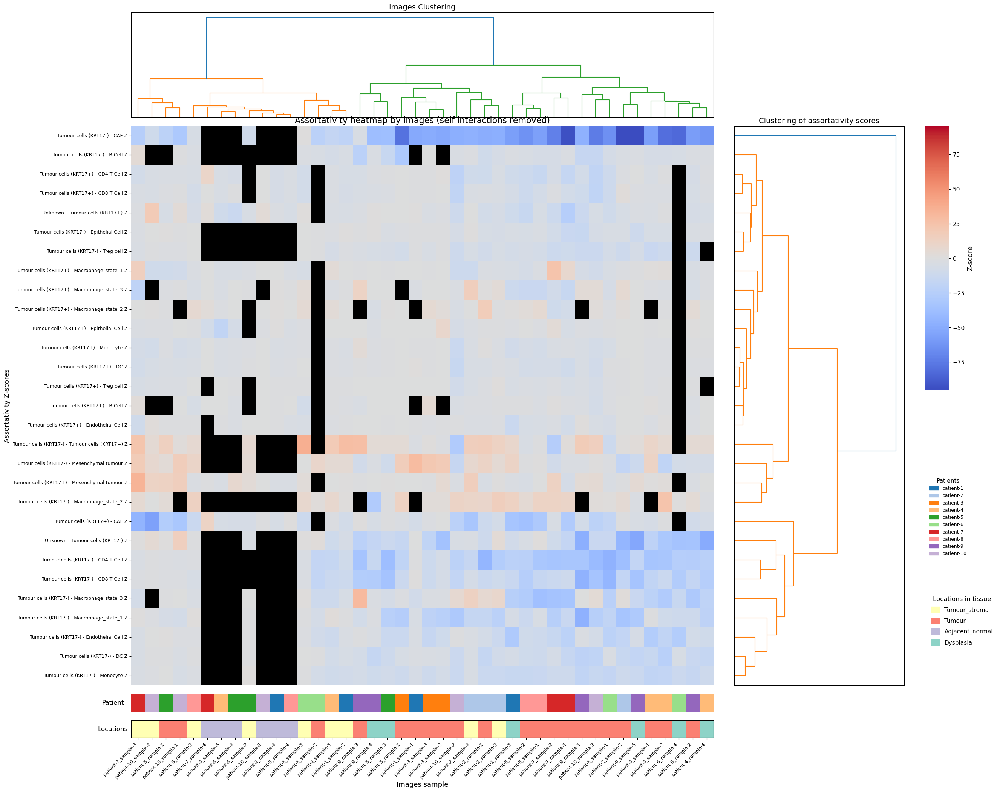

In [160]:
#dengrogramme sans diag avec label de location et heatmap avec les z scores de mosna.groups_assort_mixmat
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches

from matplotlib.colors import ListedColormap, TwoSlopeNorm
from matplotlib.gridspec import GridSpec
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist




import re

# ------------------------------------------------------------------
# 1. Préparation des données
# ------------------------------------------------------------------

net_stat_indexed = net_stat.set_index("id").copy()

assort_cols = net_stat_indexed.columns[net_stat_indexed.columns.str.endswith(" Z")]
assort_cols = [col for col in assort_cols if col != "assort Z"]

heatmap_data = net_stat_indexed[assort_cols].T.astype(float)


selected_rows = [
    col for col in heatmap_data.index
    if (
        len((parts := re.sub(r"\s+Z$", "", col).split(" - "))) == 2
        and parts[0] in phenotypes
        or parts[1] in phenotypes
    )
]

heatmap_data = heatmap_data.loc[selected_rows]


# Masquer les interactions cellule-cellule identiques
same_cell_rows = []

for row_name in heatmap_data.index:

    # enlève le suffixe " Z"
    pair = row_name.replace(" Z", "")

    # sépare "A - B"
    if " - " in pair:
        cell_a, cell_b = pair.split(" - ", 1)

        if cell_a.strip() == cell_b.strip():
            same_cell_rows.append(row_name)

# Remplace toutes les valeurs de ces lignes par NaN
heatmap_data.loc[same_cell_rows] = np.nan

heatmap_data = heatmap_data.replace([np.inf, -np.inf], np.nan)
heatmap_data = heatmap_data.dropna(axis=0, how="all")
heatmap_data = heatmap_data.dropna(axis=1, how="all")

# ------------------------------------------------------------------
# 2. Clustering des colonnes et des lignes
# ------------------------------------------------------------------

cluster_matrix_cols = heatmap_data.T.fillna(0)
col_linkage = linkage(pdist(cluster_matrix_cols, metric="euclidean"), method="ward")

cluster_matrix_rows = heatmap_data.fillna(0)
row_linkage = linkage(pdist(cluster_matrix_rows, metric="euclidean"), method="ward")

# ------------------------------------------------------------------
# 3. Ordre des feuilles
# ------------------------------------------------------------------

col_dendro_preview = dendrogram(col_linkage, no_plot=True)
col_leaf_order = col_dendro_preview["leaves"]

row_dendro_preview = dendrogram(row_linkage, no_plot=True)
row_leaf_order = row_dendro_preview["leaves"]

heatmap_data = heatmap_data.iloc[row_leaf_order, col_leaf_order]



# ------------------------------------------------------------------
# 4. Bande de couleur pour la location
# ------------------------------------------------------------------

location_series = net_stat_indexed.loc[heatmap_data.columns, "region_grouped"]


unique_locations = location_series.dropna().unique()
if location_to_color == None:
    palette = sns.color_palette("Set3", n_colors=len(unique_locations))
    location_to_color = dict(zip(unique_locations, palette))

location_to_int = {loc: i for i, loc in enumerate(unique_locations)}
location_ints = np.array([location_to_int.get(loc, -1) for loc in location_series])

annotation_colors = [
    location_to_color[loc]
    for loc in unique_locations
]
if (location_ints == -1).any():
    annotation_colors.append((0.0, 0.0, 0.0))
    missing_index = len(annotation_colors) - 1
    location_ints = np.where(location_ints == -1, missing_index, location_ints)

location_cmap = ListedColormap(annotation_colors)

# ------------------------------------------------------------------
# Annotation patient
# ------------------------------------------------------------------

patient_series = pd.Series(
    heatmap_data.columns.str.split("_").str[0],
    index=heatmap_data.columns
)

unique_patients = sorted(
    patient_series.unique(),
    key=lambda x: int(x.split("-")[-1])
)


patient_palette = sns.color_palette(
    "tab20",
    n_colors=len(unique_patients)
)

patient_to_color = dict(
    zip(unique_patients, patient_palette)
)

patient_to_int = {
    pat: i
    for i, pat in enumerate(unique_patients)
}

patient_ints = np.array(
    [patient_to_int[p] for p in patient_series]
)

patient_cmap = ListedColormap(
    [patient_to_color[p] for p in unique_patients]
)

# ------------------------------------------------------------------
# 5. Normalisation de la heatmap
# ------------------------------------------------------------------

vals = heatmap_data.to_numpy()
valid_vals = vals[~np.isnan(vals)]

if valid_vals.size == 0:
    raise ValueError("La matrice ne contient aucune valeur exploitable.")

zlim = np.nanmax(np.abs(valid_vals))
norm = TwoSlopeNorm(vmin=-zlim, vcenter=0, vmax=zlim)

cmap = plt.cm.coolwarm.copy()
cmap.set_bad(color="black")

# ------------------------------------------------------------------
# 5. Normalisation de la heatmap
# ------------------------------------------------------------------

vals = heatmap_data.to_numpy()
valid_vals = vals[~np.isnan(vals)]

if valid_vals.size == 0:
    raise ValueError("La matrice ne contient aucune valeur exploitable.")

zlim = np.nanmax(np.abs(valid_vals))
norm = TwoSlopeNorm(vmin=-zlim, vcenter=0, vmax=zlim)

cmap = plt.cm.coolwarm.copy()
cmap.set_bad(color="black")

# ------------------------------------------------------------------
# 6. Mise en page
# ------------------------------------------------------------------

fig = plt.figure(figsize=(28, 25))

gs = GridSpec(
    nrows=4,
    ncols=3,
    width_ratios=[24, 7, 1],
    height_ratios=[3, 16, 0.5, 0.5],
    wspace=0.08,
    hspace=0.05
)



ax_dendro_col = fig.add_subplot(gs[0, 0])
ax_heat = fig.add_subplot(gs[1, 0])

ax_patient = fig.add_subplot(gs[2, 0], sharex=ax_heat)
ax_loc     = fig.add_subplot(gs[3, 0], sharex=ax_heat)

ax_dendro_row = fig.add_subplot(gs[1, 1])

right_gs = gs[1, 2].subgridspec(
    nrows=2,
    ncols=1,
    height_ratios=[5, 4],
    hspace=0.35
)

cbar_ax = fig.add_subplot(right_gs[0, 0])
legend_ax = fig.add_subplot(right_gs[1, 0])

ax_top_unused_1 = fig.add_subplot(gs[0, 1])
ax_top_unused_2 = fig.add_subplot(gs[0, 2])
ax_bottom_unused_1 = fig.add_subplot(gs[3, 1])
ax_bottom_unused_2 = fig.add_subplot(gs[3, 2])

ax_top_unused_1.axis("off")
ax_top_unused_2.axis("off")
ax_bottom_unused_1.axis("off")
ax_bottom_unused_2.axis("off")

# ------------------------------------------------------------------
# 7. Dendrogramme des colonnes
# ------------------------------------------------------------------

dendrogram(
    col_linkage,
    ax=ax_dendro_col,
    no_labels=True,
    color_threshold=None
)

ax_dendro_col.set_xticks([])
ax_dendro_col.set_yticks([])
ax_dendro_col.set_xlabel("")
ax_dendro_col.set_ylabel("")
ax_dendro_col.set_title("Images Clustering", fontsize=14)

# ------------------------------------------------------------------
# 8. Heatmap principale
# ------------------------------------------------------------------

sns.heatmap(
    heatmap_data,
    cmap=cmap,
    center=0,
    vmin=-zlim,
    vmax=zlim,
    ax=ax_heat,
    cbar_ax=cbar_ax,
    cbar_kws={"label": "Z-score"},
    yticklabels=heatmap_data.index,
    xticklabels=False
)

ax_heat.set_ylabel("Assortativity Z-scores", fontsize=13)
ax_heat.set_xlabel("")
ax_heat.set_title("Assortativity heatmap by images (self-interactions removed)", fontsize=16)
ax_heat.tick_params(axis="x", bottom=False, labelbottom=False)
ax_heat.tick_params(axis="y", labelsize=9)

# On garde les labels de lignes à gauche de la heatmap.
ax_heat.yaxis.tick_left()
ax_heat.yaxis.set_label_position("left")

# ------------------------------------------------------------------
# 9. Dendrogramme des lignes
# ------------------------------------------------------------------

dendrogram(
    row_linkage,
    ax=ax_dendro_row,
    orientation="right",
    no_labels=True,
    color_threshold=None
)

ax_dendro_row.set_xticks([])
ax_dendro_row.set_yticks([])
ax_dendro_row.set_xlabel("")
ax_dendro_row.set_ylabel("")
ax_dendro_row.set_title("Clustering of assortativity scores", fontsize=14)

n_rows = heatmap_data.shape[0]
ax_dendro_row.set_ylim(10 * n_rows, 0)


# ------------------------------------------------------------------
# 10. Bande patient
# ------------------------------------------------------------------

ax_patient.imshow(
    patient_ints[np.newaxis, :],
    aspect="auto",
    cmap=patient_cmap,
    interpolation="nearest",
    extent=[0, len(patient_ints), 0, 1]
)

# Titre de la bande
ax_patient.set_ylabel(
    "Patient",
    rotation=0,
    labelpad=35,
    va="center",
    fontsize=12
)

# Supprime tout axe visible
ax_patient.set_yticks([])
ax_patient.set_xticks([])
ax_patient.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

# Optionnel : enlever les bordures
for spine in ax_patient.spines.values():
    spine.set_visible(False)




# ------------------------------------------------------------------
# 10. Bande de location
# ------------------------------------------------------------------

ax_loc.imshow(
    location_ints[np.newaxis, :],
    aspect="auto",
    cmap=location_cmap,
    interpolation="nearest",
    extent=[0, len(location_ints), 0, 1]
)

ax_loc.set_yticks([])
ax_loc.set_ylabel("Locations", rotation=0, labelpad=35, va="center", fontsize=12)

x_centers = np.arange(len(heatmap_data.columns)) + 0.5
ax_loc.set_xticks(x_centers)
ax_loc.set_xticklabels(heatmap_data.columns, rotation=45, ha="right", fontsize=9)
ax_loc.set_xlim(0, len(location_ints))
ax_loc.set_xlabel("Images sample", fontsize=13)

# ------------------------------------------------------------------
# 11. Colorbar et légende
# ------------------------------------------------------------------

cbar_ax.tick_params(labelsize=11)
cbar_ax.set_ylabel("Z-score", fontsize=13)

legend_ax.axis("off")
# --------------------------
# Patient legend
# --------------------------

patient_handles = [
    mpatches.Patch(
        color=patient_to_color[p],
        label=p
    )
    for p in unique_patients
]

legend_patient = legend_ax.legend(
    handles=patient_handles,
    title="Patients",
    loc="upper left",
    bbox_to_anchor=(0, 1),
    frameon=False,
    fontsize=9,
    title_fontsize=11,
    ncol=1
)

legend_ax.add_artist(legend_patient)

# --------------------------
# Location legend
# --------------------------

location_handles = [
    mpatches.Patch(
        color=location_to_color[loc],
        label=loc
    )
    for loc in unique_locations
]

legend_ax.legend(
    handles=location_handles,
    title="Locations in tissue",
    loc="upper left",
    bbox_to_anchor=(0, 0.45),
    frameon=False,
    fontsize=11,
    title_fontsize=12,
    handlelength=1.5,
    handleheight=1.2,
    labelspacing=0.8,
    borderpad=0.6
)
plt.savefig(save_dir / "selected_labeled_assort_group_heatmap_dendro_sang_diag.png", bbox_inches="tight")
plt.show()


### Selection où interactions doit avoir phénotype de la liste pour les DEUX cell type et pas seulement 1 des deux

In [ ]:
phenotypes = [
    "Tumour cells (KRT17-)",
    "Tumour cells (KRT17+)",
    "Macrophage_state_3",
    "Macrophage_state_1",
    "Macrophage_state_2",
    "CAF",
    "CD8 T Cell",
    "CD4 T Cell",
    "Treg cell",
    "B Cell",
    


]

plot_file_name_prefix = 'macrophages_T_and_B_cells_selected'

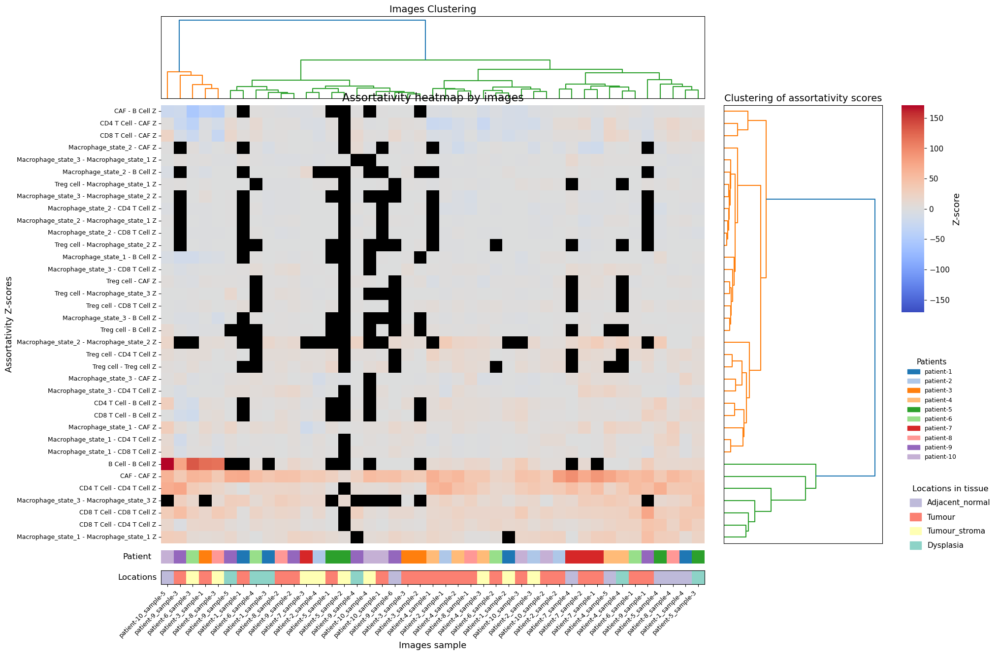

In [162]:
#dengrogramme avec label de location et heatmap avec les z scores de mosna.groups_assort_mixmat
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches

from matplotlib.colors import ListedColormap, TwoSlopeNorm
from matplotlib.gridspec import GridSpec
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist


# Enlever le " Z" à la fin

import re

# ------------------------------------------------------------------
# 1. Préparation des données
# ------------------------------------------------------------------

net_stat_indexed = net_stat.set_index("id").copy()

assort_cols = net_stat_indexed.columns[net_stat_indexed.columns.str.endswith(" Z")]
assort_cols = [col for col in assort_cols if col != "assort Z"]

heatmap_data = net_stat_indexed[assort_cols].T.astype(float)
heatmap_data = heatmap_data.replace([np.inf, -np.inf], np.nan)
heatmap_data = heatmap_data.dropna(axis=0, how="all")
heatmap_data = heatmap_data.dropna(axis=1, how="all")

selected_rows = [
    col for col in heatmap_data.index
    if (
        len((parts := re.sub(r"\s+Z$", "", col).split(" - "))) == 2
        and parts[0] in phenotypes
        and parts[1] in phenotypes
    )
]

heatmap_data = heatmap_data.loc[selected_rows]


# ------------------------------------------------------------------
# 2. Clustering des colonnes et des lignes
# ------------------------------------------------------------------

cluster_matrix_cols = heatmap_data.T.fillna(0)
col_linkage = linkage(pdist(cluster_matrix_cols, metric="euclidean"), method="ward")

cluster_matrix_rows = heatmap_data.fillna(0)
row_linkage = linkage(pdist(cluster_matrix_rows, metric="euclidean"), method="ward")

# ------------------------------------------------------------------
# 3. Ordre des feuilles
# ------------------------------------------------------------------

col_dendro_preview = dendrogram(col_linkage, no_plot=True)
col_leaf_order = col_dendro_preview["leaves"]

row_dendro_preview = dendrogram(row_linkage, no_plot=True)
row_leaf_order = row_dendro_preview["leaves"]

heatmap_data = heatmap_data.iloc[row_leaf_order, col_leaf_order]

# ------------------------------------------------------------------
# 4. Bande de couleur pour la location
# ------------------------------------------------------------------

location_series = net_stat_indexed.loc[heatmap_data.columns, "region_grouped"]


unique_locations = location_series.dropna().unique()
if location_to_color == None:
    palette = sns.color_palette("Set3", n_colors=len(unique_locations))
    location_to_color = dict(zip(unique_locations, palette))

location_to_int = {loc: i for i, loc in enumerate(unique_locations)}
location_ints = np.array([location_to_int.get(loc, -1) for loc in location_series])

annotation_colors = [
    location_to_color[loc]
    for loc in unique_locations
]
if (location_ints == -1).any():
    annotation_colors.append((0.0, 0.0, 0.0))
    missing_index = len(annotation_colors) - 1
    location_ints = np.where(location_ints == -1, missing_index, location_ints)

location_cmap = ListedColormap(annotation_colors)

# ------------------------------------------------------------------
# Annotation patient
# ------------------------------------------------------------------

patient_series = pd.Series(
    heatmap_data.columns.str.split("_").str[0],
    index=heatmap_data.columns
)

unique_patients = sorted(
    patient_series.unique(),
    key=lambda x: int(x.split("-")[-1])
)


patient_palette = sns.color_palette(
    "tab20",
    n_colors=len(unique_patients)
)

patient_to_color = dict(
    zip(unique_patients, patient_palette)
)

patient_to_int = {
    pat: i
    for i, pat in enumerate(unique_patients)
}

patient_ints = np.array(
    [patient_to_int[p] for p in patient_series]
)

patient_cmap = ListedColormap(
    [patient_to_color[p] for p in unique_patients]
)

# ------------------------------------------------------------------
# 5. Normalisation de la heatmap
# ------------------------------------------------------------------

vals = heatmap_data.to_numpy()
valid_vals = vals[~np.isnan(vals)]

if valid_vals.size == 0:
    raise ValueError("La matrice ne contient aucune valeur exploitable.")

zlim = np.nanmax(np.abs(valid_vals))
norm = TwoSlopeNorm(vmin=-zlim, vcenter=0, vmax=zlim)

cmap = plt.cm.coolwarm.copy()
cmap.set_bad(color="black")

# ------------------------------------------------------------------
# 6. Mise en page
# ------------------------------------------------------------------

fig = plt.figure(figsize=(20, 15))

gs = GridSpec(
    nrows=4,
    ncols=3,
    width_ratios=[24, 7, 1],
    height_ratios=[3, 16, 0.5, 0.5],
    wspace=0.08,
    hspace=0.05
)



ax_dendro_col = fig.add_subplot(gs[0, 0])
ax_heat = fig.add_subplot(gs[1, 0])

ax_patient = fig.add_subplot(gs[2, 0], sharex=ax_heat)
ax_loc     = fig.add_subplot(gs[3, 0], sharex=ax_heat)



ax_dendro_row = fig.add_subplot(gs[1, 1])

right_gs = gs[1, 2].subgridspec(
    nrows=2,
    ncols=1,
    height_ratios=[5, 4],
    hspace=0.35
)

cbar_ax = fig.add_subplot(right_gs[0, 0])
legend_ax = fig.add_subplot(right_gs[1, 0])

ax_top_unused_1 = fig.add_subplot(gs[0, 1])
ax_top_unused_2 = fig.add_subplot(gs[0, 2])
#ax_bottom_unused_1 = fig.add_subplot(gs[2, 1])
#ax_bottom_unused_2 = fig.add_subplot(gs[2, 2])

ax_bottom_unused_1 = fig.add_subplot(gs[3, 1])
ax_bottom_unused_2 = fig.add_subplot(gs[3, 2])

ax_top_unused_1.axis("off")
ax_top_unused_2.axis("off")
ax_bottom_unused_1.axis("off")
ax_bottom_unused_2.axis("off")

# ------------------------------------------------------------------
# 7. Dendrogramme des colonnes
# ------------------------------------------------------------------

dendrogram(
    col_linkage,
    ax=ax_dendro_col,
    no_labels=True,
    color_threshold=None
)

ax_dendro_col.set_xticks([])
ax_dendro_col.set_yticks([])
ax_dendro_col.set_xlabel("")
ax_dendro_col.set_ylabel("")
ax_dendro_col.set_title("Images Clustering", fontsize=14)

# ------------------------------------------------------------------
# 8. Heatmap principale
# ------------------------------------------------------------------

sns.heatmap(
    heatmap_data,
    cmap=cmap,
    center=0,
    vmin=-zlim,
    vmax=zlim,
    ax=ax_heat,
    cbar_ax=cbar_ax,
    cbar_kws={"label": "Z-score"},
    yticklabels=heatmap_data.index,
    xticklabels=False
)

ax_heat.set_ylabel("Assortativity Z-scores", fontsize=13)
ax_heat.set_xlabel("")
ax_heat.set_title("Assortativity heatmap by images", fontsize=16)
ax_heat.tick_params(axis="x", bottom=False, labelbottom=False)
ax_heat.tick_params(axis="y", labelsize=9)

# On garde les labels de lignes à gauche de la heatmap.
ax_heat.yaxis.tick_left()
ax_heat.yaxis.set_label_position("left")

# ------------------------------------------------------------------
# 9. Dendrogramme des lignes
# ------------------------------------------------------------------

dendrogram(
    row_linkage,
    ax=ax_dendro_row,
    orientation="right",
    no_labels=True,
    color_threshold=None
)

ax_dendro_row.set_xticks([])
ax_dendro_row.set_yticks([])
ax_dendro_row.set_xlabel("")
ax_dendro_row.set_ylabel("")
ax_dendro_row.set_title("Clustering of assortativity scores", fontsize=14)

n_rows = heatmap_data.shape[0]
ax_dendro_row.set_ylim(10 * n_rows, 0)

# ------------------------------------------------------------------
# 10. Bande patient
# ------------------------------------------------------------------

ax_patient.imshow(
    patient_ints[np.newaxis, :],
    aspect="auto",
    cmap=patient_cmap,
    interpolation="nearest",
    extent=[0, len(patient_ints), 0, 1]
)

# Titre de la bande
ax_patient.set_ylabel(
    "Patient",
    rotation=0,
    labelpad=35,
    va="center",
    fontsize=12
)

# Supprime tout axe visible
ax_patient.set_yticks([])
ax_patient.set_xticks([])
ax_patient.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

# Optionnel : enlever les bordures
for spine in ax_patient.spines.values():
    spine.set_visible(False)



# ------------------------------------------------------------------
# 10. Bande de location
# ------------------------------------------------------------------

ax_loc.imshow(
    location_ints[np.newaxis, :],
    aspect="auto",
    cmap=location_cmap,
    interpolation="nearest",
    extent=[0, len(location_ints), 0, 1]
)

ax_loc.set_yticks([])
ax_loc.set_ylabel("Locations", rotation=0, labelpad=35, va="center", fontsize=12)

x_centers = np.arange(len(heatmap_data.columns)) + 0.5
ax_loc.set_xticks(x_centers)
ax_loc.set_xticklabels(heatmap_data.columns, rotation=45, ha="right", fontsize=9)
ax_loc.set_xlim(0, len(location_ints))
ax_loc.set_xlabel("Images sample", fontsize=13)

# ------------------------------------------------------------------
# 11. Colorbar et légende
# ------------------------------------------------------------------

cbar_ax.tick_params(labelsize=11)
cbar_ax.set_ylabel("Z-score", fontsize=13)

legend_ax.axis("off")

# --------------------------
# Patient legend
# --------------------------

patient_handles = [
    mpatches.Patch(
        color=patient_to_color[p],
        label=p
    )
    for p in unique_patients
]

legend_patient = legend_ax.legend(
    handles=patient_handles,
    title="Patients",
    loc="upper left",
    bbox_to_anchor=(0, 1.15),
    frameon=False,
    fontsize=9,
    title_fontsize=11,
    ncol=1
)

legend_ax.add_artist(legend_patient)

# --------------------------
# Location legend
# --------------------------

location_handles = [
    mpatches.Patch(
        color=location_to_color[loc],
        label=loc
    )
    for loc in unique_locations
]

legend_ax.legend(
    handles=location_handles,
    title="Locations in tissue",
    loc="upper left",
    bbox_to_anchor=(0, 0.40),
    frameon=False,
    fontsize=11,
    title_fontsize=12,
    handlelength=1.5,
    handleheight=1.2,
    labelspacing=0.8,
    borderpad=0.6
)
plt.savefig(save_dir / f'{plot_file_name_prefix}_labeled_assort_group_heatmap_dendro.png', bbox_inches="tight")
plt.show()


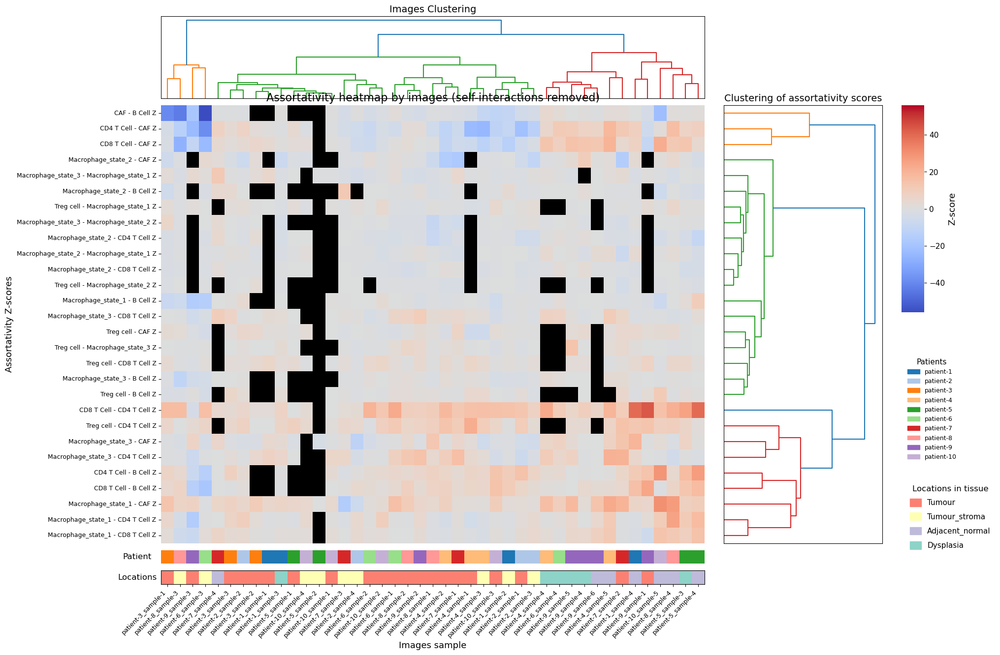

In [163]:
#dengrogramme sans diag avec label de location et heatmap avec les z scores de mosna.groups_assort_mixmat
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches

from matplotlib.colors import ListedColormap, TwoSlopeNorm
from matplotlib.gridspec import GridSpec
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist




import re

# ------------------------------------------------------------------
# 1. Préparation des données
# ------------------------------------------------------------------

net_stat_indexed = net_stat.set_index("id").copy()

assort_cols = net_stat_indexed.columns[net_stat_indexed.columns.str.endswith(" Z")]
assort_cols = [col for col in assort_cols if col != "assort Z"]

heatmap_data = net_stat_indexed[assort_cols].T.astype(float)


selected_rows = [
    col for col in heatmap_data.index
    if (
        len((parts := re.sub(r"\s+Z$", "", col).split(" - "))) == 2
        and parts[0] in phenotypes
        and parts[1] in phenotypes
    )
]

heatmap_data = heatmap_data.loc[selected_rows]


# Masquer les interactions cellule-cellule identiques
same_cell_rows = []

for row_name in heatmap_data.index:

    # enlève le suffixe " Z"
    pair = row_name.replace(" Z", "")

    # sépare "A - B"
    if " - " in pair:
        cell_a, cell_b = pair.split(" - ", 1)

        if cell_a.strip() == cell_b.strip():
            same_cell_rows.append(row_name)

# Remplace toutes les valeurs de ces lignes par NaN
heatmap_data.loc[same_cell_rows] = np.nan

heatmap_data = heatmap_data.replace([np.inf, -np.inf], np.nan)
heatmap_data = heatmap_data.dropna(axis=0, how="all")
heatmap_data = heatmap_data.dropna(axis=1, how="all")

# ------------------------------------------------------------------
# 2. Clustering des colonnes et des lignes
# ------------------------------------------------------------------

cluster_matrix_cols = heatmap_data.T.fillna(0)
col_linkage = linkage(pdist(cluster_matrix_cols, metric="euclidean"), method="ward")

cluster_matrix_rows = heatmap_data.fillna(0)
row_linkage = linkage(pdist(cluster_matrix_rows, metric="euclidean"), method="ward")

# ------------------------------------------------------------------
# 3. Ordre des feuilles
# ------------------------------------------------------------------

col_dendro_preview = dendrogram(col_linkage, no_plot=True)
col_leaf_order = col_dendro_preview["leaves"]

row_dendro_preview = dendrogram(row_linkage, no_plot=True)
row_leaf_order = row_dendro_preview["leaves"]

heatmap_data = heatmap_data.iloc[row_leaf_order, col_leaf_order]



# ------------------------------------------------------------------
# 4. Bande de couleur pour la location
# ------------------------------------------------------------------

location_series = net_stat_indexed.loc[heatmap_data.columns, "region_grouped"]


unique_locations = location_series.dropna().unique()
if location_to_color == None:
    palette = sns.color_palette("Set3", n_colors=len(unique_locations))
    location_to_color = dict(zip(unique_locations, palette))

location_to_int = {loc: i for i, loc in enumerate(unique_locations)}
location_ints = np.array([location_to_int.get(loc, -1) for loc in location_series])

annotation_colors = [
    location_to_color[loc]
    for loc in unique_locations
]
if (location_ints == -1).any():
    annotation_colors.append((0.0, 0.0, 0.0))
    missing_index = len(annotation_colors) - 1
    location_ints = np.where(location_ints == -1, missing_index, location_ints)

location_cmap = ListedColormap(annotation_colors)

# ------------------------------------------------------------------
# Annotation patient
# ------------------------------------------------------------------

patient_series = pd.Series(
    heatmap_data.columns.str.split("_").str[0],
    index=heatmap_data.columns
)

unique_patients = sorted(
    patient_series.unique(),
    key=lambda x: int(x.split("-")[-1])
)


patient_palette = sns.color_palette(
    "tab20",
    n_colors=len(unique_patients)
)

patient_to_color = dict(
    zip(unique_patients, patient_palette)
)

patient_to_int = {
    pat: i
    for i, pat in enumerate(unique_patients)
}

patient_ints = np.array(
    [patient_to_int[p] for p in patient_series]
)

patient_cmap = ListedColormap(
    [patient_to_color[p] for p in unique_patients]
)

# ------------------------------------------------------------------
# 5. Normalisation de la heatmap
# ------------------------------------------------------------------

vals = heatmap_data.to_numpy()
valid_vals = vals[~np.isnan(vals)]

if valid_vals.size == 0:
    raise ValueError("La matrice ne contient aucune valeur exploitable.")

zlim = np.nanmax(np.abs(valid_vals))
norm = TwoSlopeNorm(vmin=-zlim, vcenter=0, vmax=zlim)

cmap = plt.cm.coolwarm.copy()
cmap.set_bad(color="black")

# ------------------------------------------------------------------
# 5. Normalisation de la heatmap
# ------------------------------------------------------------------

vals = heatmap_data.to_numpy()
valid_vals = vals[~np.isnan(vals)]

if valid_vals.size == 0:
    raise ValueError("La matrice ne contient aucune valeur exploitable.")

zlim = np.nanmax(np.abs(valid_vals))
norm = TwoSlopeNorm(vmin=-zlim, vcenter=0, vmax=zlim)

cmap = plt.cm.coolwarm.copy()
cmap.set_bad(color="black")

# ------------------------------------------------------------------
# 6. Mise en page
# ------------------------------------------------------------------

fig = plt.figure(figsize=(20, 15))

gs = GridSpec(
    nrows=4,
    ncols=3,
    width_ratios=[24, 7, 1],
    height_ratios=[3, 16, 0.5, 0.5],
    wspace=0.08,
    hspace=0.05
)



ax_dendro_col = fig.add_subplot(gs[0, 0])
ax_heat = fig.add_subplot(gs[1, 0])

ax_patient = fig.add_subplot(gs[2, 0], sharex=ax_heat)
ax_loc     = fig.add_subplot(gs[3, 0], sharex=ax_heat)

ax_dendro_row = fig.add_subplot(gs[1, 1])

right_gs = gs[1, 2].subgridspec(
    nrows=2,
    ncols=1,
    height_ratios=[5, 4],
    hspace=0.35
)

cbar_ax = fig.add_subplot(right_gs[0, 0])
legend_ax = fig.add_subplot(right_gs[1, 0])

ax_top_unused_1 = fig.add_subplot(gs[0, 1])
ax_top_unused_2 = fig.add_subplot(gs[0, 2])
ax_bottom_unused_1 = fig.add_subplot(gs[3, 1])
ax_bottom_unused_2 = fig.add_subplot(gs[3, 2])

ax_top_unused_1.axis("off")
ax_top_unused_2.axis("off")
ax_bottom_unused_1.axis("off")
ax_bottom_unused_2.axis("off")

# ------------------------------------------------------------------
# 7. Dendrogramme des colonnes
# ------------------------------------------------------------------

dendrogram(
    col_linkage,
    ax=ax_dendro_col,
    no_labels=True,
    color_threshold=None
)

ax_dendro_col.set_xticks([])
ax_dendro_col.set_yticks([])
ax_dendro_col.set_xlabel("")
ax_dendro_col.set_ylabel("")
ax_dendro_col.set_title("Images Clustering", fontsize=14)

# ------------------------------------------------------------------
# 8. Heatmap principale
# ------------------------------------------------------------------

sns.heatmap(
    heatmap_data,
    cmap=cmap,
    center=0,
    vmin=-zlim,
    vmax=zlim,
    ax=ax_heat,
    cbar_ax=cbar_ax,
    cbar_kws={"label": "Z-score"},
    yticklabels=heatmap_data.index,
    xticklabels=False
)

ax_heat.set_ylabel("Assortativity Z-scores", fontsize=13)
ax_heat.set_xlabel("")
ax_heat.set_title("Assortativity heatmap by images (self-interactions removed)", fontsize=16)
ax_heat.tick_params(axis="x", bottom=False, labelbottom=False)
ax_heat.tick_params(axis="y", labelsize=9)

# On garde les labels de lignes à gauche de la heatmap.
ax_heat.yaxis.tick_left()
ax_heat.yaxis.set_label_position("left")

# ------------------------------------------------------------------
# 9. Dendrogramme des lignes
# ------------------------------------------------------------------

dendrogram(
    row_linkage,
    ax=ax_dendro_row,
    orientation="right",
    no_labels=True,
    color_threshold=None
)

ax_dendro_row.set_xticks([])
ax_dendro_row.set_yticks([])
ax_dendro_row.set_xlabel("")
ax_dendro_row.set_ylabel("")
ax_dendro_row.set_title("Clustering of assortativity scores", fontsize=14)

n_rows = heatmap_data.shape[0]
ax_dendro_row.set_ylim(10 * n_rows, 0)


# ------------------------------------------------------------------
# 10. Bande patient
# ------------------------------------------------------------------

ax_patient.imshow(
    patient_ints[np.newaxis, :],
    aspect="auto",
    cmap=patient_cmap,
    interpolation="nearest",
    extent=[0, len(patient_ints), 0, 1]
)

# Titre de la bande
ax_patient.set_ylabel(
    "Patient",
    rotation=0,
    labelpad=35,
    va="center",
    fontsize=12
)

# Supprime tout axe visible
ax_patient.set_yticks([])
ax_patient.set_xticks([])
ax_patient.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

# Optionnel : enlever les bordures
for spine in ax_patient.spines.values():
    spine.set_visible(False)




# ------------------------------------------------------------------
# 10. Bande de location
# ------------------------------------------------------------------

ax_loc.imshow(
    location_ints[np.newaxis, :],
    aspect="auto",
    cmap=location_cmap,
    interpolation="nearest",
    extent=[0, len(location_ints), 0, 1]
)

ax_loc.set_yticks([])
ax_loc.set_ylabel("Locations", rotation=0, labelpad=35, va="center", fontsize=12)

x_centers = np.arange(len(heatmap_data.columns)) + 0.5
ax_loc.set_xticks(x_centers)
ax_loc.set_xticklabels(heatmap_data.columns, rotation=45, ha="right", fontsize=9)
ax_loc.set_xlim(0, len(location_ints))
ax_loc.set_xlabel("Images sample", fontsize=13)

# ------------------------------------------------------------------
# 11. Colorbar et légende
# ------------------------------------------------------------------

cbar_ax.tick_params(labelsize=11)
cbar_ax.set_ylabel("Z-score", fontsize=13)

legend_ax.axis("off")
# --------------------------
# Patient legend
# --------------------------

patient_handles = [
    mpatches.Patch(
        color=patient_to_color[p],
        label=p
    )
    for p in unique_patients
]

legend_patient = legend_ax.legend(
    handles=patient_handles,
    title="Patients",
    loc="upper left",
    bbox_to_anchor=(0, 1.15),
    frameon=False,
    fontsize=9,
    title_fontsize=11,
    ncol=1
)

legend_ax.add_artist(legend_patient)

# --------------------------
# Location legend
# --------------------------

location_handles = [
    mpatches.Patch(
        color=location_to_color[loc],
        label=loc
    )
    for loc in unique_locations
]

legend_ax.legend(
    handles=location_handles,
    title="Locations in tissue",
    loc="upper left",
    bbox_to_anchor=(0, 0.40),
    frameon=False,
    fontsize=11,
    title_fontsize=12,
    handlelength=1.5,
    handleheight=1.2,
    labelspacing=0.8,
    borderpad=0.6
)
plt.savefig(save_dir /f'{plot_file_name_prefix}_labeled_assort_group_heatmap_dendro_sang_diag.png', bbox_inches="tight")
plt.show()


In [164]:
heatmap_data

id,patient-3_sample-1,patient-8_sample-3,patient-9_sample-3,patient-6_sample-3,patient-7_sample-4,patient-3_sample-3,patient-2_sample-2,patient-3_sample-2,patient-1_sample-1,patient-1_sample-3,...,patient-9_sample-4,patient-9_sample-6,patient-4_sample-5,patient-7_sample-2,patient-1_sample-4,patient-9_sample-1,patient-10_sample-5,patient-8_sample-4,patient-5_sample-3,patient-5_sample-4
CAF - B Cell Z,-39.682565,-43.663115,-18.689033,-55.947230,-0.490828,-0.497050,-1.266757,NaN,NaN,0.684025,...,0.789720,-0.545311,2.014986,1.788002,-0.092660,-3.549395e+00,-22.391829,1.286727,0.870717,1.063798
CD4 T Cell - CAF Z,-3.194669,-13.819902,-23.638659,-38.599151,7.477487,3.301694,7.242802,2.065062,0.763545,-0.524782,...,7.070276,6.540536,18.550375,12.111889,9.040231,-5.703486e+00,1.700060,16.276454,7.136366,8.909521
CD8 T Cell - CAF Z,-2.585387,-26.960774,-10.020391,-23.760457,3.837540,1.544040,3.117216,5.510365,3.796316,0.645632,...,13.268518,12.501046,19.718185,4.185326,7.562264,-9.509412e+00,21.933258,12.107036,13.340964,4.121633
Macrophage_state_2 - CAF Z,-5.854127,-1.293485,NaN,3.577249,2.004593,-2.231852,-6.153339,1.928493,NaN,-7.414883,...,9.925709,0.593166,1.699428,-15.590037,2.808450,NaN,1.257026,4.370697,0.174429,-3.298441
Macrophage_state_3 - Macrophage_state_1 Z,1.834505,-2.017125,3.759699,1.251642,12.206556,0.289495,-1.239408,1.848947,5.066380,-1.717618,...,NaN,-0.281312,1.500462,2.623744,-1.975753,7.142857e-01,-0.620174,-2.895147,-0.336336,-0.703989
Macrophage_state_2 - B Cell Z,-5.396785,-1.094541,NaN,-1.768649,3.958114,3.747237,-0.349563,NaN,NaN,-0.470871,...,2.022435,-0.081923,-0.488304,-1.109916,-0.500000,NaN,-6.403420,-0.221249,-2.555170,-3.534879
Treg cell - Macrophage_state_1 Z,2.397500,-0.923345,1.466671,-0.102923,NaN,1.536456,2.308382,0.173266,-0.252646,-1.407172,...,-0.116248,NaN,-0.549442,0.131842,-0.498161,2.747005e+00,0.012083,5.012822,0.698329,0.525660
Macrophage_state_3 - Macrophage_state_2 Z,5.785300,-1.224426,NaN,-0.281312,3.248805,-0.284975,-1.158995,-0.308043,NaN,-3.121092,...,-1.380330,NaN,-1.761410,-3.381061,0.495425,NaN,-0.394116,-0.380274,0.332088,-0.872307
Macrophage_state_2 - CD4 T Cell Z,-2.268084,-0.905753,NaN,-1.929846,4.138029,-0.160199,-1.587878,2.540737,NaN,-2.979063,...,1.429182,-0.252646,-2.054873,-2.379195,-1.409951,NaN,-3.785643,-0.575356,-3.690606,-9.244943
Macrophage_state_2 - Macrophage_state_1 Z,-1.859695,-0.489560,NaN,-1.199520,-0.644934,1.264282,0.622968,-1.312226,NaN,-1.811329,...,-1.922231,2.649995,3.300108,-7.286200,3.250184,NaN,0.236649,2.530109,-0.795660,-3.422068


In [168]:
heatmap_df

,Tumour cells (KRT17-),Tumour cells (KRT17+),Macrophage_state_3,Macrophage_state_1,Macrophage_state_2
B Cell,-6.206385,-1.398993,-0.363259,-1.357954,-0.245825
CAF,-47.803125,-12.429209,1.444295,7.413608,-1.994793
CD4 T Cell,-21.277502,-5.420306,3.385582,2.520818,-1.722373
CD8 T Cell,-16.388123,-4.557011,1.659438,2.328017,-0.881770
DC,-8.687395,-3.106243,0.744467,-0.274383,-0.729520
Endothelial Cell,-9.583474,-2.288944,2.992020,2.438225,-0.300143
Epithelial Cell,-3.599267,-1.758856,-0.514127,-2.209377,-0.860712
Mesenchymal tumour,2.627815,2.326224,0.461572,-0.711533,2.233234
Monocyte,-9.820809,-3.004558,3.545424,2.368346,-0.125194
Treg cell,-6.158984,-1.914277,inf,0.451377,-0.834988


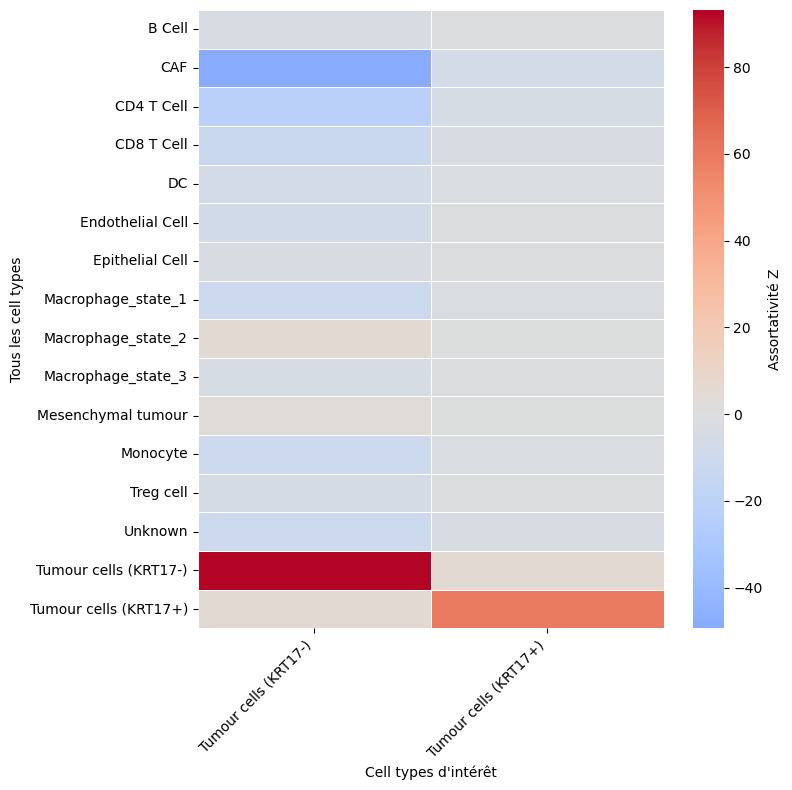

In [171]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# =====================================================
# 1) Cell types d'intérêt
# =====================================================

celltypes_interest = [
    "Tumour cells (KRT17-)",
    "Tumour cells (KRT17+)",
    #"Macrophage_state_3",
    #"Macrophage_state_1",
    #"Macrophage_state_2",
]


# =====================================================
# 2) Récupérer les scores d'assortativité
# =====================================================

net_stat_indexed = net_stat.set_index("id").copy()

assort_cols = [
    col for col in net_stat_indexed.columns
    if col.endswith(" Z") and col != "assort Z"
]


# lignes = paires de cell types
heatmap_data = (
    net_stat_indexed[assort_cols]
    .T
    .astype(float)
)


# moyenne des scores entre patients/régions
#assort_values = heatmap_data.mean(axis=1)

#médianne
assort_values = heatmap_data.median(axis=1)



# =====================================================
# 3) Construire matrice celltype x celltype
# =====================================================

celltypes = set()

for pair in assort_values.index:
    pair = pair.replace(" Z", "")
    
    if " - " in pair:
        a, b = pair.split(" - ")
        celltypes.add(a)
        celltypes.add(b)

celltypes = sorted(celltypes)


assort_matrix = pd.DataFrame(
    np.nan,
    index=celltypes,
    columns=celltypes
)


for pair, score in assort_values.items():

    pair = pair.replace(" Z", "")

    if " - " not in pair:
        continue

    a, b = pair.split(" - ")

    assort_matrix.loc[a, b] = score
    assort_matrix.loc[b, a] = score



# =====================================================
# 4) Garder uniquement les colonnes d'intérêt
# =====================================================

heatmap_df = assort_matrix[celltypes_interest]
heatmap_df = heatmap_df.replace([np.inf, -np.inf], np.nan)
heatmap_df = heatmap_df.dropna(axis=0, how="all")
heatmap_df = heatmap_df.dropna(axis=1, how="all")


# =====================================================
# 5) Mettre les cell types d'intérêt en bas
# =====================================================

other_cells = [
    x for x in heatmap_df.index
    if x not in celltypes_interest
]

heatmap_df = heatmap_df.loc[
    other_cells + celltypes_interest
]



# =====================================================
# 6) Heatmap
# =====================================================

plt.figure(
    figsize=(8, max(8, len(heatmap_df)*0.35))
)


ax = sns.heatmap(
    heatmap_df,
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    linecolor="white",
    cbar_kws={"label": "Assortativité Z"}
)


ax.xaxis.tick_bottom()
ax.xaxis.set_label_position("bottom")


plt.xlabel("Cell types d'intérêt")
plt.ylabel("Tous les cell types")

plt.xticks(
    rotation=45,
    ha="right"
)

plt.tight_layout()
plt.show()

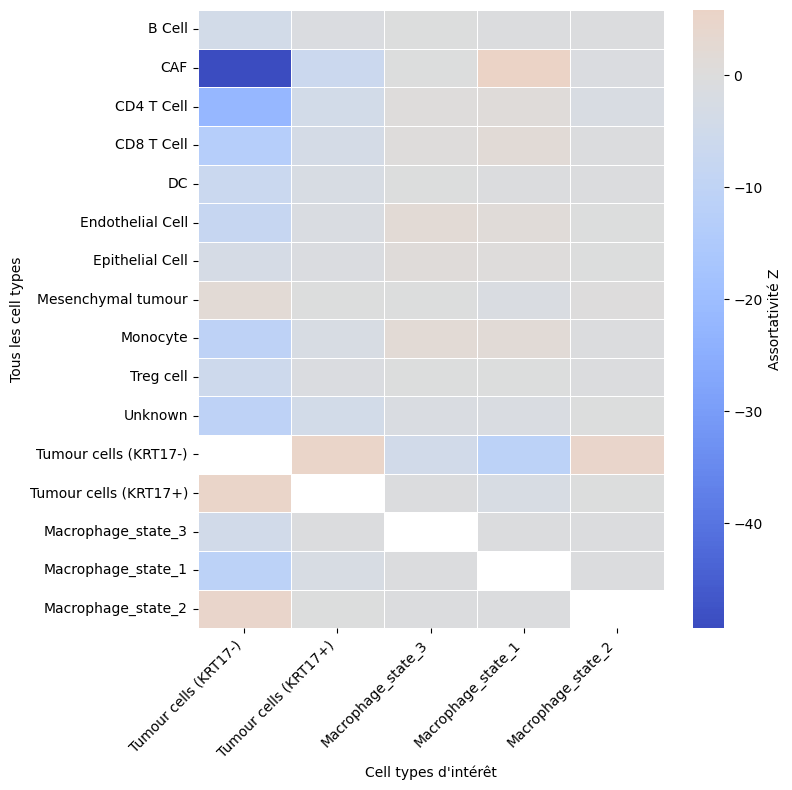

In [176]:



import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# =====================================================
# 1) Cell types d'intérêt
# =====================================================

celltypes_interest = [
    "Tumour cells (KRT17-)",
    "Tumour cells (KRT17+)",
    "Macrophage_state_3",
    "Macrophage_state_1",
    "Macrophage_state_2",
]


# =====================================================
# 2) Récupérer les scores d'assortativité
# =====================================================

net_stat_indexed = net_stat.set_index("id").copy()

assort_cols = [
    col for col in net_stat_indexed.columns
    if col.endswith(" Z") and col != "assort Z"
]


# lignes = paires de cell types
heatmap_data = (
    net_stat_indexed[assort_cols]
    .T
    .astype(float)
)


# moyenne des scores entre patients/régions
#assort_values = heatmap_data.mean(axis=1)

#médianne
assort_values = heatmap_data.median(axis=1)



# =====================================================
# 3) Construire matrice celltype x celltype
# =====================================================

celltypes = set()

for pair in assort_values.index:
    pair = pair.replace(" Z", "")
    
    if " - " in pair:
        a, b = pair.split(" - ")
        celltypes.add(a)
        celltypes.add(b)

celltypes = sorted(celltypes)


assort_matrix = pd.DataFrame(
    np.nan,
    index=celltypes,
    columns=celltypes
)


for pair, score in assort_values.items():

    pair = pair.replace(" Z", "")

    if " - " not in pair:
        continue

    a, b = pair.split(" - ")

    assort_matrix.loc[a, b] = score
    assort_matrix.loc[b, a] = score



# =====================================================
# 4) Garder uniquement les colonnes d'intérêt
# =====================================================

heatmap_df = assort_matrix[celltypes_interest].copy()

#Masquer les interactions cellule-cellule identiques


for celltype in heatmap_df.index:
    if celltype in heatmap_df.columns:
        heatmap_df.loc[celltype, celltype] = np.nan

# Remplace toutes les valeurs de ces lignes par NaN
heatmap_df.loc[same_cell_rows] = np.nan
heatmap_df = heatmap_df.replace([np.inf, -np.inf], np.nan)
heatmap_df = heatmap_df.dropna(axis=0, how="all")
heatmap_df = heatmap_df.dropna(axis=1, how="all")


# =====================================================
# 5) Mettre les cell types d'intérêt en bas
# =====================================================

other_cells = [
    x for x in heatmap_df.index
    if x not in celltypes_interest
]

heatmap_df = heatmap_df.loc[
    other_cells + celltypes_interest
]



# =====================================================
# 6) Heatmap
# =====================================================

plt.figure(
    figsize=(8, max(8, len(heatmap_df)*0.35))
)


ax = sns.heatmap(
    heatmap_df,
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    linecolor="white",
    cbar_kws={"label": "Assortativité Z"}
)


ax.xaxis.tick_bottom()
ax.xaxis.set_label_position("bottom")


plt.xlabel("Cell types d'intérêt")
plt.ylabel("Tous les cell types")

plt.xticks(
    rotation=45,
    ha="right"
)

plt.tight_layout()
plt.show()

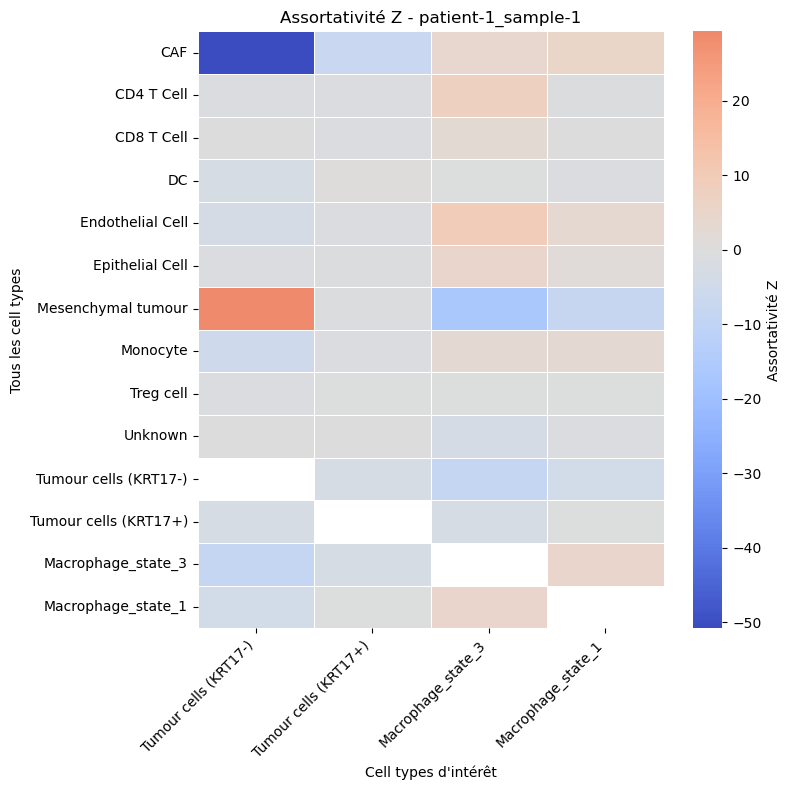

In [178]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# =====================================================
# 1) Cell types d'intérêt
# =====================================================

celltypes_interest = [
    "Tumour cells (KRT17-)",
    "Tumour cells (KRT17+)",
    "Macrophage_state_3",
    "Macrophage_state_1",
    "Macrophage_state_2",
]


# =====================================================
# 2) Choisir le sample
# =====================================================

sample_id = "patient-1_sample-1"   # <-- à remplacer


# =====================================================
# 3) Récupérer les scores d'assortativité du sample
# =====================================================

net_stat_indexed = net_stat.set_index("id").copy()

assort_cols = [
    col for col in net_stat_indexed.columns
    if col.endswith(" Z") and col != "assort Z"
]


# Uniquement le sample choisi
assort_values = (
    net_stat_indexed.loc[sample_id, assort_cols]
    .astype(float)
)



# =====================================================
# 4) Construire matrice celltype x celltype
# =====================================================

celltypes = set()

for pair in assort_values.index:
    
    pair = pair.replace(" Z", "")
    
    if " - " in pair:
        a, b = pair.split(" - ")
        celltypes.add(a)
        celltypes.add(b)


celltypes = sorted(celltypes)


assort_matrix = pd.DataFrame(
    np.nan,
    index=celltypes,
    columns=celltypes
)


for pair, score in assort_values.items():

    pair = pair.replace(" Z", "")

    if " - " not in pair:
        continue

    a, b = pair.split(" - ")

    assort_matrix.loc[a, b] = score
    assort_matrix.loc[b, a] = score



# =====================================================
# 5) Garder les colonnes d'intérêt
# =====================================================

heatmap_df = assort_matrix[celltypes_interest].copy()


# Masquer les interactions identiques
for celltype in heatmap_df.index:
    if celltype in heatmap_df.columns:
        heatmap_df.loc[celltype, celltype] = np.nan


# Nettoyage
heatmap_df = heatmap_df.replace(
    [np.inf, -np.inf],
    np.nan
)


heatmap_df = heatmap_df.dropna(
    axis=0,
    how="all"
)

heatmap_df = heatmap_df.dropna(
    axis=1,
    how="all"
)



# =====================================================
# 6) Mettre les cell types d'intérêt en bas
# =====================================================

other_cells = [
    x for x in heatmap_df.index
    if x not in celltypes_interest
]


# garder uniquement ceux encore présents
interest_order = [
    x for x in celltypes_interest
    if x in heatmap_df.index
]


heatmap_df = heatmap_df.loc[
    other_cells + interest_order
]



# =====================================================
# 7) Heatmap
# =====================================================

plt.figure(
    figsize=(
        8,
        max(8, len(heatmap_df)*0.35)
    )
)


ax = sns.heatmap(
    heatmap_df,
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    linecolor="white",
    cbar_kws={
        "label": "Assortativité Z"
    }
)


ax.xaxis.tick_bottom()
ax.xaxis.set_label_position("bottom")


plt.xlabel(
    "Cell types d'intérêt"
)

plt.ylabel(
    "Tous les cell types"
)


plt.xticks(
    rotation=45,
    ha="right"
)


plt.title(
    f"Assortativité Z - {sample_id}"
)


plt.tight_layout()
plt.show()

Interactions utilisées :
['Macrophage_state_1 - Macrophage_state_1 Z', 'Macrophage_state_3 - Macrophage_state_1 Z', 'Macrophage_state_3 - Macrophage_state_3 Z', 'Tumour cells (KRT17+) - Macrophage_state_1 Z', 'Tumour cells (KRT17+) - Macrophage_state_3 Z', 'Tumour cells (KRT17+) - Tumour cells (KRT17+) Z', 'Tumour cells (KRT17-) - Macrophage_state_1 Z', 'Tumour cells (KRT17-) - Macrophage_state_3 Z', 'Tumour cells (KRT17-) - Tumour cells (KRT17+) Z', 'Tumour cells (KRT17-) - Tumour cells (KRT17-) Z', 'Macrophage_state_2 - Macrophage_state_1 Z', 'Macrophage_state_2 - Macrophage_state_2 Z', 'Macrophage_state_3 - Macrophage_state_2 Z', 'Tumour cells (KRT17+) - Macrophage_state_2 Z', 'Tumour cells (KRT17-) - Macrophage_state_2 Z']


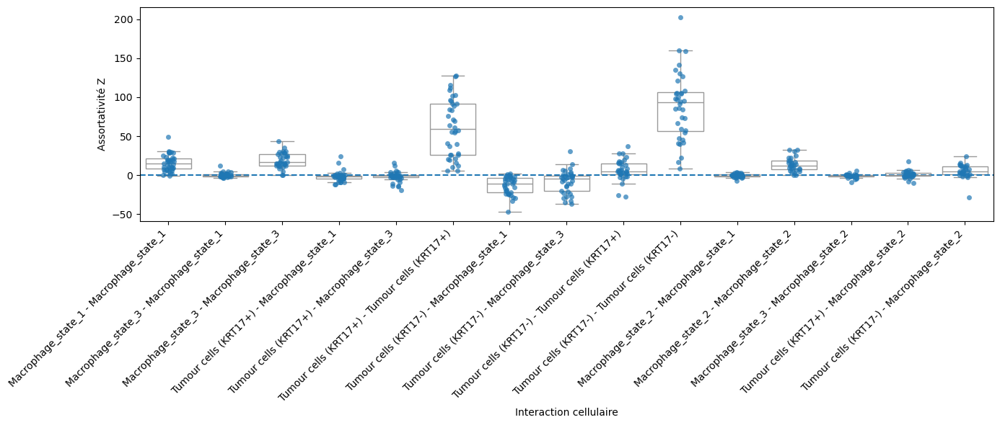

In [179]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# =====================================================
# 1) Cell types d'intérêt
# =====================================================

celltypes_interest = [
    "Tumour cells (KRT17-)",
    "Tumour cells (KRT17+)",
    "Macrophage_state_3",
    "Macrophage_state_1",
    "Macrophage_state_2",
]


# =====================================================
# 2) Récupérer les colonnes d'assortativité
# =====================================================

net_stat_indexed = net_stat.set_index("id").copy()


assort_cols = [
    col for col in net_stat_indexed.columns
    if col.endswith(" Z") and col != "assort Z"
]



# =====================================================
# 3) Garder uniquement les interactions d'intérêt
# =====================================================

selected_pairs = []

for col in assort_cols:

    pair = col.replace(" Z", "")

    if " - " not in pair:
        continue

    a, b = pair.split(" - ")

    if (
        a in celltypes_interest
        and b in celltypes_interest
    ):
        selected_pairs.append(col)



print("Interactions utilisées :")
print(selected_pairs)



# =====================================================
# 4) Transformer en format long
# =====================================================

plot_df = (
    net_stat_indexed[selected_pairs]
    .reset_index()
    .melt(
        id_vars="id",
        var_name="Interaction",
        value_name="Assortativity_Z"
    )
)


# enlever le Z dans le nom
plot_df["Interaction"] = (
    plot_df["Interaction"]
    .str.replace(" Z", "")
)



# =====================================================
# 5) Plot
# =====================================================

plt.figure(
    figsize=(14,6)
)


sns.boxplot(
    data=plot_df,
    x="Interaction",
    y="Assortativity_Z",
    color="white",
    showfliers=False
)


sns.stripplot(
    data=plot_df,
    x="Interaction",
    y="Assortativity_Z",
    jitter=True,
    size=5,
    alpha=0.7
)


plt.axhline(
    0,
    linestyle="--"
)


plt.xticks(
    rotation=45,
    ha="right"
)


plt.ylabel(
    "Assortativité Z"
)

plt.xlabel(
    "Interaction cellulaire"
)


plt.tight_layout()

plt.show()

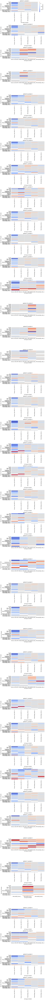

In [181]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# =====================================================
# Cell types d'intérêt
# =====================================================

celltypes_interest = [
    "Tumour cells (KRT17-)",
    "Tumour cells (KRT17+)",
    "Macrophage_state_3",
    "Macrophage_state_1",
    "Macrophage_state_2",
]


# =====================================================
# Préparer les données
# =====================================================

net_stat_indexed = net_stat.set_index("id").copy()

assort_cols = [
    col for col in net_stat_indexed.columns
    if col.endswith(" Z") and col != "assort Z"
]


# =====================================================
# Fonction pour construire une heatmap d'un sample
# =====================================================

def make_heatmap_matrix(sample_id):

    assort_values = (
        net_stat_indexed
        .loc[sample_id, assort_cols]
        .astype(float)
    )


    # récupérer les cell types
    celltypes = set()

    for pair in assort_values.index:
        pair = pair.replace(" Z", "")

        if " - " in pair:
            a, b = pair.split(" - ")
            celltypes.update([a, b])


    celltypes = sorted(celltypes)


    # matrice
    assort_matrix = pd.DataFrame(
        np.nan,
        index=celltypes,
        columns=celltypes
    )


    for pair, score in assort_values.items():

        pair = pair.replace(" Z", "")

        if " - " not in pair:
            continue

        a, b = pair.split(" - ")

        assort_matrix.loc[a,b] = score
        assort_matrix.loc[b,a] = score


    # colonnes d'intérêt
    heatmap_df = assort_matrix[celltypes_interest].copy()


    # masquer diagonale
    for ct in heatmap_df.index:
        if ct in heatmap_df.columns:
            heatmap_df.loc[ct, ct] = np.nan


    heatmap_df = heatmap_df.replace(
        [np.inf, -np.inf],
        np.nan
    )

    heatmap_df = heatmap_df.dropna(
        axis=0,
        how="all"
    )

    heatmap_df = heatmap_df.dropna(
        axis=1,
        how="all"
    )


    # cell types d'intérêt en bas
    other_cells = [
        x for x in heatmap_df.index
        if x not in celltypes_interest
    ]

    interest_cells = [
        x for x in celltypes_interest
        if x in heatmap_df.index
    ]

    heatmap_df = heatmap_df.loc[
        other_cells + interest_cells
    ]


    return heatmap_df



# =====================================================
# Faire toutes les heatmaps
# =====================================================

samples = net_stat_indexed.index


n = len(samples)

fig, axes = plt.subplots(
    nrows=n,
    figsize=(8, 4*n),
    squeeze=False
)


for i, sample in enumerate(samples):

    heatmap_df = make_heatmap_matrix(sample)

    sns.heatmap(
        heatmap_df,
        ax=axes[i,0],
        cmap="coolwarm",
        center=0,
        linewidths=0.5,
        linecolor="white",
        cbar=i == 0,
        cbar_kws={"label":"Assortativité Z"}
    )

    axes[i,0].set_title(sample)

    axes[i,0].set_xlabel(
        "Cell types d'intérêt"
    )

    axes[i,0].set_ylabel(
        "Tous les cell types"
    )


plt.tight_layout()
plt.show()

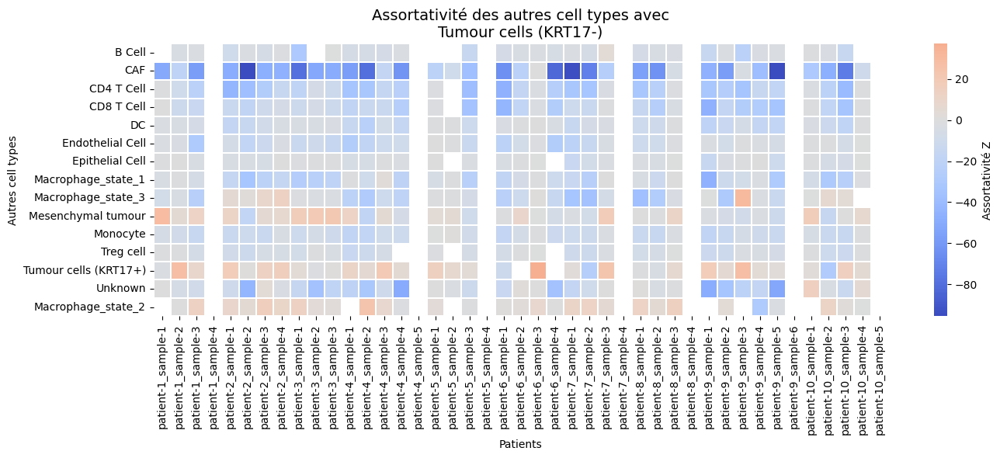

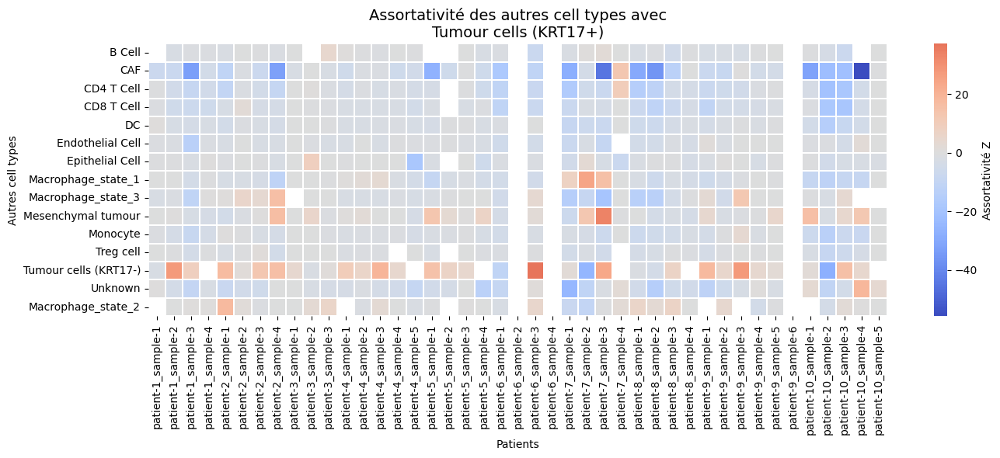

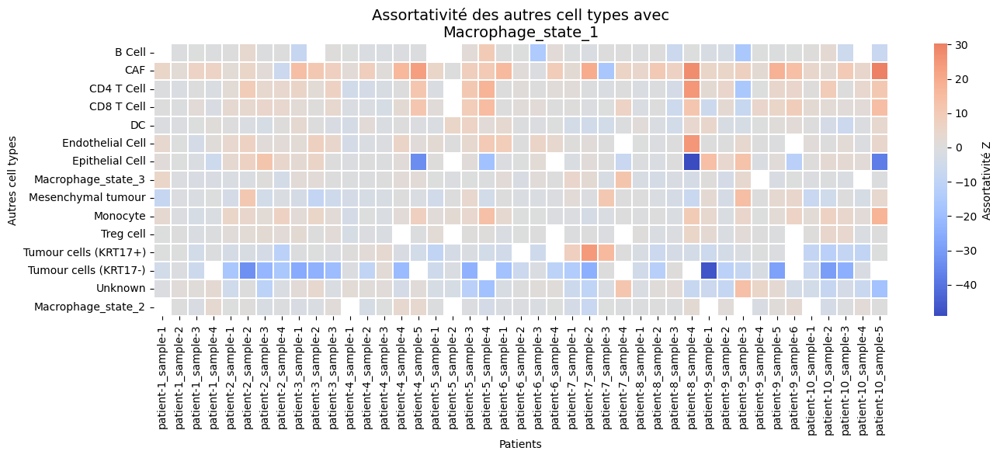

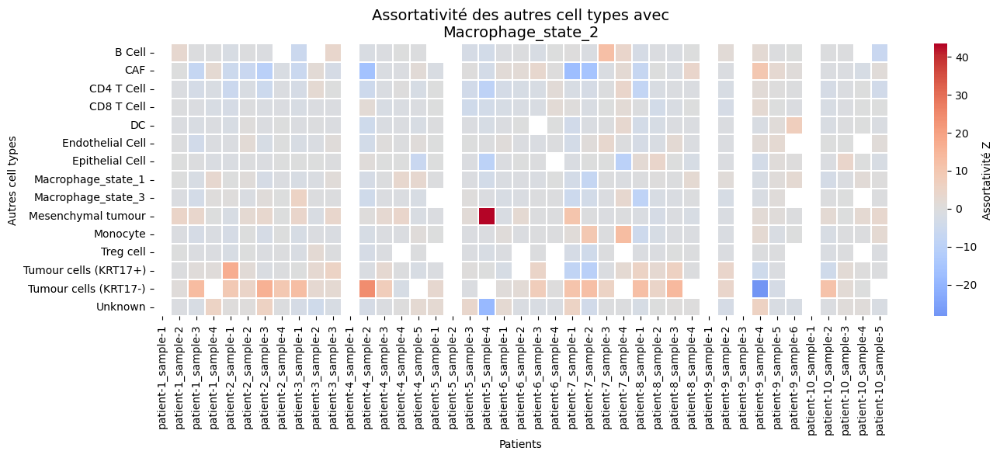

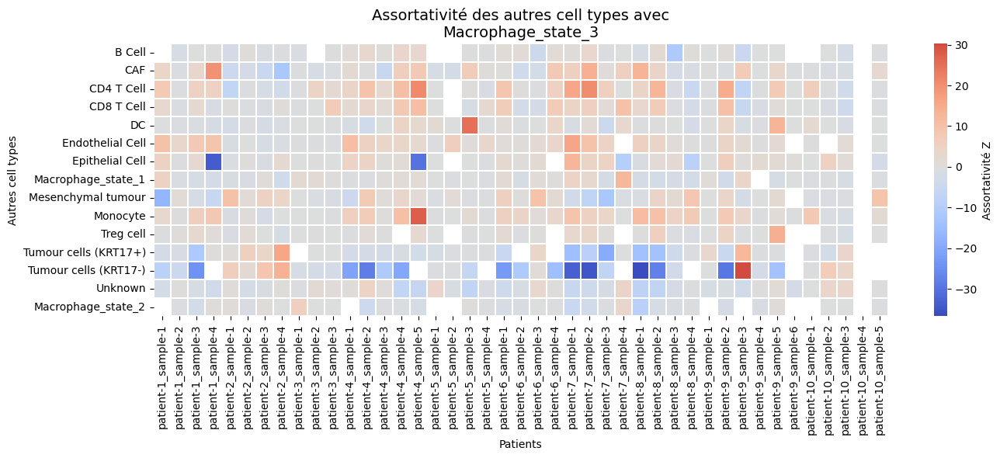

In [190]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# =====================================================
# Cell types d'intérêt
# =====================================================

celltypes_interest = [
    "Tumour cells (KRT17-)",
    "Tumour cells (KRT17+)",
    "Macrophage_state_1",   
    "Macrophage_state_2",
    "Macrophage_state_3",
]


# =====================================================
# Préparer les données
# =====================================================

net_stat_indexed = net_stat.set_index("id").copy()

assort_cols = [
    col for col in net_stat_indexed.columns
    if col.endswith(" Z") and col != "assort Z"
]


# =====================================================
# Fonction tri des samples
# patient-1_sample-1 -> patient 1, sample 1
# =====================================================

def sort_samples(columns):

    def extract_order(x):

        parts = x.split("_")

        patient = int(
            parts[0].replace("patient-", "")
        )

        sample = int(
            parts[1].replace("sample-", "")
        )

        return patient, sample

    return sorted(
        columns,
        key=extract_order
    )


# =====================================================
# Fonction extraction assortativité
# pour un cell type d'intérêt
# =====================================================

def get_assort_for_celltype_interest(celltype_interest):

    result = pd.DataFrame()

    for sample in net_stat_indexed.index:

        assort_values = (
            net_stat_indexed
            .loc[sample, assort_cols]
            .astype(float)
        )

        values = {}

        for pair, score in assort_values.items():

            pair_clean = pair.replace(" Z", "")

            # garder uniquement les associations
            # contenant le cell type d'intérêt
            if celltype_interest not in pair_clean:
                continue


            # récupérer l'autre cell type
            other = (
                pair_clean
                .replace(celltype_interest, "")
                .replace(" - ", "")
                .strip()
            )


            # enlever la diagonale
            if other == "":
                continue


            values[other] = score


        result = pd.concat(
            [
                result,
                pd.Series(values, name=sample)
            ],
            axis=1
        )


    result.index.name = "Cell type"
    result.columns.name = "Patient"

    return result



# =====================================================
# Faire un plot par cell type d'intérêt
# =====================================================

for ct_interest in celltypes_interest:


    heatmap_df = get_assort_for_celltype_interest(ct_interest)


    # nettoyage
    heatmap_df = heatmap_df.replace(
        [np.inf, -np.inf],
        np.nan
    )


    # supprimer les lignes vides
    heatmap_df = heatmap_df.dropna(
        axis=0,
        how="all"
    )


    # =================================================
    # TRI DES PATIENTS
    # patient-1_sample-1
    # patient-1_sample-2
    # patient-2_sample-1
    # =================================================

    heatmap_df = heatmap_df[
        sort_samples(heatmap_df.columns)
    ]


    # =================================================
    # Heatmap
    # =================================================

    plt.figure(
        figsize=(
            14,
            max(6, len(heatmap_df)*0.3)
        )
    )


    sns.heatmap(
        heatmap_df,
        cmap="coolwarm",
        center=0,
        linewidths=0.3,
        linecolor="white",
        cbar_kws={
            "label": "Assortativité Z"
        }
    )


    plt.title(
        f"Assortativité des autres cell types avec\n{ct_interest}",
        fontsize=14
    )


    plt.xlabel(
        "Patients"
    )

    plt.ylabel(
        "Autres cell types"
    )


    plt.xticks(
        rotation=90
    )


    plt.tight_layout()

    plt.show()

In [191]:
heatmap_df.stack().describe()

count    589.000000
mean       0.231559
std        6.532841
min      -36.693045
25%       -1.338611
50%       -0.185695
75%        2.464627
max       30.237695
dtype: float64

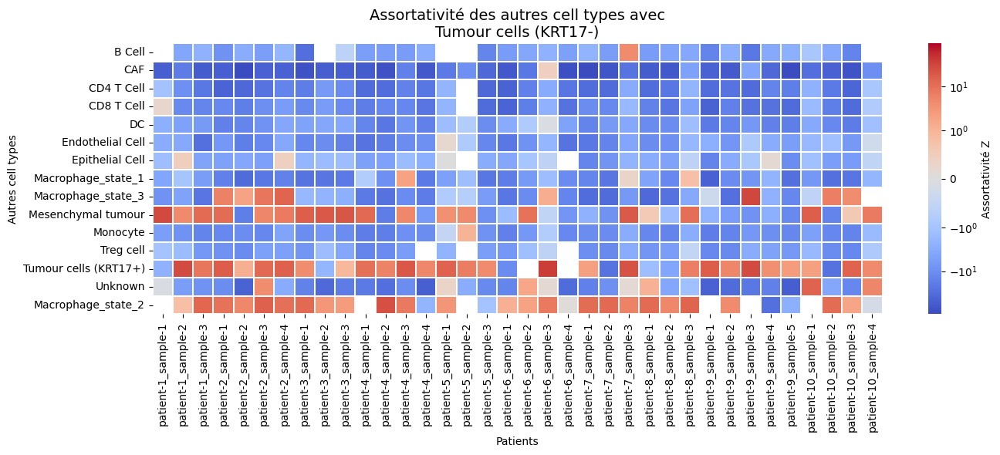

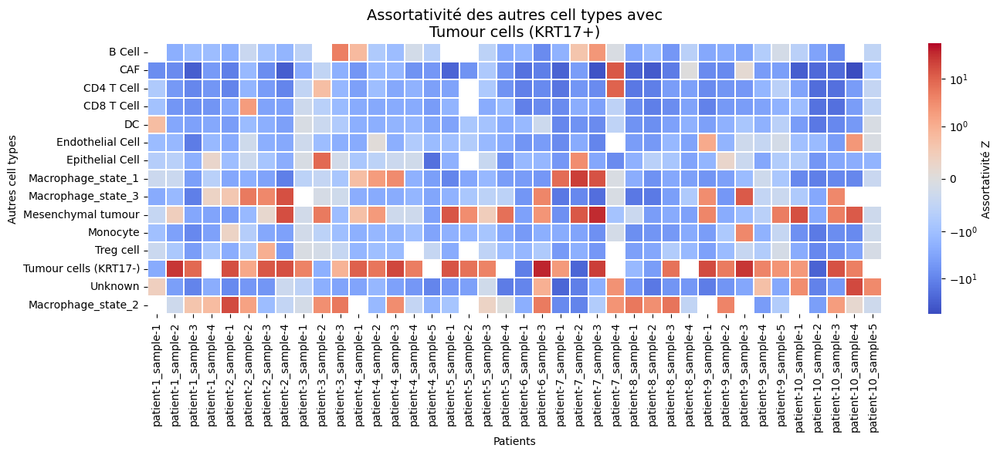

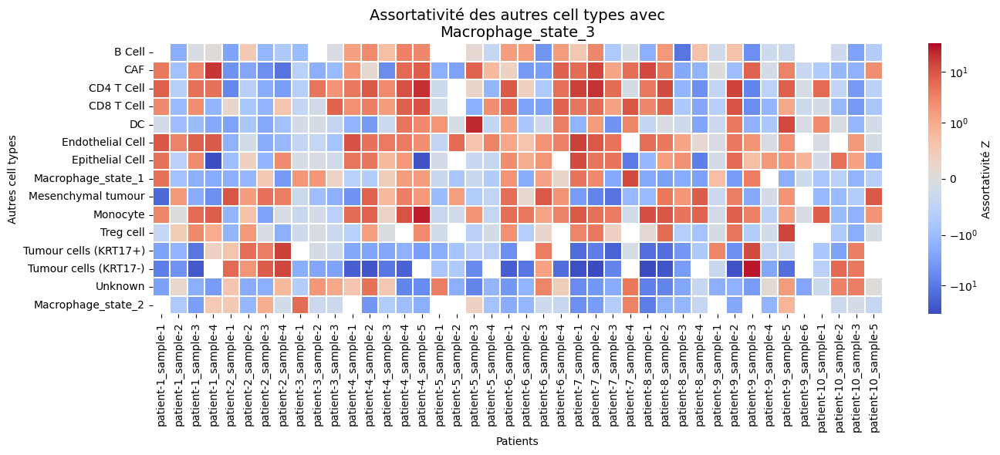

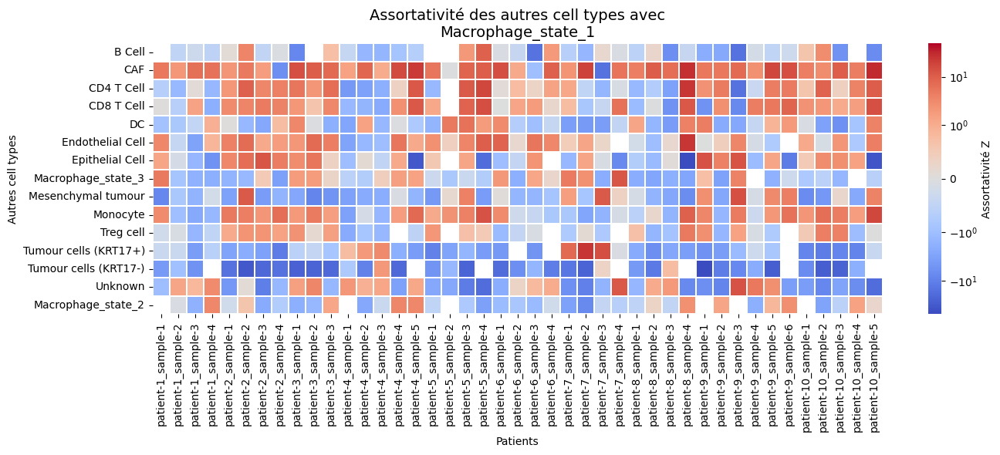

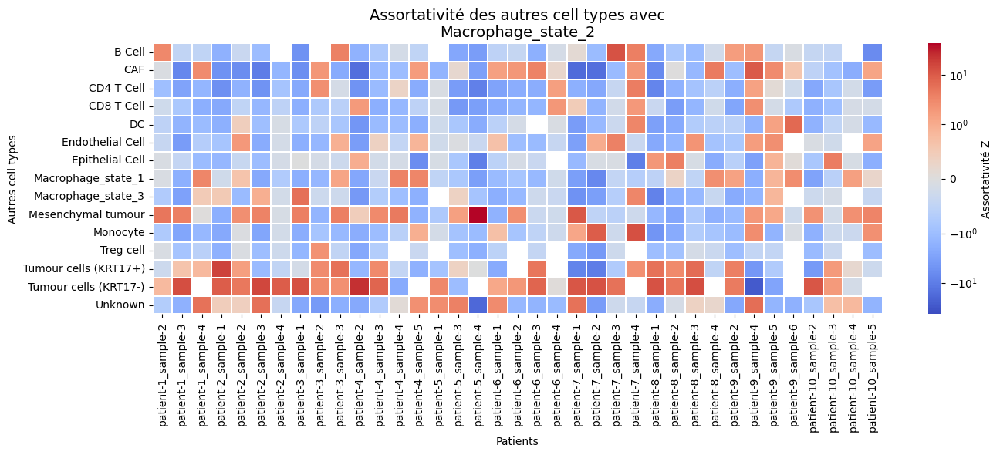

In [192]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import SymLogNorm


# =====================================================
# Cell types d'intérêt
# =====================================================

celltypes_interest = [
    "Tumour cells (KRT17-)",
    "Tumour cells (KRT17+)",
    "Macrophage_state_3",   
    "Macrophage_state_1",
    "Macrophage_state_2",
]


# =====================================================
# Préparer les données
# =====================================================

net_stat_indexed = net_stat.set_index("id").copy()

assort_cols = [
    col for col in net_stat_indexed.columns
    if col.endswith(" Z") and col != "assort Z"
]


# =====================================================
# Trier les samples
# patient-1_sample-1
# patient-1_sample-2
# patient-2_sample-1
# =====================================================

def sort_samples(columns):

    def extract_order(x):

        parts = x.split("_")

        patient = int(
            parts[0].replace("patient-", "")
        )

        sample = int(
            parts[1].replace("sample-", "")
        )

        return patient, sample

    return sorted(
        columns,
        key=extract_order
    )


# =====================================================
# Extraction assortativité
# =====================================================

def get_assort_for_celltype_interest(celltype_interest):

    result = pd.DataFrame()

    for sample in net_stat_indexed.index:

        assort_values = (
            net_stat_indexed
            .loc[sample, assort_cols]
            .astype(float)
        )

        values = {}

        for pair, score in assort_values.items():

            pair_clean = pair.replace(" Z", "")

            if celltype_interest not in pair_clean:
                continue


            other = (
                pair_clean
                .replace(celltype_interest, "")
                .replace(" - ", "")
                .strip()
            )


            # enlever diagonale
            if other == "":
                continue


            values[other] = score


        result = pd.concat(
            [
                result,
                pd.Series(values, name=sample)
            ],
            axis=1
        )


    result.index.name = "Cell type"
    result.columns.name = "Patient"

    return result



# =====================================================
# Heatmaps
# =====================================================

for ct_interest in celltypes_interest:


    heatmap_df = get_assort_for_celltype_interest(
        ct_interest
    )


    # nettoyage
    heatmap_df = heatmap_df.replace(
        [np.inf, -np.inf],
        np.nan
    )


    heatmap_df = heatmap_df.dropna(
        axis=0,
        how="all"
    )


    # ordre patients
    heatmap_df = heatmap_df[
        sort_samples(heatmap_df.columns)
    ]


    # supprimer colonnes entièrement vides
    heatmap_df = heatmap_df.dropna(
        axis=1,
        how="all"
    )


    # =================================================
    # Echelle SymLog
    # =================================================

    vmax = max(
        abs(heatmap_df.min().min()),
        abs(heatmap_df.max().max())
    )


    norm = SymLogNorm(
        linthresh=1,   # zone linéaire autour de 0
        linscale=1,
        vmin=-vmax,
        vmax=vmax
    )


    # =================================================
    # Plot
    # =================================================

    plt.figure(
        figsize=(
            14,
            max(6, len(heatmap_df)*0.3)
        )
    )


    sns.heatmap(
        heatmap_df,
        cmap="coolwarm",
        norm=norm,
        linewidths=0.3,
        linecolor="white",
        cbar_kws={
            "label": "Assortativité Z"
        }
    )


    plt.title(
        f"Assortativité des autres cell types avec\n{ct_interest}",
        fontsize=14
    )


    plt.xlabel(
        "Patients"
    )

    plt.ylabel(
        "Autres cell types"
    )


    plt.xticks(
        rotation=90
    )


    plt.tight_layout()

    plt.show()

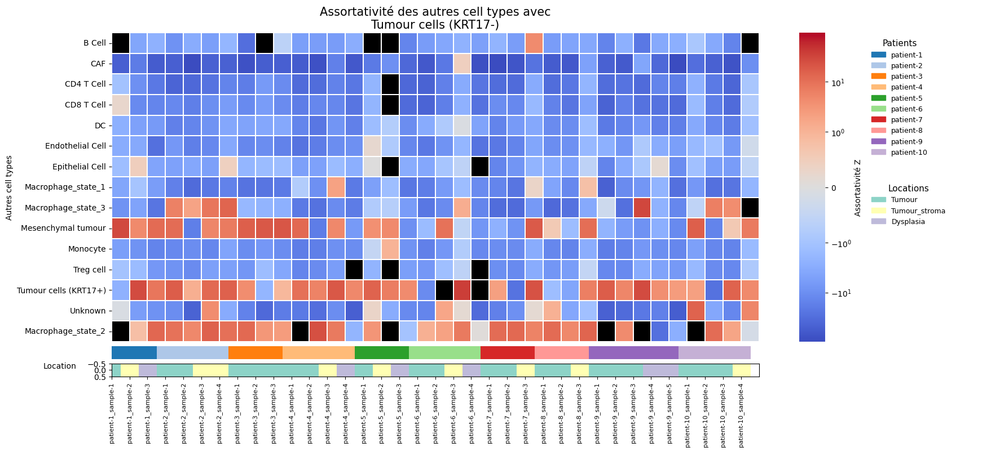

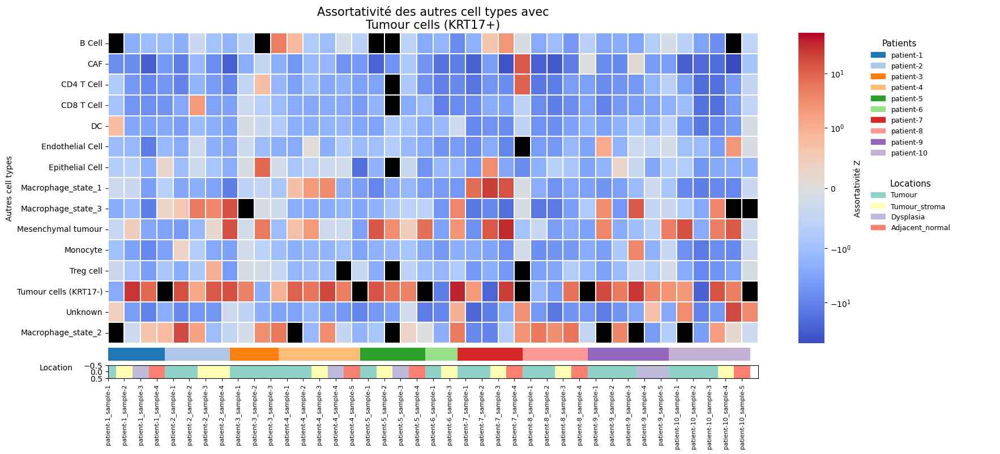

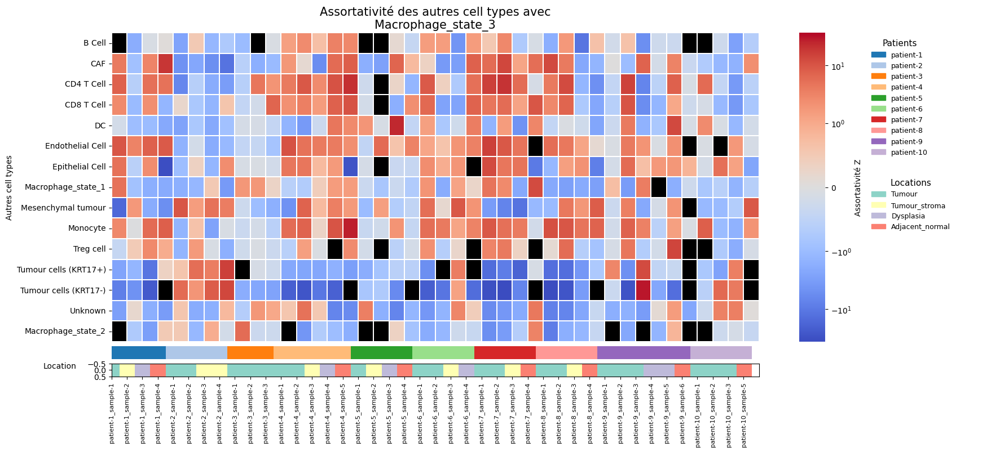

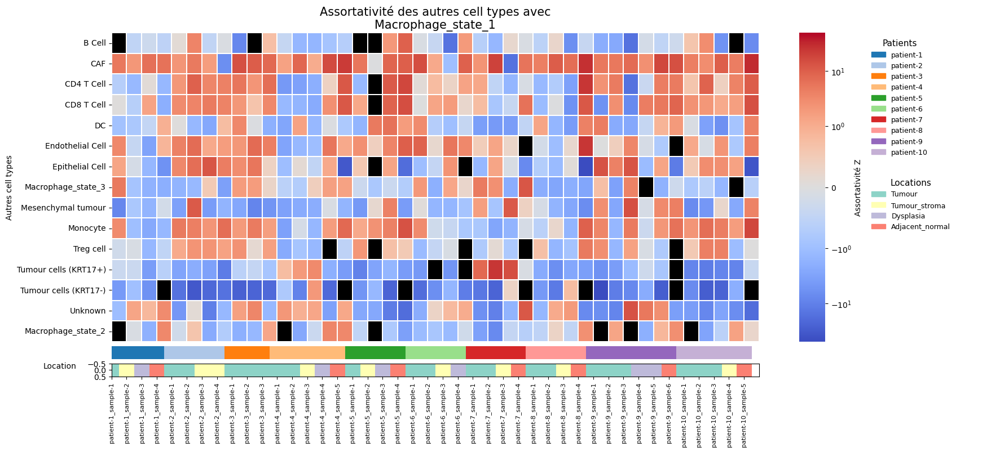

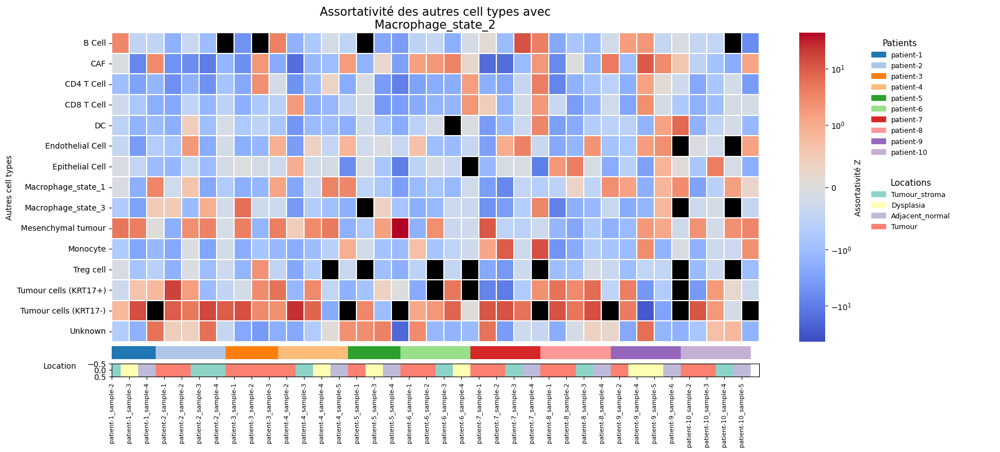

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib.patches as mpatches

from matplotlib.colors import SymLogNorm, ListedColormap
from matplotlib.gridspec import GridSpec


# =====================================================
# Cell types d'intérêt
# =====================================================

celltypes_interest = [
    "Tumour cells (KRT17-)",
    "Tumour cells (KRT17+)",
    "Macrophage_state_3",   
    "Macrophage_state_1",
    "Macrophage_state_2",
]


# =====================================================
# Préparer les données
# =====================================================

net_stat_indexed = net_stat.set_index("id").copy()


assort_cols = [
    col for col in net_stat_indexed.columns
    if col.endswith(" Z") and col != "assort Z"
]



# =====================================================
# Trier les samples
# =====================================================

def sort_samples(columns):

    def extract_order(x):

        parts = x.split("_")

        patient = int(
            parts[0].replace("patient-", "")
        )

        sample = int(
            parts[1].replace("sample-", "")
        )

        return patient, sample


    return sorted(
        columns,
        key=extract_order
    )



# =====================================================
# Extraction assortativité
# =====================================================

def get_assort_for_celltype_interest(celltype_interest):

    result = pd.DataFrame()


    for sample in net_stat_indexed.index:


        assort_values = (
            net_stat_indexed
            .loc[sample, assort_cols]
            .astype(float)
        )


        values = {}


        for pair, score in assort_values.items():


            pair_clean = pair.replace(" Z", "")


            if celltype_interest not in pair_clean:
                continue



            other = (
                pair_clean
                .replace(celltype_interest, "")
                .replace(" - ", "")
                .strip()
            )


            if other == "":
                continue


            values[other] = score



        result = pd.concat(
            [
                result,
                pd.Series(
                    values,
                    name=sample
                )
            ],
            axis=1
        )


    result.index.name = "Cell type"
    result.columns.name = "Patient"


    return result



# =====================================================
# Couleurs patients
# =====================================================

def patient_annotation(samples):


    patient_series = pd.Series(
        samples.str.split("_").str[0],
        index=samples
    )


    unique_patients = sorted(
        patient_series.unique(),
        key=lambda x: int(x.split("-")[-1])
    )


    palette = sns.color_palette(
        "tab20",
        len(unique_patients)
    )


    patient_to_color = dict(
        zip(unique_patients, palette)
    )


    patient_int = np.array(
        [
            unique_patients.index(p)
            for p in patient_series
        ]
    )


    cmap = ListedColormap(
        [
            patient_to_color[p]
            for p in unique_patients
        ]
    )


    return (
        patient_int,
        cmap,
        patient_to_color,
        unique_patients
    )



# =====================================================
# Couleurs localisation
# =====================================================

def location_annotation(samples):


    location_series = (
        net_stat_indexed
        .loc[samples, "region_grouped"]
    )


    unique_locations = (
        location_series
        .dropna()
        .unique()
    )


    palette = sns.color_palette(
        "Set3",
        len(unique_locations)
    )


    location_to_color = dict(
        zip(unique_locations, palette)
    )


    location_int = np.array(
        [
            list(unique_locations).index(x)
            for x in location_series
        ]
    )


    cmap = ListedColormap(
        [
            location_to_color[x]
            for x in unique_locations
        ]
    )


    return (
        location_int,
        cmap,
        location_to_color,
        unique_locations
    )



# =====================================================
# Heatmaps
# =====================================================


for ct_interest in celltypes_interest:


    heatmap_df = get_assort_for_celltype_interest(
        ct_interest
    )


    heatmap_df = heatmap_df.replace(
        [np.inf, -np.inf],
        np.nan
    )


    heatmap_df = heatmap_df.dropna(
        axis=0,
        how="all"
    )


    heatmap_df = heatmap_df.dropna(
        axis=1,
        how="all"
    )


    # ordre patient/sample
    heatmap_df = heatmap_df[
        sort_samples(
            heatmap_df.columns
        )
    ]



    # =================================================
    # Normalisation SymLog
    # =================================================

    vals = heatmap_df.values

    valid_vals = vals[
        ~np.isnan(vals)
    ]


    zlim = np.max(
        np.abs(valid_vals)
    )


    norm = SymLogNorm(
        linthresh=1,
        linscale=1,
        vmin=-zlim,
        vmax=zlim
    )



    # =================================================
    # Annotations
    # =================================================

    patient_int, patient_cmap, patient_colors, patients = (
        patient_annotation(
            heatmap_df.columns
        )
    )


    location_int, location_cmap, location_colors, locations = (
        location_annotation(
            heatmap_df.columns
        )
    )

    if location_colors_plalette = True
        location_colors = location_to_color
        


    # =================================================
    # Figure
    # =================================================

# =================================================
# Figure
# =================================================

    fig = plt.figure(
        figsize=(
            18,
            max(8, len(heatmap_df)*0.35)
        )
    )


    gs = GridSpec(
        nrows=4,
        ncols=3,
        width_ratios=[20, 0.8, 4],
        height_ratios=[1, 12, 0.5, 0.5],
        hspace=0.05,
        wspace=0.15
    )


    ax_heat = fig.add_subplot(gs[1,0])


    ax_patient = fig.add_subplot(
        gs[2,0],
        sharex=ax_heat
    )


    ax_location = fig.add_subplot(
        gs[3,0],
        sharex=ax_heat
    )


    # petite colonne uniquement pour colorbar
    ax_cbar = fig.add_subplot(
        gs[1,1]
    )


    # grande colonne pour légendes
    ax_leg = fig.add_subplot(
        gs[1:,2]
    )

    # =================================================
    # Heatmap
    # =================================================

    cmap = plt.cm.coolwarm.copy()
    cmap.set_bad("black")


    sns.heatmap(
        heatmap_df,
        cmap=cmap,
        norm=norm,
        ax=ax_heat,
        linewidths=0.3,
        linecolor="white",
        cbar=True,
        cbar_ax=ax_cbar,
        cbar_kws={
            "label": "Assortativité Z"
        },
        xticklabels=False,
        yticklabels=True
    )

    ax_heat.tick_params(
    axis="x",
    bottom=False,
    labelbottom=False
)
    ax_heat.set_title(
        f"Assortativité des autres cell types avec\n{ct_interest}",
        fontsize=15
    )


    ax_heat.set_ylabel(
        "Autres cell types"
    )

    ax_heat.set_xlabel("")



    # =================================================
    # Bande patient
    # =================================================

    ax_patient.imshow(
        patient_int[np.newaxis,:],
        aspect="auto",
        cmap=patient_cmap,
        interpolation="nearest"
    )


    ax_patient.set_ylabel(
        "Patient",
        rotation=0,
        labelpad=35
    )

    ax_patient.axis("off")



    # =================================================
    # Bande location
    # =================================================

    ax_location.imshow(
        location_int[np.newaxis,:],
        aspect="auto",
        cmap=location_cmap,
        interpolation="nearest"
    )


    ax_location.set_ylabel(
        "Location",
        rotation=0,
        labelpad=35
    )


    ax_location.set_xticks(
        np.arange(len(heatmap_df.columns))
    )


    ax_location.set_xticklabels(
        heatmap_df.columns,
        rotation=90,
        fontsize=8
    )


    # =================================================
    # Légendes
    # =================================================

    ax_leg.axis("off")


    patient_handles = [
        mpatches.Patch(
            color=patient_colors[p],
            label=p
        )
        for p in patients
    ]


    location_handles = [
        mpatches.Patch(
            color=location_colors[l],
            label=l
        )
        for l in locations
    ]


    ax_leg.axis("off")


    leg1 = ax_leg.legend(
        handles=patient_handles,
        title="Patients",
        loc="upper left",
        frameon=False,
        fontsize=9,
        title_fontsize=11
    )


    ax_leg.add_artist(leg1)


    ax_leg.legend(
            handles=location_handles,
            title="Locations",
        loc="center left",
        frameon=False,
        fontsize=9,
        title_fontsize=11
    )

    ax_cbar.set_ylabel(
        "Assortativité Z"
    )


    plt.subplots_adjust(
    left=0.08,
    right=0.95,
    top=0.95,
    bottom=0.12,
    wspace=0.15,
    hspace=0.05
)
    plt.show()

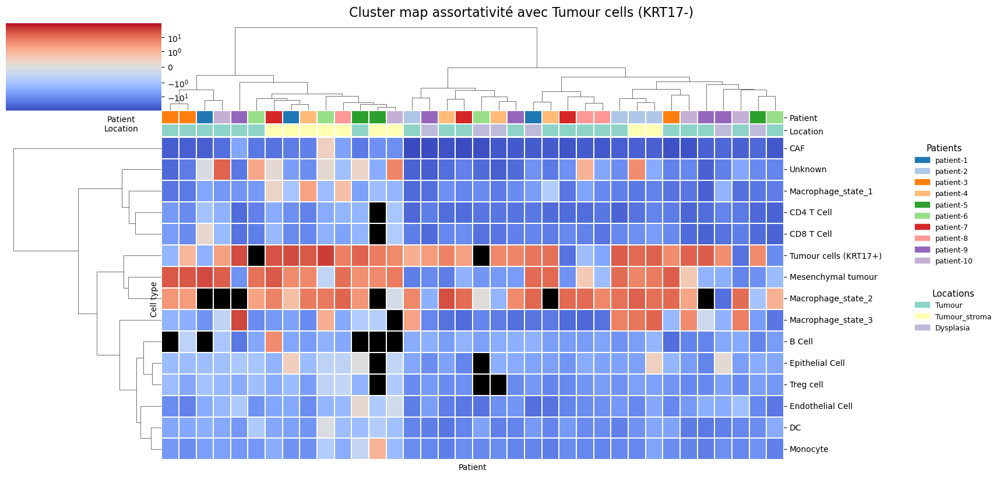

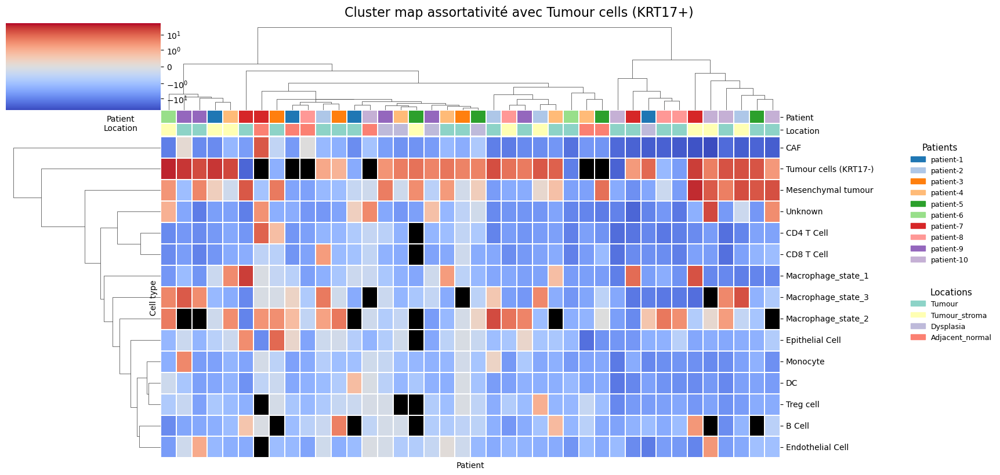

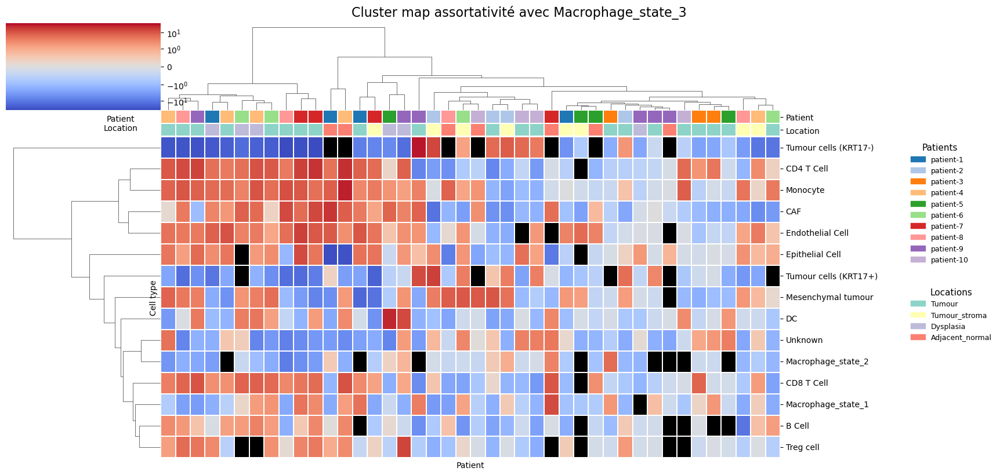

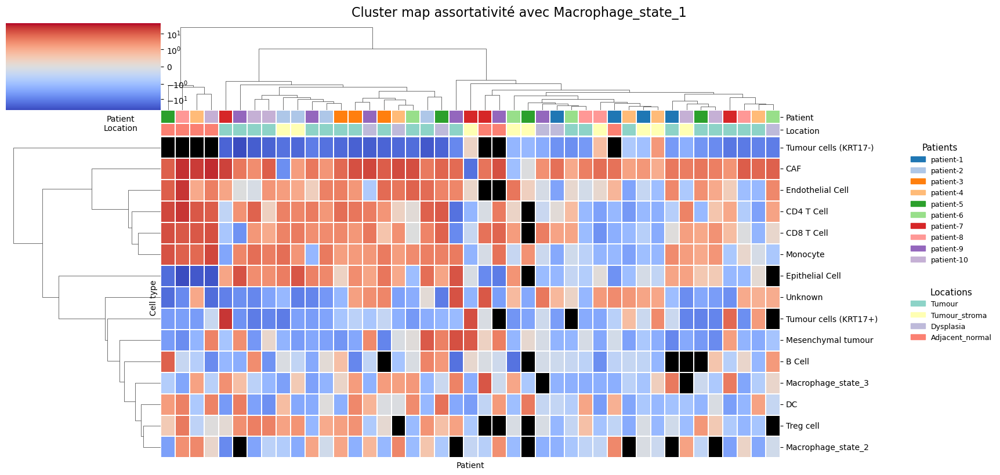

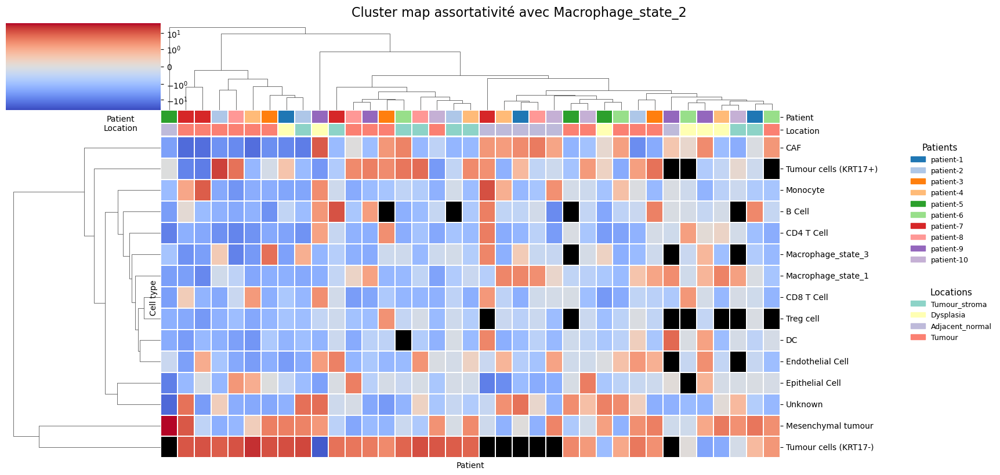

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib.patches as mpatches

from matplotlib.colors import SymLogNorm, ListedColormap
from matplotlib.gridspec import GridSpec


# =====================================================
# Cell types d'intérêt
# =====================================================



# =====================================================
# Préparer les données
# =====================================================

net_stat_indexed = net_stat.set_index("id").copy()


assort_cols = [
    col for col in net_stat_indexed.columns
    if col.endswith(" Z") and col != "assort Z"
]



# =====================================================
# Trier les samples
# =====================================================

def sort_samples(columns):

    def extract_order(x):

        parts = x.split("_")

        patient = int(
            parts[0].replace("patient-", "")
        )

        sample = int(
            parts[1].replace("sample-", "")
        )

        return patient, sample


    return sorted(
        columns,
        key=extract_order
    )



# =====================================================
# Extraction assortativité
# =====================================================

def get_assort_for_celltype_interest(celltype_interest):

    result = pd.DataFrame()


    for sample in net_stat_indexed.index:


        assort_values = (
            net_stat_indexed
            .loc[sample, assort_cols]
            .astype(float)
        )


        values = {}


        for pair, score in assort_values.items():


            pair_clean = pair.replace(" Z", "")


            if celltype_interest not in pair_clean:
                continue



            other = (
                pair_clean
                .replace(celltype_interest, "")
                .replace(" - ", "")
                .strip()
            )


            if other == "":
                continue


            values[other] = score



        result = pd.concat(
            [
                result,
                pd.Series(
                    values,
                    name=sample
                )
            ],
            axis=1
        )


    result.index.name = "Cell type"
    result.columns.name = "Patient"


    return result



# =====================================================
# Couleurs patients
# =====================================================

def patient_annotation(samples):


    patient_series = pd.Series(
        samples.str.split("_").str[0],
        index=samples
    )


    unique_patients = sorted(
        patient_series.unique(),
        key=lambda x: int(x.split("-")[-1])
    )


    palette = sns.color_palette(
        "tab20",
        len(unique_patients)
    )


    patient_to_color = dict(
        zip(unique_patients, palette)
    )


    patient_int = np.array(
        [
            unique_patients.index(p)
            for p in patient_series
        ]
    )


    cmap = ListedColormap(
        [
            patient_to_color[p]
            for p in unique_patients
        ]
    )


    return (
        patient_int,
        cmap,
        patient_to_color,
        unique_patients
    )



# =====================================================
# Couleurs localisation
# =====================================================

def location_annotation(samples):


    location_series = (
        net_stat_indexed
        .loc[samples, "region_grouped"]
    )


    unique_locations = (
        location_series
        .dropna()
        .unique()
    )


    palette = sns.color_palette(
        "Set3",
        len(unique_locations)
    )


    location_to_color = dict(
        zip(unique_locations, palette)
    )


    location_int = np.array(
        [
            list(unique_locations).index(x)
            for x in location_series
        ]
    )


    cmap = ListedColormap(
        [
            location_to_color[x]
            for x in unique_locations
        ]
    )


    return (
        location_int,
        cmap,
        location_to_color,
        unique_locations
    )





    # =================================================
    # Normalisation SymLog
    # =================================================

    vals = heatmap_df.values

    valid_vals = vals[
        ~np.isnan(vals)
    ]


    zlim = np.max(
        np.abs(valid_vals)
    )


    norm = SymLogNorm(
        linthresh=1,
        linscale=1,
        vmin=-zlim,
        vmax=zlim
    )



    # =================================================
    # Annotations
    # =================================================

    patient_int, patient_cmap, patient_colors, patients = (
        patient_annotation(
            heatmap_df.columns
        )
    )


    location_int, location_cmap, location_colors, locations = (
        location_annotation(
            heatmap_df.columns
        )
    )



    # =================================================
    # Figure
    # =================================================

from matplotlib.colors import TwoSlopeNorm


# =====================================================
# ClusterMap
# =====================================================


for ct_interest in celltypes_interest:


    heatmap_df = get_assort_for_celltype_interest(
        ct_interest
    )


    heatmap_df = heatmap_df.replace(
        [np.inf, -np.inf],
        np.nan
    )


    heatmap_df = heatmap_df.dropna(
        axis=0,
        how="all"
    )


    heatmap_df = heatmap_df.dropna(
        axis=1,
        how="all"
    )


    # ordre initial patient/sample
    heatmap_df = heatmap_df[
        sort_samples(
            heatmap_df.columns
        )
    ]


    # =================================================
    # Normalisation couleur
    # =================================================

    vals = heatmap_df.values

    valid_vals = vals[
        ~np.isnan(vals)
    ]


    # =================================================
    # Normalisation SymLog
    # =================================================

    zlim = np.nanmax(
        np.abs(valid_vals)
    )


    norm = SymLogNorm(
        linthresh=1,
        linscale=1,
        vmin=-zlim,
        vmax=zlim
    )

    cmap = plt.cm.coolwarm.copy()
    cmap.set_bad("black")



    # =================================================
    # Annotation patient
    # =================================================

    patient_series = pd.Series(
        heatmap_df.columns.str.split("_").str[0],
        index=heatmap_df.columns
    )


    patient_palette = sns.color_palette(
        "tab20",
        patient_series.nunique()
    )


    patient_colors_dict = dict(
        zip(
            patient_series.unique(),
            patient_palette
        )
    )


    patient_colors = pd.DataFrame(
        {
            "Patient":
            patient_series.map(
                patient_colors_dict
            )
        }
    )



    # =================================================
    # Annotation location
    # =================================================

    location_series = (
        net_stat_indexed
        .loc[
            heatmap_df.columns,
            "region_grouped"
        ]
    )


    location_palette = sns.color_palette(
        "Set3",
        location_series.nunique()
    )


    location_colors_dict = dict(
        zip(
            location_series.unique(),
            location_palette
        )
    )


    location_colors = pd.DataFrame(
        {
            "Location":
            location_series.map(
                location_colors_dict
            )
        }
    )



    col_colors = pd.concat(
        [
            patient_colors,
            location_colors
        ],
        axis=1
    )



    # =================================================
    # ClusterMap
    # =================================================

     # =================================================
    # Matrice pour clustering uniquement
    # =================================================

    heatmap_cluster = heatmap_df.fillna(0)


    # =================================================
    # ClusterMap
    # =================================================

    g = sns.clustermap(

        heatmap_cluster,

        cmap=cmap,

        norm=norm,

        row_cluster=True,
        col_cluster=True,

        method="ward",
        metric="euclidean",

        linewidths=0.3,
        linecolor="white",

        figsize=(
            18,
            max(8, len(heatmap_cluster)*0.4)
        ),

        col_colors=col_colors,

        xticklabels=False,
        yticklabels=True,

        cbar_kws={
            "label":"Assortativité Z"
        }
    )


    # =================================================
    # Remettre les NaN en noir après clustering
    # =================================================

    row_order = g.dendrogram_row.reordered_ind
    col_order = g.dendrogram_col.reordered_ind


    heatmap_display = heatmap_df.iloc[
        row_order,
        col_order
    ]


    # remplacer l'image affichée par une version avec NaN
    g.ax_heatmap.clear()


    sns.heatmap(
        heatmap_display,

        cmap=cmap,

        norm=norm,

        ax=g.ax_heatmap,

        cbar_ax=g.cax,

        linewidths=0.3,

        linecolor="white",

        xticklabels=False,

        yticklabels=True
    )

    # =================================================
    # Titre
    # =================================================

    g.fig.suptitle(
        f"Cluster map assortativité avec {ct_interest}",
        y=1.02,
        fontsize=16
    )


    # =================================================
    # Labels des bandes couleurs
    # =================================================

    g.ax_col_colors.set_ylabel(
        "Patient\nLocation",
        rotation=0,
        labelpad=50,
        va="center"
    )
    # =================================================
    # Légendes Patient + Location
    # =================================================

    patient_handles = [
        mpatches.Patch(
            color=patient_colors_dict[p],
            label=p
        )
        for p in patient_colors_dict.keys()
    ]


    location_handles = [
        mpatches.Patch(
            color=location_colors_dict[l],
            label=l
        )
        for l in location_colors_dict.keys()
    ]


    # espace à droite pour les légendes
    g.fig.subplots_adjust(
        right=0.75
    )


    # légende patients
    leg1 = g.ax_heatmap.legend(
        handles=patient_handles,
        title="Patients",
        bbox_to_anchor=(1.20,1),
        loc="upper left",
        frameon=False,
        fontsize=9,
        title_fontsize=11
    )


    # légende locations
    leg2 = g.ax_heatmap.legend(
        handles=location_handles,
        title="Locations",
        bbox_to_anchor=(1.20,0.55),
        loc="upper left",
        frameon=False,
        fontsize=9,
        title_fontsize=11
    )


    g.ax_heatmap.add_artist(leg1)

    # =====================================================
# Export figure
# =====================================================

    output_name = (
        f"ClusterMap_assortativity_{ct_interest.replace(' ','_')}.png"
    )

    
    g.savefig(
        save_dir/output_name,
        dpi=300,
        bbox_inches="tight"
    )



    plt.show()

In [185]:
test = get_assort_for_celltype_interest("Macrophage_state_3")

print(test.shape)
print(test.head())

(15, 43)
Patient     patient-4_sample-1  patient-9_sample-4  patient-4_sample-5  \
Cell type                                                                
B Cell                1.325268           -0.267261            2.794783   
CAF                   1.802264           -0.172156            7.985788   
CD4 T Cell            4.154082           -0.539164           20.882748   
CD8 T Cell            2.185781           -1.314357           10.788650   
DC                   -1.402269           -0.782230            2.602901   

Patient     patient-1_sample-4  patient-8_sample-2  patient-3_sample-3  \
Cell type                                                                
B Cell                0.054447            1.753961           -0.081923   
CAF                  19.594062            4.101568           -1.072446   
CD4 T Cell            5.087496           12.555600            2.016737   
CD8 T Cell           -1.316575            7.021418            7.000000   
DC                   -2.0736